<a href="https://colab.research.google.com/github/Sun-of-a-beach/Music_Genre_Classification/blob/main/Music_Genre_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Mounting Google Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip uninstall numba
!pip install numba

Found existing installation: numba 0.58.1
Uninstalling numba-0.58.1:
  Would remove:
    /usr/local/bin/numba
    /usr/local/lib/python3.10/dist-packages/numba-0.58.1.dist-info/*
    /usr/local/lib/python3.10/dist-packages/numba/*
Proceed (Y/n)? Y
  Successfully uninstalled numba-0.58.1
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 35.0 MB/s eta 0:00:00


In [ ]:
!pip install category_encoders

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 1.1 MB/s eta 0:00:00


## **Installing and Importing Libraries**

In [ ]:
!pip install pandas
!pip install librosa

import numpy as np
import pandas as pd
import json
import os
import librosa
import math
from IPython.display import Audio
import matplotlib.pyplot as plt
import librosa.display
from librosa.feature import melspectrogram, spectral_contrast, chroma_stft, rms, spectral_centroid, spectral_rolloff, delta
from tqdm import tqdm
import seaborn as sns

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from category_encoders import TargetEncoder
from sklearn.preprocessing import LabelEncoder
import tensorflow as tf
from tensorflow.python.keras.layers import Input, Dense
from tensorflow import keras
from keras.regularizers import l2

## **Declaring Constants**

In [ ]:
DATASET_PATH = "/content/drive/MyDrive/GTZAN_Dataset/genres_original"
JSON_PATH = "/content/drive/MyDrive/GTZANfeaturesfile.json"
SAMPLE_RATE = 22050
DURATION = 30 # sec
SAMPLES_PER_TRACK = SAMPLE_RATE * DURATION


In [ ]:
# features_30 = pd.read_csv("/content/drive/MyDrive/GTZAN_Dataset/features_30_sec.csv")
# features_30

## **Function to calculate features, labels, Mapping and store it in a Json.**
This function in it's first for loop will go through the dataset path to each folders containing the genres of different audio files which are each 30 sec long. And then it will collect the genre names as it is traversing through using os.walk(). In it's next for loop it will go through each audio file load them with librosa.load()

We are going to use batching to create a list of all Audio Paths and then divide them into smaller batches. For which we are going to write a new function.

In [ ]:

def save_mfcc1(dataset_path, json_path, n_mfcc=13, n_fft=2048, hop_length=512, num_segments=5, batch_size=10):
    """
    dataset_path : The GTZAN folder
    json_path : path of the final JSON file
    n_mfcc : number of Mel frequency cepstral coefficients
    n_fft : number of samples for Fast Fourier Transform
    hop_length : hop length for MFCC calculation
    num_segments : number of segments per audio
    batch_size : number of audio files to process in each batch
    """

    ## Dictionary to store data
    data = {
        "mapping": [],
        "mfcc": [],
        "mfcc_delta": [],
        "mfcc_delta_delta": [],
        "labels": [],
        "mel_spectrogram": [],
        "contrast": [],
        "chroma": [],
        "autocorr": [],
        "rms_energy": [],
        "centroid": [],
        "rolloff": []
    }

    num_samples_per_segment = int(SAMPLES_PER_TRACK / num_segments)
    expected_num_mfcc_vec_per_segment = math.ceil(num_samples_per_segment / hop_length)

    ## Loop through all the genres
    for i, (dirpath, dirnames, filenames) in tqdm(enumerate(os.walk(dataset_path))):

        ## Ensure that we're not at root level
        if dirpath is not dataset_path:

            ## Saving the semantic label from the folder names
            dirpath_components = dirpath.split("/")
            semantic_label = dirpath_components[-1]
            data["mapping"].append(semantic_label)
            print("\nProcessing {}".format(semantic_label))

            ## Process files for a specific genre
            audio_files = [os.path.join(dirpath, f) for f in filenames]

            ## Calculate the total number of batches required
            num_batches = math.ceil(len(audio_files) / batch_size)

            ## Batch-wise processing
            for batch_idx in range(num_batches):
                start_idx = batch_idx * batch_size
                end_idx = min(start_idx + batch_size, len(audio_files))
                batch_files = audio_files[start_idx:end_idx]

                for file_path in batch_files:
                    signal, sr = librosa.load(file_path, sr=SAMPLE_RATE)

                    ## Process segments extracting MFCC and storing into the dict
                    for s in range(num_segments):
                        start_sample = num_samples_per_segment * s
                        finish_sample = start_sample + num_samples_per_segment

                        mfcc = librosa.feature.mfcc(y=signal[start_sample:finish_sample],
                                                    sr=sr,
                                                    n_mfcc=n_mfcc,
                                                    n_fft=n_fft,
                                                    hop_length=hop_length)
                        mfcc = mfcc.T

                        ## First derivative of MFCC
                        mfcc_delta = librosa.feature.delta(mfcc)

                        ## Second derivative of MFCC
                        delta2_mfcc = librosa.feature.delta(mfcc, order=2)

                        ## Mel Spectrogram
                        mel_spectrogram = librosa.feature.melspectrogram(y=signal[start_sample:finish_sample],
                                                                        sr=sr,
                                                                        n_fft=n_fft,
                                                                        hop_length=hop_length)
                        mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)

                        ## Spectral Contrast
                        contrast = librosa.feature.spectral_contrast(y=signal[start_sample:finish_sample],
                                                                      sr=sr,
                                                                      n_fft=n_fft,
                                                                      hop_length=hop_length)

                        ## Chroma feature
                        chroma = librosa.feature.chroma_stft(y=signal[start_sample:finish_sample],
                                                              sr=sr,
                                                              n_fft=n_fft,
                                                              hop_length=hop_length)

                        ## Autocorrelation
                        autocorr = np.correlate(signal[start_sample:finish_sample],
                                                signal[start_sample:finish_sample],
                                                mode='full')[len(signal[start_sample:finish_sample]) - 1:]

                        ## RMS energy
                        energy = librosa.feature.rms(y=signal[start_sample:finish_sample])

                        ## Spectral Centroid
                        centroid = librosa.feature.spectral_centroid(y=signal[start_sample:finish_sample], sr=sr)

                        ## Spectral Rolloff
                        rolloff = librosa.feature.spectral_rolloff(y=signal[start_sample:finish_sample], sr=sr)

                        ## Store MFCC for segment if it has the expected length
                        if len(mfcc) == expected_num_mfcc_vec_per_segment:
                            data["mfcc"].append(mfcc.tolist())
                            data["mfcc_delta"].append(mfcc_delta.tolist())
                            data["mfcc_delta_delta"].append(delta2_mfcc.tolist())
                            data["labels"].append(i - 1)
                            data["mel_spectrogram"].append(mel_spectrogram.tolist())
                            data["contrast"].append(contrast.tolist())
                            data["chroma"].append(chroma.tolist())
                            data["autocorr"].append(autocorr.tolist())
                            data["rms_energy"].append(energy.tolist())
                            data["centroid"].append(centroid.tolist())
                            data["rolloff"].append(rolloff.tolist())
                            print(f"{file_path}, segment {s}")

    with open(json_path, "w") as f:
        json.dump(data, f, indent=4)


In [ ]:
save_mfcc1(DATASET_PATH, JSON_PATH , num_segments= 10) ## Calling the function to save all our extracted features

Ideally this is how we should extract all the different types of audio features and use them for model training. But given that we are on colab running this function even with batching on our whole dataset of 100 clips of 30 sec per genre(10 genres) will cause the system to go over the Ram usage limit. So, later on we are going to circumvent this problem by selecting specific features for our models.

In [ ]:
test , sr1 =  librosa.load("/content/drive/MyDrive/GTZAN_Dataset/genres_original/blues/blues.00001.wav", sr = SAMPLE_RATE)

In [ ]:
type(sr1)

int

In [ ]:
test

array([ 0.00341797,  0.00430298,  0.00137329, ..., -0.11953735,
       -0.17495728, -0.15118408], dtype=float32)

In [ ]:
Audio(test, rate=sr1)

In [ ]:
len(test)

661794

## **Plotting Waveform**
Plotting Waveforms of a single audio clip of 30 sec

In [ ]:
def Waveform_Plots(audio, sample_rate , n_fft = 2048, hop_length = 512) :

  ## Plotting the waveform (In Time domain)
  librosa.display.waveshow(audio , sr = sample_rate)
  plt.title("Waveform in Time domain")
  plt.xlabel("Time")
  plt.ylabel("Amplitude")
  plt.show()

  ## Plotting the spectrum after fft( Fast Fourier transform) (Time domain to Fruquency domain transformation with it's magnitude)

  fft = np.fft.fft(audio)
  magnitude = np.abs(fft)
  frequency = np.linspace(0, sample_rate, len(magnitude))
  plt.plot(frequency , magnitude)
  plt.title("Spectrum afer FFT in frequncy domain")
  plt.xlabel("Frequency")
  plt.ylabel("Magnitude")
  plt.show()

  ##  Plotting Spectrogram after doing stft(short time Fourier transform)

  stft = librosa.core.stft(audio , n_fft= n_fft , hop_length = hop_length)
  spectrogram = np.abs(stft)

  librosa.display.specshow(spectrogram , sr = sample_rate , hop_length = hop_length)
  plt.title("Spectrogram after STFT in Time domain")
  plt.xlabel("Time")
  plt.ylabel("Frequency")
  plt.colorbar()
  plt.show()

  ## Plotting Amplitude log scaled Spectrogram

  log_spectrogram = librosa.amplitude_to_db(spectrogram)
  librosa.display.specshow(log_spectrogram , sr = sample_rate , hop_length = hop_length)
  plt.title("Log-Amplitude Spectrogram after STFT in Time domain")
  plt.xlabel("Time")
  plt.ylabel("Frequency")
  plt.colorbar()
  plt.show()

  ## Ploting Mel Spectrogram with log scaled Amplitude

  mel_spectrogram = librosa.feature.melspectrogram(y =audio, sr=sample_rate)
  log_mel_spectrogram = librosa.power_to_db(mel_spectrogram)
  librosa.display.specshow(log_mel_spectrogram , sr = sample_rate , hop_length = hop_length)
  plt.title("Mel-Spectrogram with Log-Scaled Amplitude in Time domain")
  plt.xlabel("Time")
  plt.ylabel("Frequency")
  plt.colorbar()
  plt.show()

  ## Spectral Contrast
  spectral_contrast = librosa.feature.spectral_contrast(y= audio, sr=sample_rate)
  librosa.display.specshow(spectral_contrast , sr = sample_rate , hop_length = hop_length)
  plt.title("Spectral Contrast in Time Domain")
  plt.xlabel("Time")
  plt.ylabel("Frequency")
  plt.colorbar()
  plt.show()

  ## Chroma features
  chroma = librosa.feature.chroma_stft(y=audio, sr=sample_rate)
  librosa.display.specshow(chroma , sr = sample_rate , hop_length = hop_length)
  plt.title("Chroma Features in Time Domain")
  plt.xlabel("Time")
  plt.ylabel("Frequency")
  plt.colorbar()
  plt.show()

  ## Correlation
  autocorrelation = np.correlate(audio, audio , mode='full')[len(audio)-1:]
  ## Plotting autocorrelation
  plt.plot(autocorrelation)
  plt.xlabel('Lag')
  plt.ylabel('Autocorrelation')
  plt.title('Autocorrelation Plot')
  plt.show()

  ## Calculate the RMS energy
  rms = librosa.feature.rms( y =audio)
  # Plotting the RMS energy
  plt.figure()
  plt.plot(rms[0])
  plt.xlabel('Frame')
  plt.ylabel('RMS Energy')
  plt.title('Root Mean Square (RMS) Energy')
  plt.show()

  ## Calculate the Spectral Centroid
  spectral_centroid = librosa.feature.spectral_centroid(y=audio, sr=sample_rate)
  ## Plotting the Spectral Centroid
  plt.figure()
  plt.plot(spectral_centroid[0])
  plt.xlabel('Frame')
  plt.ylabel('Spectral Centroid')
  plt.title('Spectral Centroid')
  plt.show()

  ## Calculate the Spectral Rolloff
  spectral_rolloff = librosa.feature.spectral_rolloff(y=audio, sr=sample_rate)

  ## Plotting the Spectral Rolloff
  plt.figure()
  plt.plot(spectral_rolloff[0])
  plt.xlabel('Frame')
  plt.ylabel('Spectral Rolloff')
  plt.title('Spectral Rolloff')
  plt.show()

  ## Plotting mfcc , delta mfcc and delta2 mfcc
  mfcc = librosa.feature.mfcc(y=test, sr=SAMPLE_RATE)

  ## Compute the delta and delta-delta MFCCs
  delta_mfcc = librosa.feature.delta(mfcc)
  delta2_mfcc = librosa.feature.delta(mfcc, order=2)

  ## Plotting the MFCCs
  plt.figure(figsize=(8, 4))
  librosa.display.specshow(mfcc, x_axis='time')
  plt.colorbar(format='%+2.0f dB')
  plt.title('MFCCs')
  plt.xlabel('Time')
  plt.ylabel('MFCC Coefficient')
  plt.show()

  ## Plotting the delta MFCCs
  plt.figure(figsize=(8, 4))
  librosa.display.specshow(delta_mfcc, x_axis='time')
  plt.colorbar(format='%+2.0f dB')
  plt.title('Delta MFCCs')
  plt.xlabel('Time')
  plt.ylabel('Delta MFCC')
  plt.show()

  ## Plotting the delta-delta MFCCs
  plt.figure(figsize=(8, 4))
  librosa.display.specshow(delta2_mfcc, x_axis='time')
  plt.colorbar(format='%+2.0f dB')
  plt.title('Delta-Delta MFCCs')
  plt.xlabel('Time')
  plt.ylabel('Delta-Delta MFCC')
  plt.show()





In [ ]:
from numpy.ma.core import shape
type(rms)
shape(rms)

()

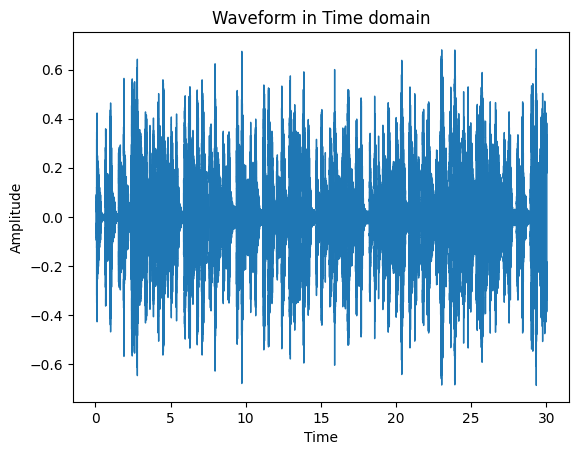

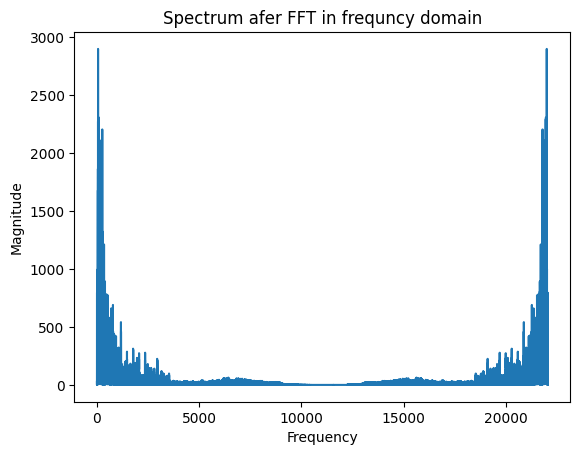

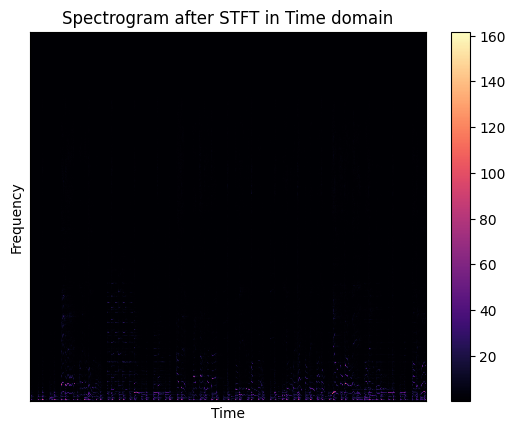

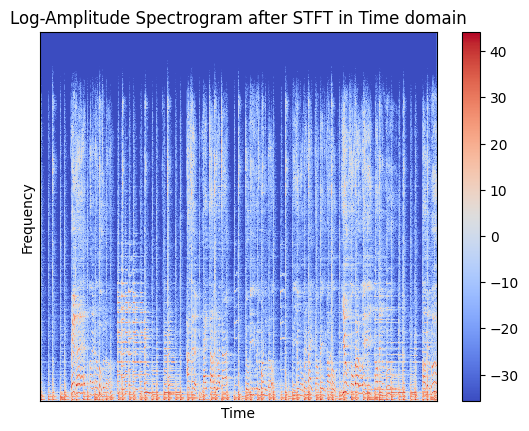

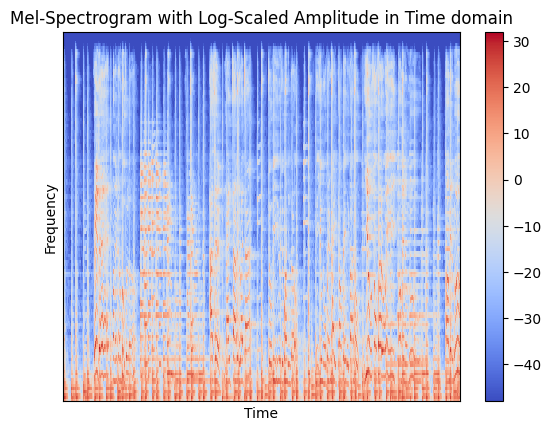

...

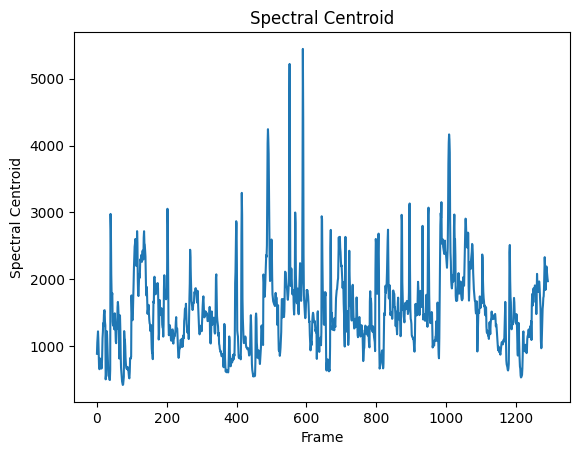

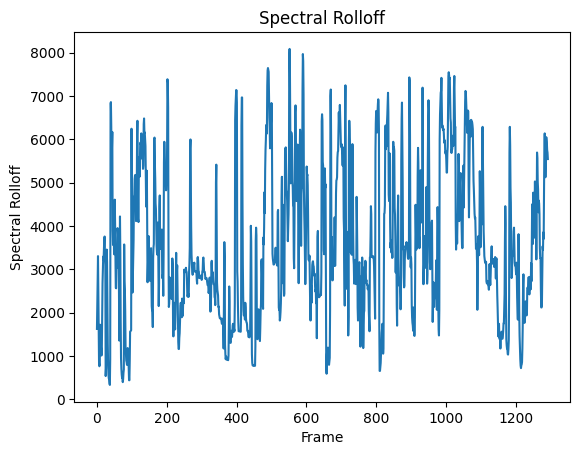

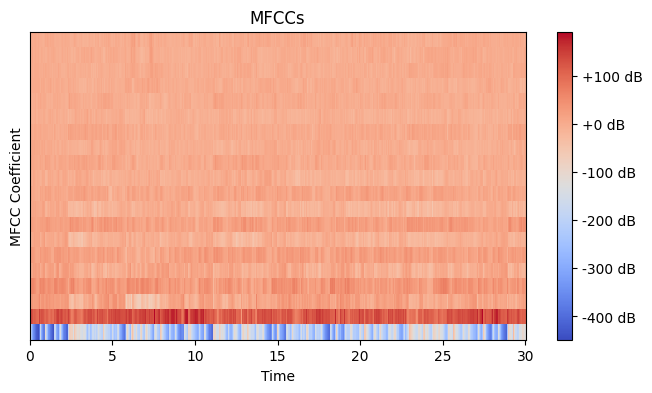

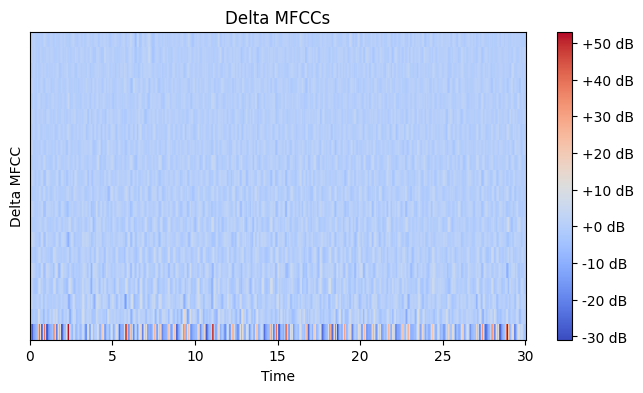

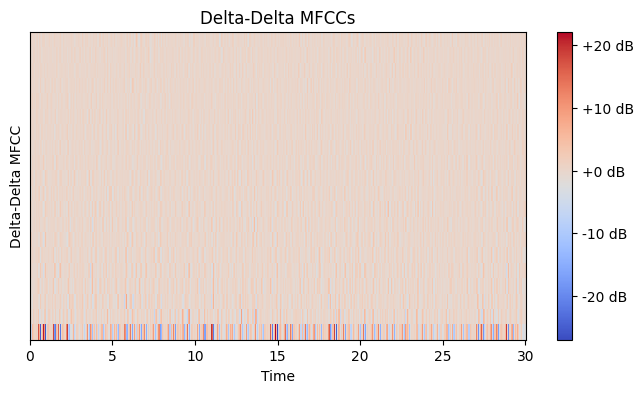

In [ ]:
Waveform_Plots(test, sr1)

In [ ]:
test2 , sr2 = librosa.load("/content/drive/MyDrive/GTZAN_Dataset/genres_original/disco/disco.00001.wav", sr = SAMPLE_RATE)
Audio(test2, rate=sr2)

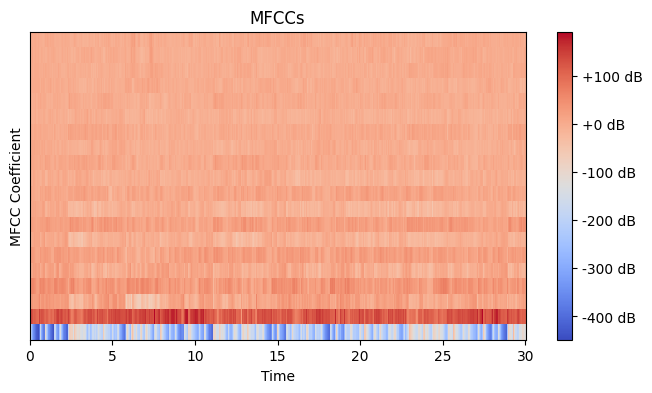

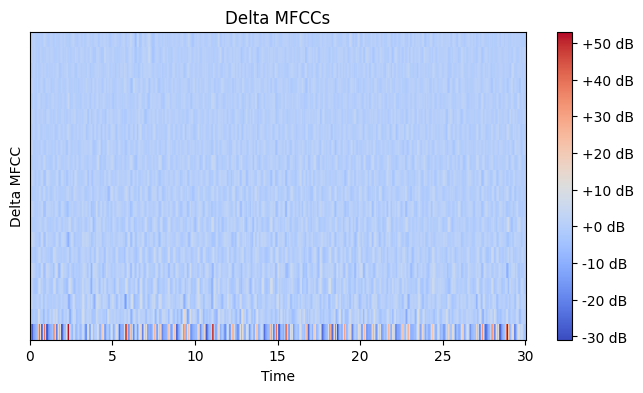

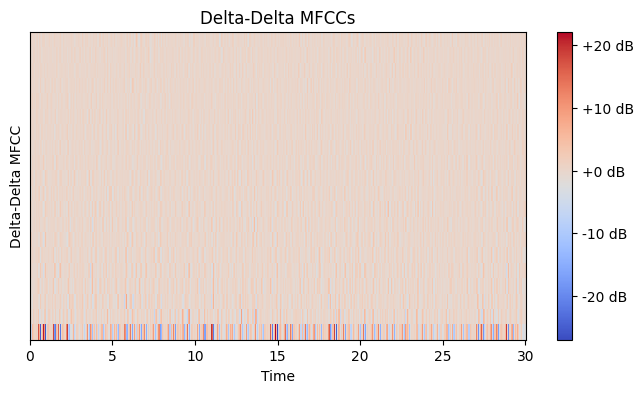

In [ ]:
mfcc = librosa.feature.mfcc(y=test, sr=SAMPLE_RATE)

## Compute the delta and delta-delta MFCCs
delta_mfcc = librosa.feature.delta(mfcc)
delta2_mfcc = librosa.feature.delta(mfcc, order=2)

## Plotting the MFCCs
plt.figure(figsize=(8, 4))
librosa.display.specshow(mfcc, x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('MFCCs')
plt.xlabel('Time')
plt.ylabel('MFCC Coefficient')
plt.show()

## Plotting the delta MFCCs
plt.figure(figsize=(8, 4))
librosa.display.specshow(delta_mfcc, x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Delta MFCCs')
plt.xlabel('Time')
plt.ylabel('Delta MFCC')
plt.show()

## Plotting the delta-delta MFCCs
plt.figure(figsize=(8, 4))
librosa.display.specshow(delta2_mfcc, x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Delta-Delta MFCCs')
plt.xlabel('Time')
plt.ylabel('Delta-Delta MFCC')
plt.show()

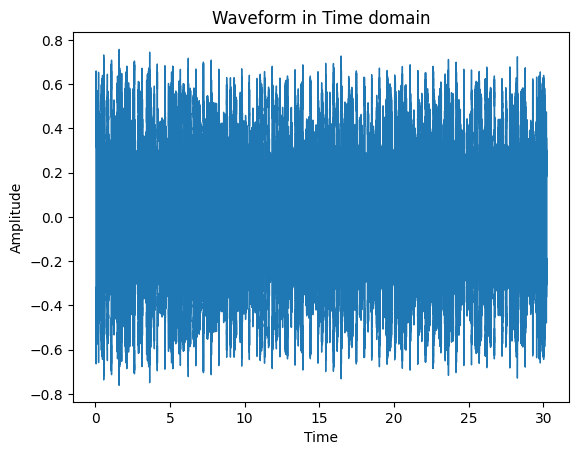

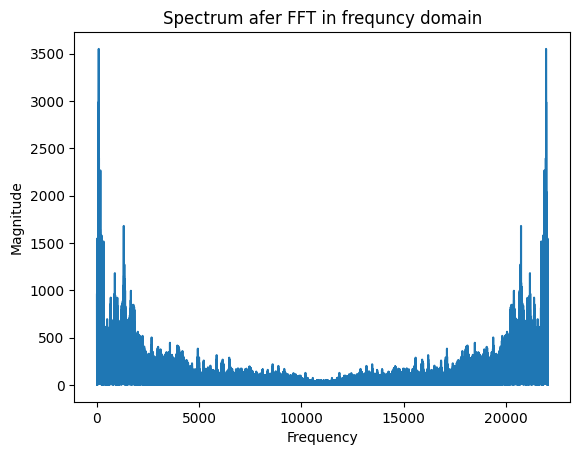

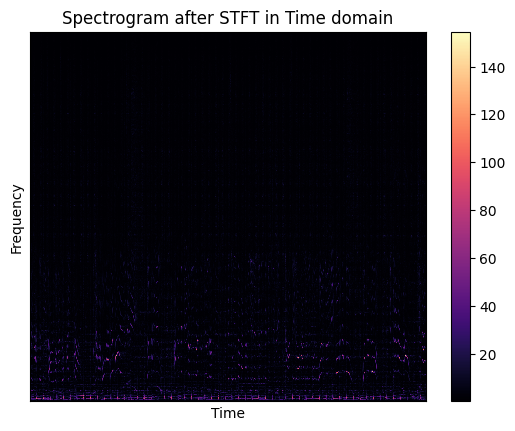

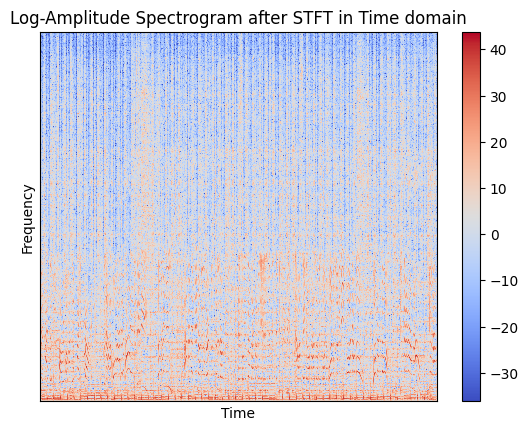

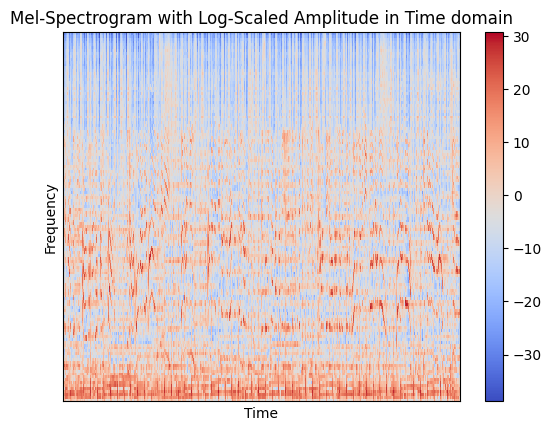

...

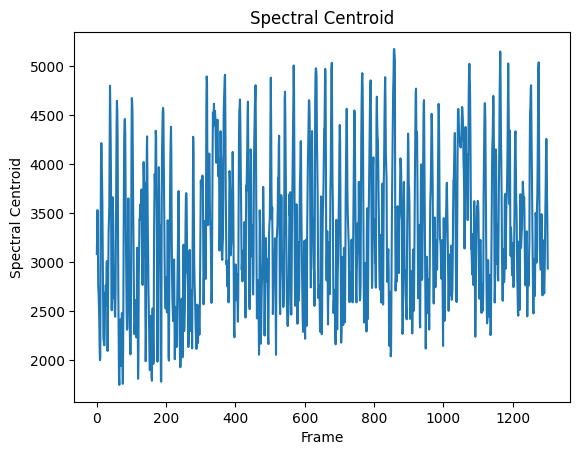

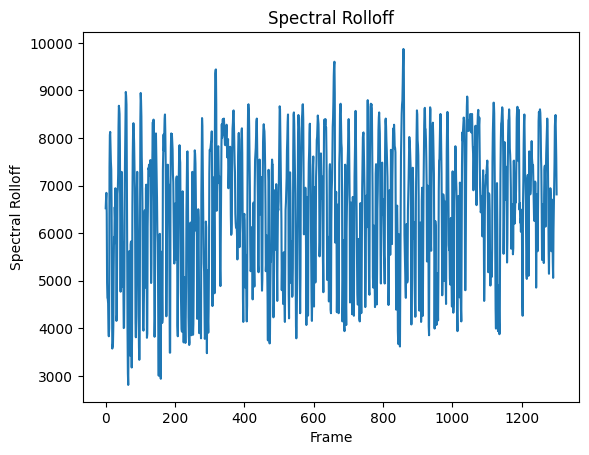

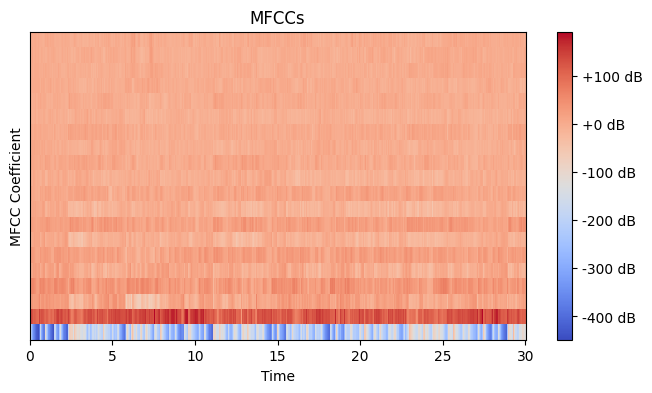

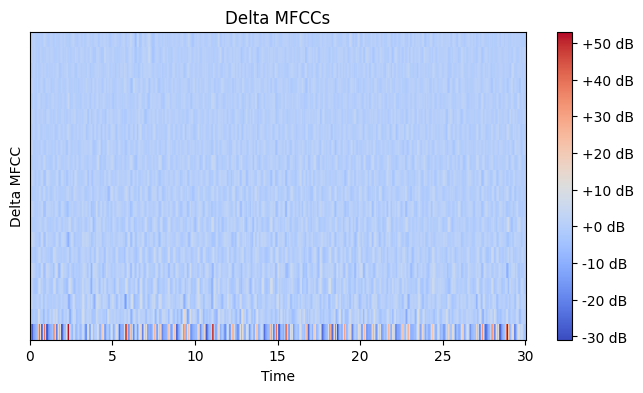

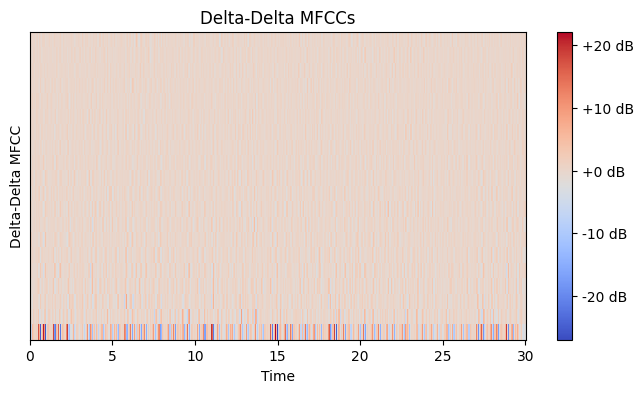

In [ ]:
Waveform_Plots(test2, sr2)

In [ ]:
## Calculate the short-time Fourier transform (STFT)
stft = np.abs(librosa.stft(test2))

## Define the frequency bands of interest
frequency_bands = [
    (0, 500),   ## Lower frequency band (0Hz - 500Hz)
    (500, 1000) ## Higher frequency band (500Hz - 1000Hz)
]

## Compute the energy for each frequency band
band_energies = []
for band in frequency_bands:
    freq_range = librosa.core.fft_frequencies(sr=SAMPLE_RATE, n_fft=stft.shape[0])
    band_mask = np.logical_and(freq_range >= band[0], freq_range <= band[1])
    band_energy = np.sum(stft[band_mask, :], axis=0)
    band_energies.append(band_energy)

## Compute the total energy of the signal
total_energy = np.sum(stft, axis=0)

## Calculate the band-energy ratio
band_energy_ratio = [band_energy / total_energy for band_energy in band_energies]

## Plot the band-energy ratio
plt.figure(figsize=(8, 4))
for i, band_energy in enumerate(band_energy_ratio):
    plt.plot(band_energy, label=f'Band {i+1}')
plt.xlabel('Frame')
plt.ylabel('Band Energy Ratio')
plt.legend()
plt.title('Band-Energy Ratio')
plt.show()

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/GTZAN_Dataset/features_30_sec.csv")
data

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,rock.00095.wav,661794,0.352063,0.080487,0.079486,0.000345,2008.149458,282174.689224,2106.541053,88609.749506,...,45.050526,-13.289984,41.754955,2.484145,36.778877,-6.713265,54.866825,-1.193787,49.950665,rock
996,rock.00096.wav,661794,0.398687,0.075086,0.076458,0.000588,2006.843354,182114.709510,2068.942009,82426.016726,...,33.851742,-10.848309,39.395096,1.881229,32.010040,-7.461491,39.196327,-2.795338,31.773624,rock
997,rock.00097.wav,661794,0.432142,0.075268,0.081651,0.000322,2077.526598,231657.968040,1927.293153,74717.124394,...,33.597008,-12.845291,36.367264,3.440978,36.001110,-12.588070,42.502201,-2.106337,29.865515,rock
998,rock.00098.wav,661794,0.362485,0.091506,0.083860,0.001211,1398.699344,240318.731073,1818.450280,109090.207161,...,46.324894,-4.416050,43.583942,1.556207,34.331261,-5.041897,47.227180,-3.590644,41.299088,rock


In [ ]:
features_3_sec = pd.read_csv("/content/drive/MyDrive/GTZAN_Dataset/features_3_sec.csv")
features_3_sec

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9985,rock.00099.5.wav,66149,0.349126,0.080515,0.050019,0.000097,1499.083005,164266.886443,1718.707215,85931.574523,...,42.485981,-9.094270,38.326839,-4.246976,31.049839,-5.625813,48.804092,1.818823,38.966969,rock
9986,rock.00099.6.wav,66149,0.372564,0.082626,0.057897,0.000088,1847.965128,281054.935973,1906.468492,99727.037054,...,32.415203,-12.375726,66.418587,-3.081278,54.414265,-11.960546,63.452255,0.428857,18.697033,rock
9987,rock.00099.7.wav,66149,0.347481,0.089019,0.052403,0.000701,1346.157659,662956.246325,1561.859087,138762.841945,...,78.228149,-2.524483,21.778994,4.809936,25.980829,1.775686,48.582378,-0.299545,41.586990,rock
9988,rock.00099.8.wav,66149,0.387527,0.084815,0.066430,0.000320,2084.515327,203891.039161,2018.366254,22860.992562,...,28.323744,-5.363541,17.209942,6.462601,21.442928,2.354765,24.843613,0.675824,12.787750,rock


## EDA:
Let's do some basic EDA of the dataset like checking it's distrbution and let's normalize them to a gaussian distribution.


In [ ]:
data.isnull().sum() ## Checking for null values

filename                   0
length                     0
chroma_stft_mean           0
chroma_stft_var            0
rms_mean                   0
rms_var                    0
spectral_centroid_mean     0
spectral_centroid_var      0
spectral_bandwidth_mean    0
spectral_bandwidth_var     0
rolloff_mean               0
rolloff_var                0
zero_crossing_rate_mean    0
zero_crossing_rate_var     0
harmony_mean               0
harmony_var                0
perceptr_mean              0
perceptr_var               0
tempo                      0
mfcc1_mean                 0
mfcc1_var                  0
mfcc2_mean                 0
mfcc2_var                  0
mfcc3_mean                 0
mfcc3_var                  0
mfcc4_mean                 0
mfcc4_var                  0
mfcc5_mean                 0
mfcc5_var                  0
mfcc6_mean                 0
mfcc6_var                  0
mfcc7_mean                 0
mfcc7_var                  0
mfcc8_mean                 0
mfcc8_var     

In [ ]:
features_3_sec.isnull().sum() ## Checking for null values

filename                   0
length                     0
chroma_stft_mean           0
chroma_stft_var            0
rms_mean                   0
rms_var                    0
spectral_centroid_mean     0
spectral_centroid_var      0
spectral_bandwidth_mean    0
spectral_bandwidth_var     0
rolloff_mean               0
rolloff_var                0
zero_crossing_rate_mean    0
zero_crossing_rate_var     0
harmony_mean               0
harmony_var                0
perceptr_mean              0
perceptr_var               0
tempo                      0
mfcc1_mean                 0
mfcc1_var                  0
mfcc2_mean                 0
mfcc2_var                  0
mfcc3_mean                 0
mfcc3_var                  0
mfcc4_mean                 0
mfcc4_var                  0
mfcc5_mean                 0
mfcc5_var                  0
mfcc6_mean                 0
mfcc6_var                  0
mfcc7_mean                 0
mfcc7_var                  0
mfcc8_mean                 0
mfcc8_var     

As there are no Null-Values let's check for outliers
## **Outliers**

In [ ]:
data.dtypes

filename                    object
length                       int64
chroma_stft_mean           float64
chroma_stft_var            float64
rms_mean                   float64
rms_var                    float64
spectral_centroid_mean     float64
spectral_centroid_var      float64
spectral_bandwidth_mean    float64
spectral_bandwidth_var     float64
rolloff_mean               float64
rolloff_var                float64
zero_crossing_rate_mean    float64
zero_crossing_rate_var     float64
harmony_mean               float64
harmony_var                float64
perceptr_mean              float64
perceptr_var               float64
tempo                      float64
mfcc1_mean                 float64
mfcc1_var                  float64
mfcc2_mean                 float64
mfcc2_var                  float64
mfcc3_mean                 float64
mfcc3_var                  float64
mfcc4_mean                 float64
mfcc4_var                  float64
mfcc5_mean                 float64
mfcc5_var           

In [ ]:
features_3_sec.dtypes

filename                    object
length                       int64
chroma_stft_mean           float64
chroma_stft_var            float64
rms_mean                   float64
rms_var                    float64
spectral_centroid_mean     float64
spectral_centroid_var      float64
spectral_bandwidth_mean    float64
spectral_bandwidth_var     float64
rolloff_mean               float64
rolloff_var                float64
zero_crossing_rate_mean    float64
zero_crossing_rate_var     float64
harmony_mean               float64
harmony_var                float64
perceptr_mean              float64
perceptr_var               float64
tempo                      float64
mfcc1_mean                 float64
mfcc1_var                  float64
mfcc2_mean                 float64
mfcc2_var                  float64
mfcc3_mean                 float64
mfcc3_var                  float64
mfcc4_mean                 float64
mfcc4_var                  float64
mfcc5_mean                 float64
mfcc5_var           

In [ ]:
def box_plots(data):
  columns_to_drop = ['filename' , 'label']
  data_numeric = data.drop(columns_to_drop, axis=1)
  # Iterate over each column in the DataFrame
  for column in data_numeric.columns:
      # Create the box plot
      sns.boxplot(data=data_numeric, y=column)

      # Add a title to the plot
      plt.title('Box Plot of {}'.format(column))

      # Show the plot
      plt.show()

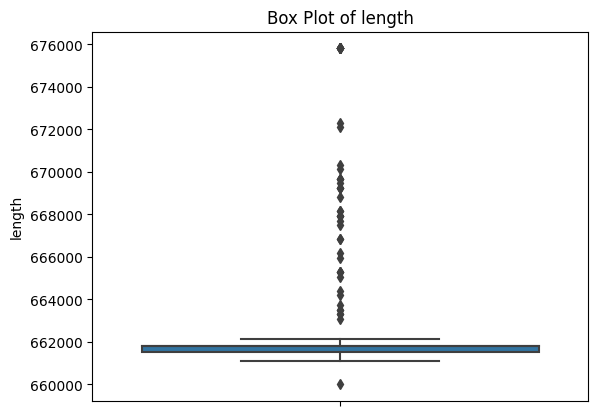

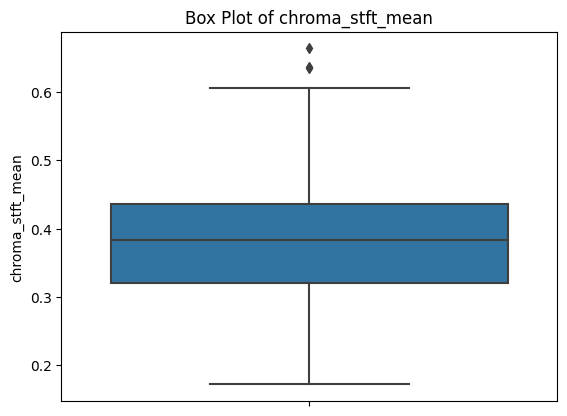

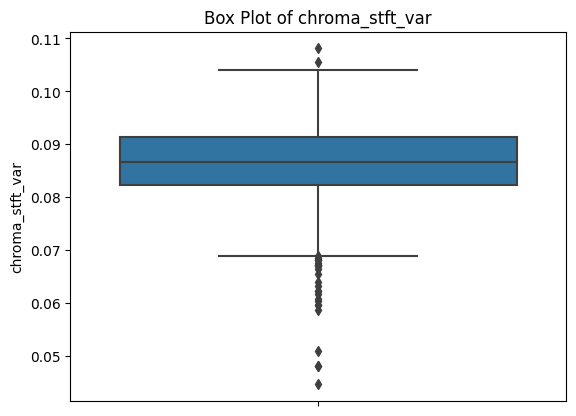

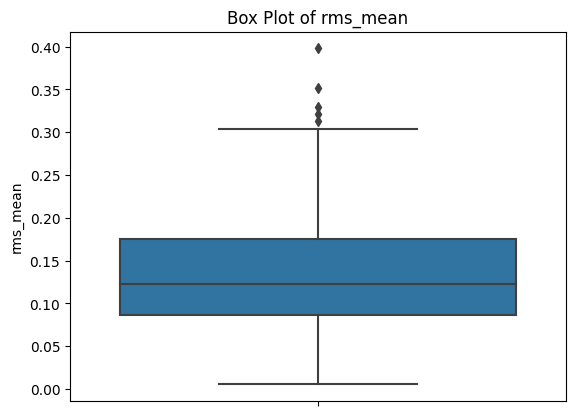

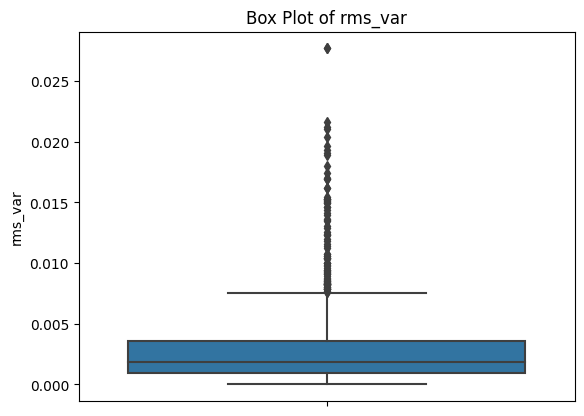

...

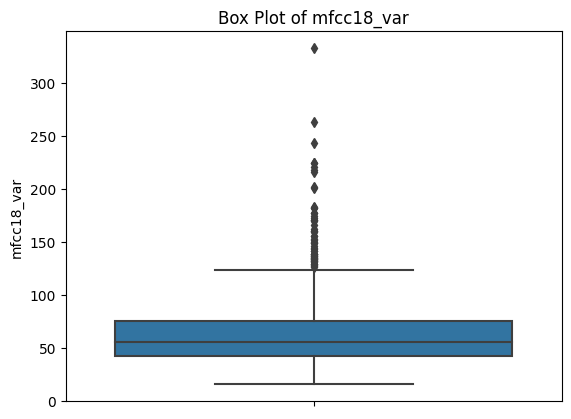

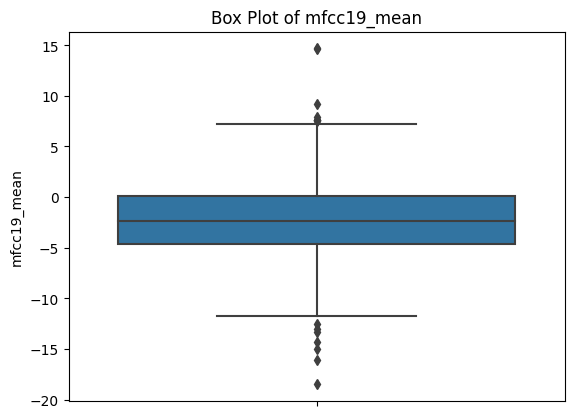

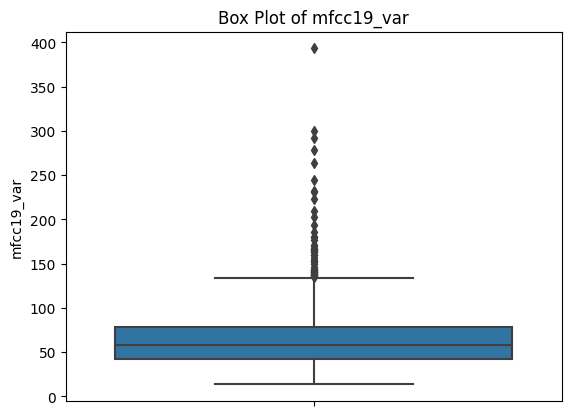

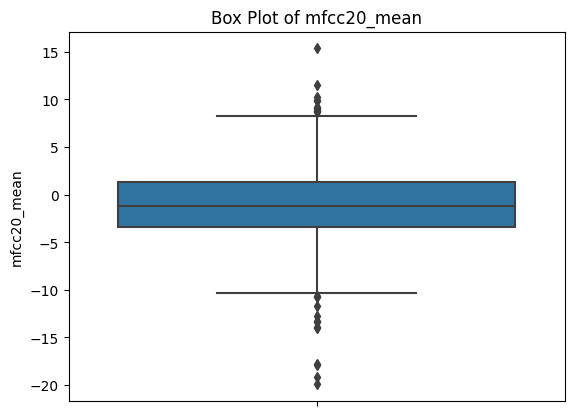

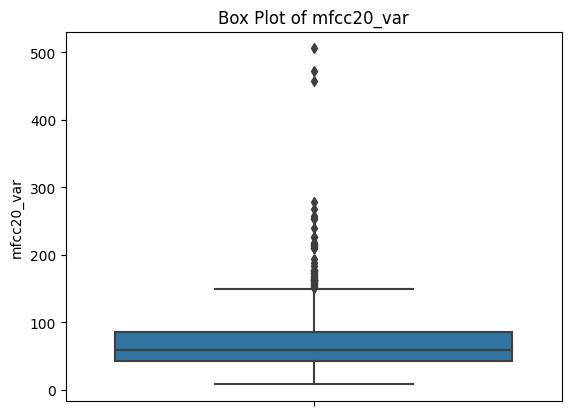

In [ ]:
box_plots(data) ## Box-plots for the features of 30 sec clip

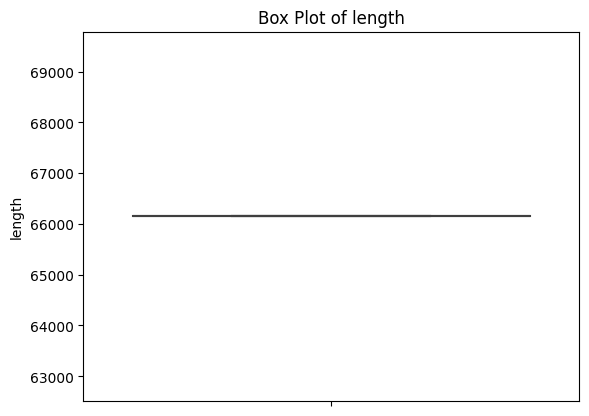

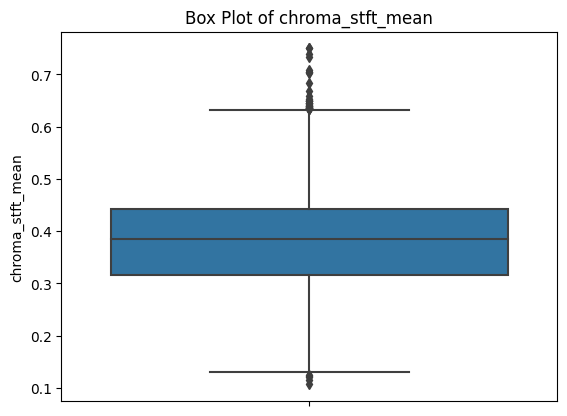

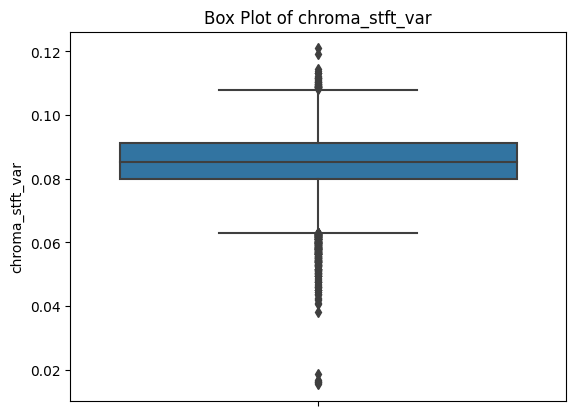

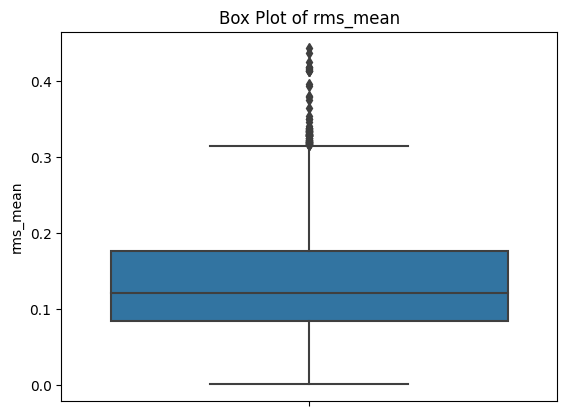

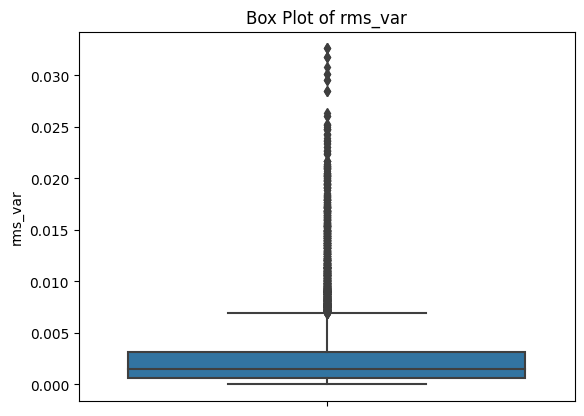

...

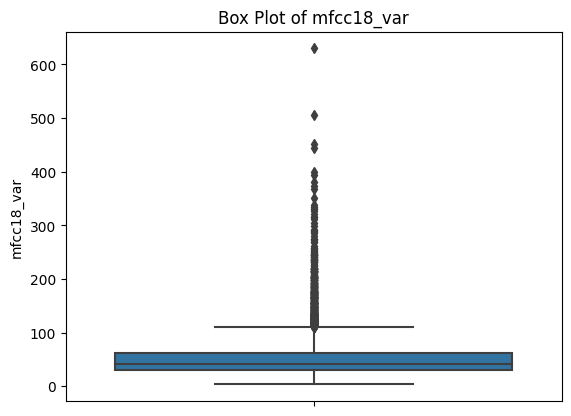

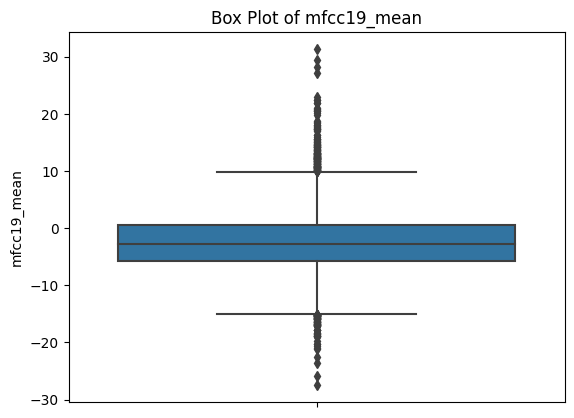

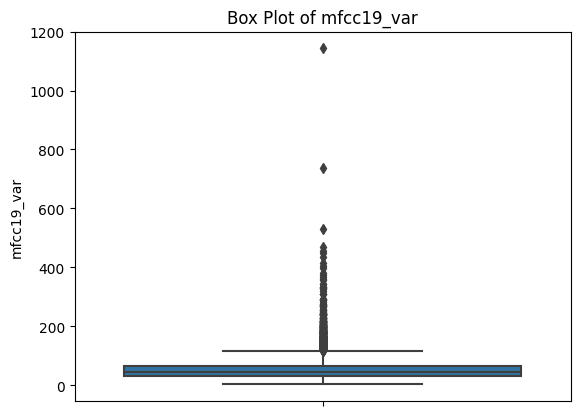

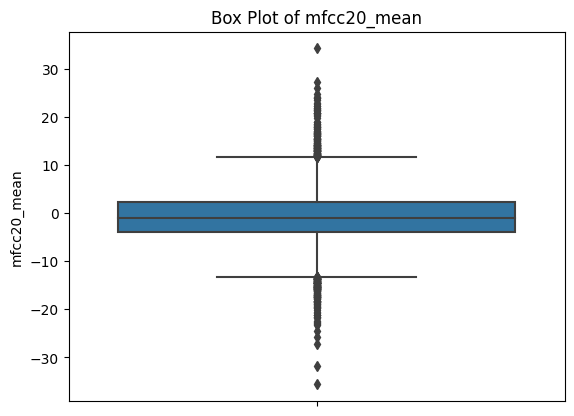

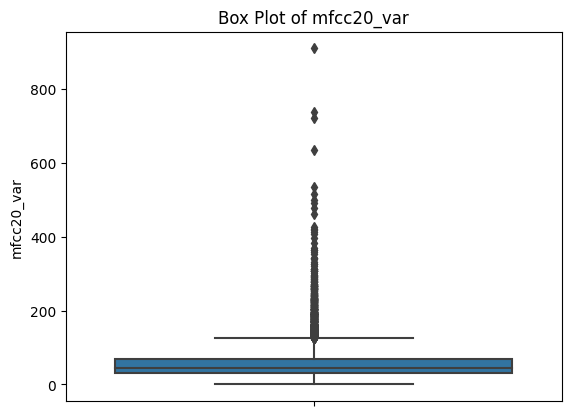

In [ ]:
box_plots(features_3_sec) # Box-plots for the features of 3 sec clip

After looking at the outlieirs we cannot really remove them because after all we are dealing with music so people can be creative with it and hence those could be important data points for this discussion. But we can definitely check their distribution and maybe do some transformations to get the data to a more normal distribution as a lot of algorithms such as ANOVA, Pearson’s correlation or some types of regression – the results of such a test will be more valid if the distribution of the dependent variable(s) approximates a Gaussian (normal) distribution and the assumption of homoscedasticity is met.

In [ ]:
def hist_plot(data , column=None):

      if column is None:

          if "filename" in data.columns and "label" in data.columns:
            columns_to_drop = ['filename', 'label']
            data_numeric = data.drop(columns_to_drop, axis=1)
          else:
            data_numeric = data

        ## Iterate over each column in the dataset
          for col in data_numeric.columns:

            ## Plot the distribution
            sns.histplot(data=data_numeric, x=col, kde=True)

            ## Add a title to the plot
            plt.title('Distribution of {}'.format(col))

            ## Show the plot
            plt.show()

            ## Check skewness of the distribution
            skewness = data_numeric[col].skew()
            print('Skewness of {}: {}'.format(col, skewness))

      else:
        ## Plot the distribution for a specific column
        sns.histplot(data=data, x=column, kde=True)

        ## Add a title to the plot
        plt.title('Distribution of {}'.format(column))

        ## Show the plot
        plt.show()

        ## Check skewness of the distribution
        skewness = data[column].skew()
        print('Skewness of {}: {}'.format(column, skewness))

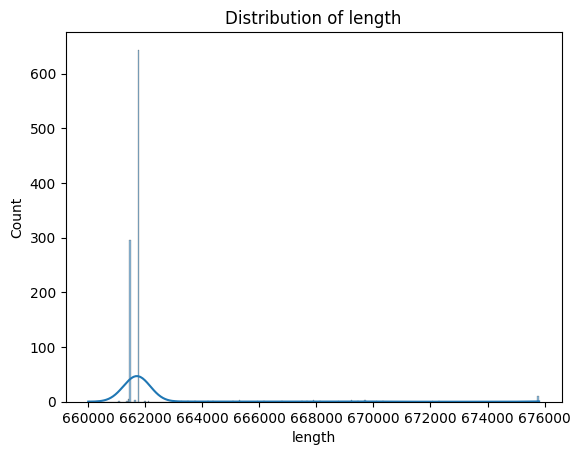

Skewness of length: 6.0776180600621466


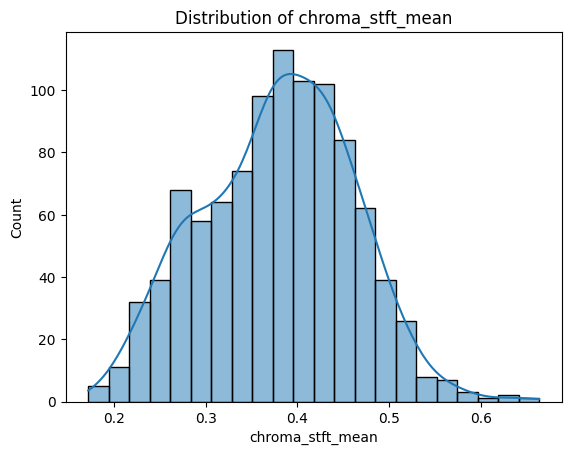

Skewness of chroma_stft_mean: -0.03782559805364672


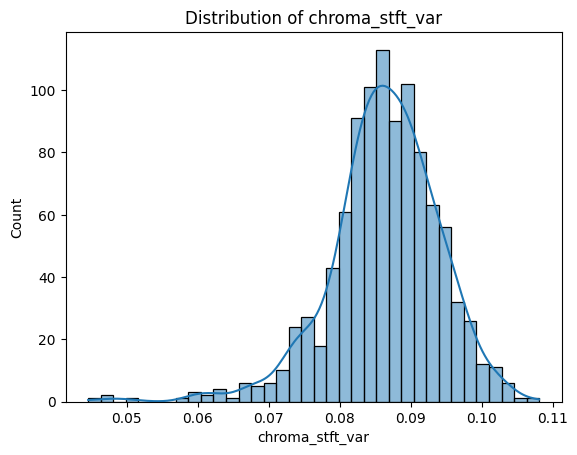

Skewness of chroma_stft_var: -0.8552865588428706


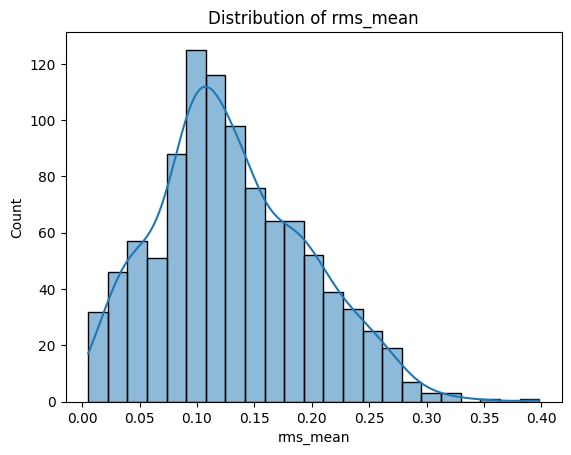

Skewness of rms_mean: 0.44265010601068167


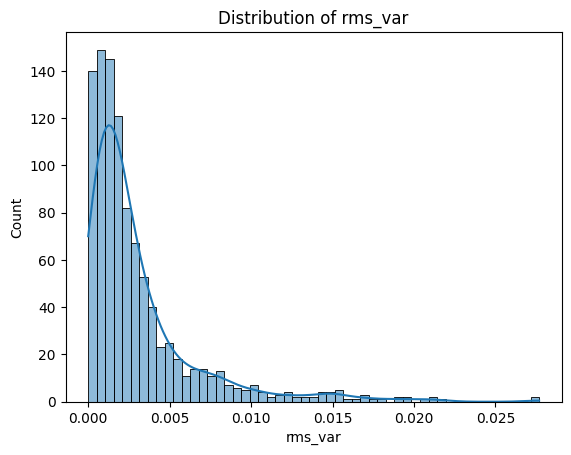

Skewness of rms_var: 2.7488411836605526


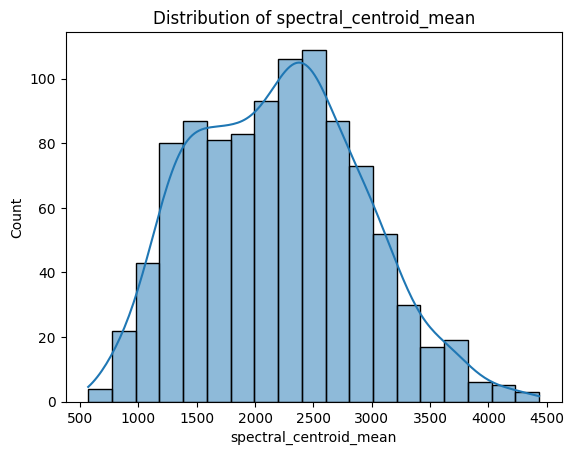

Skewness of spectral_centroid_mean: 0.2345397426209691


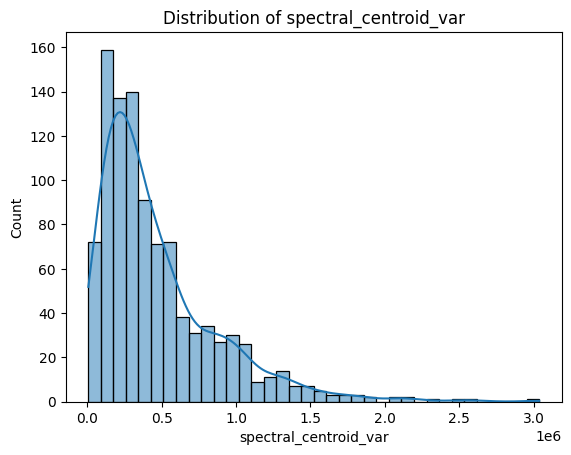

Skewness of spectral_centroid_var: 1.8349508377005257


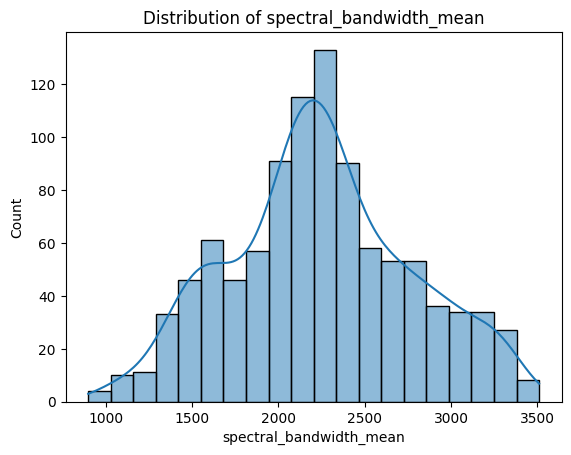

Skewness of spectral_bandwidth_mean: 0.10300429908892123


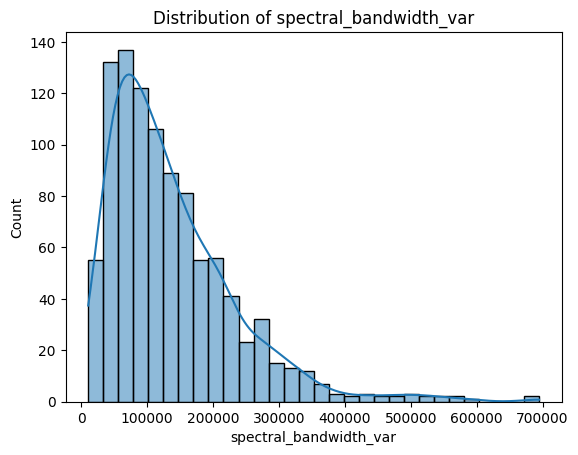

Skewness of spectral_bandwidth_var: 1.7349637908704407


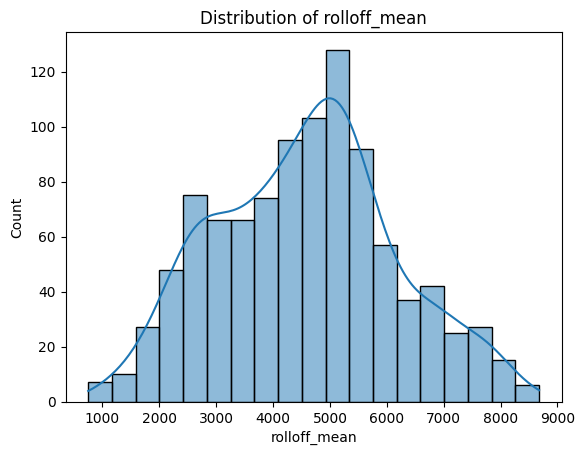

Skewness of rolloff_mean: 0.1169614149611805


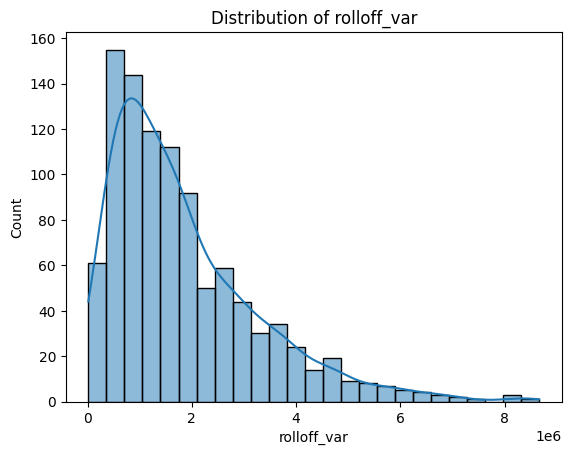

Skewness of rolloff_var: 1.4529641796101098


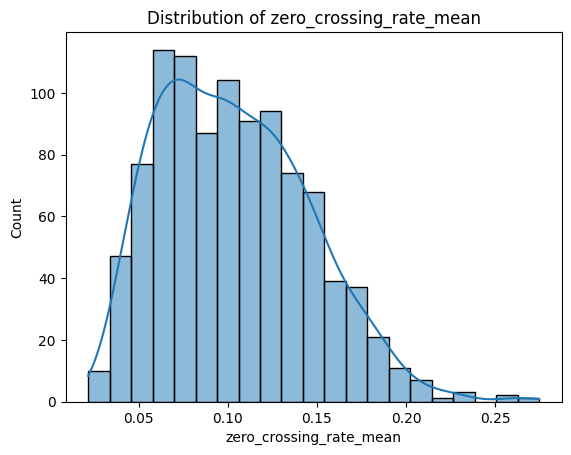

Skewness of zero_crossing_rate_mean: 0.5430450055520778


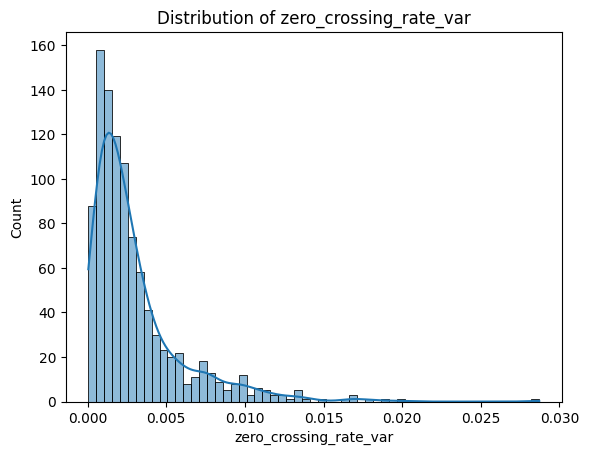

Skewness of zero_crossing_rate_var: 2.5335250880122335


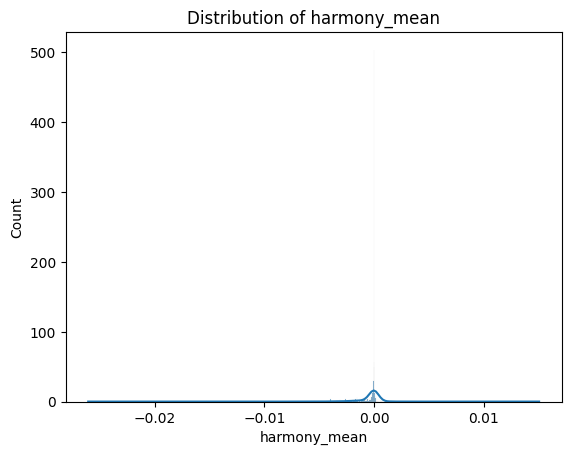

Skewness of harmony_mean: -6.285543169716646


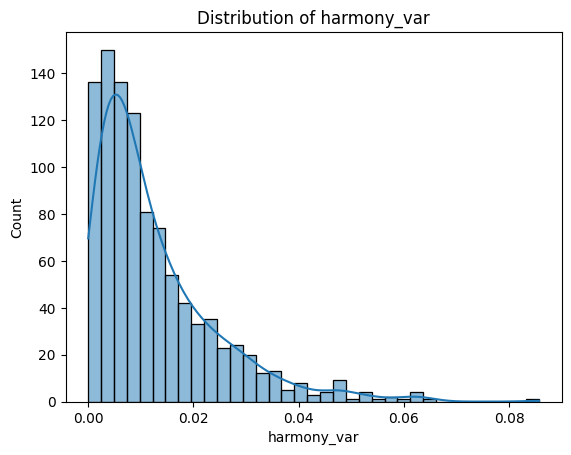

Skewness of harmony_var: 1.808640917574529


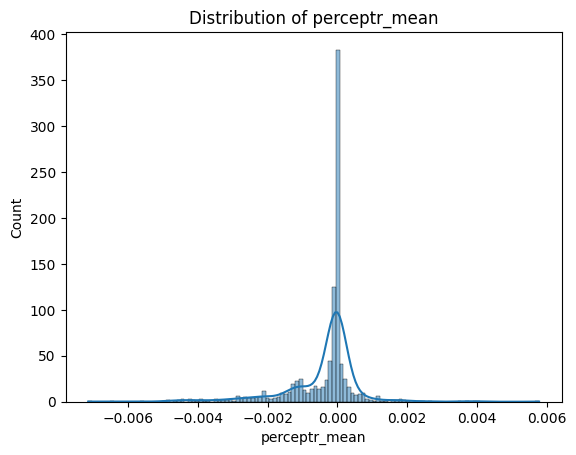

Skewness of perceptr_mean: -1.4814871452454146


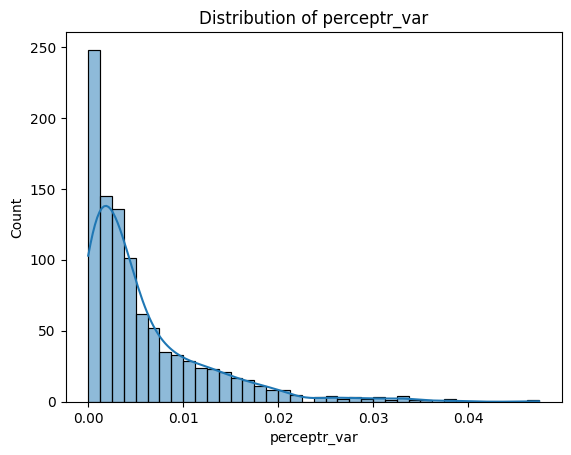

Skewness of perceptr_var: 2.108632220076271


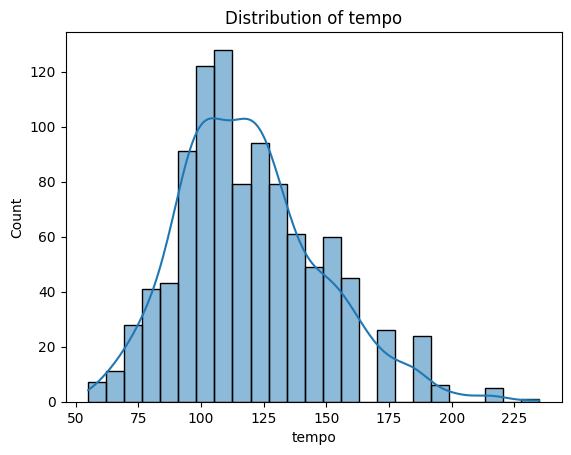

Skewness of tempo: 0.612048456993387


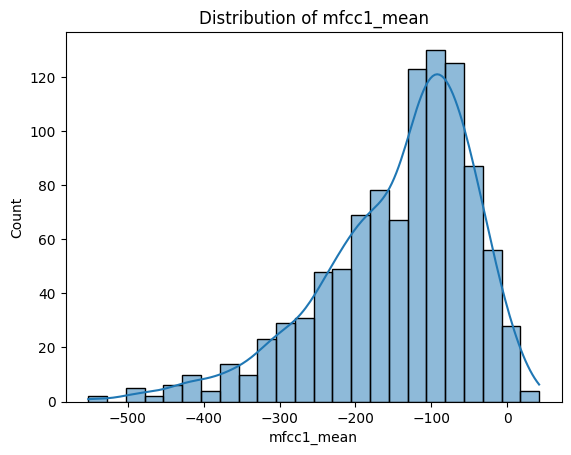

Skewness of mfcc1_mean: -1.018019338294844


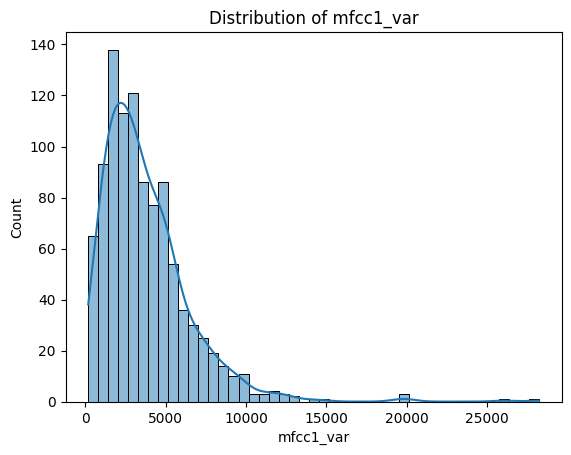

Skewness of mfcc1_var: 2.495676951975837


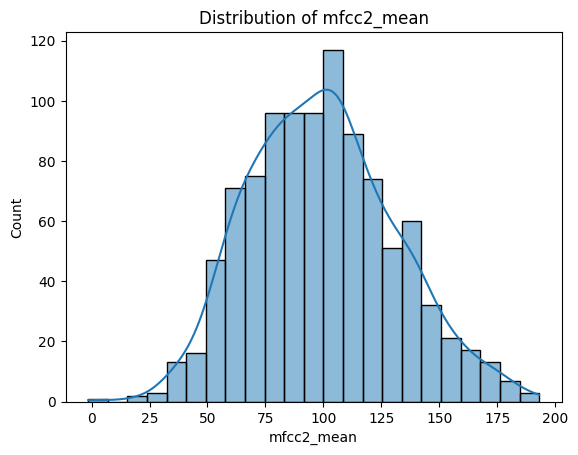

Skewness of mfcc2_mean: 0.2636614649160004


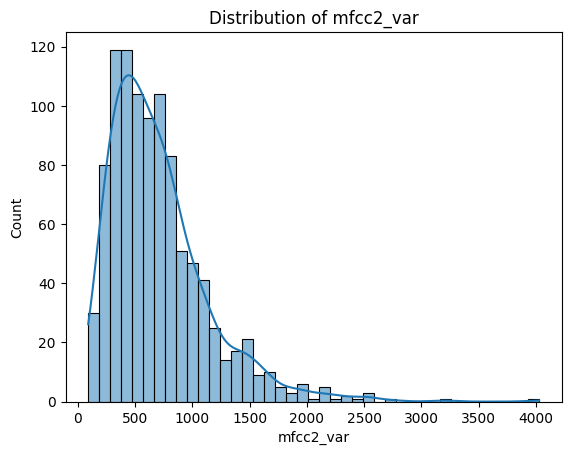

Skewness of mfcc2_var: 1.8186568594416554


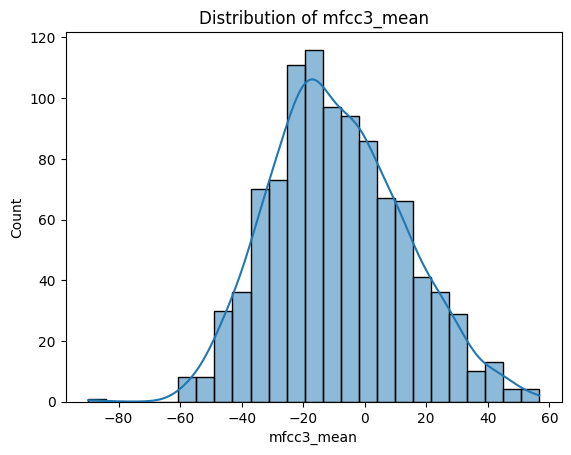

Skewness of mfcc3_mean: 0.2610919643333697


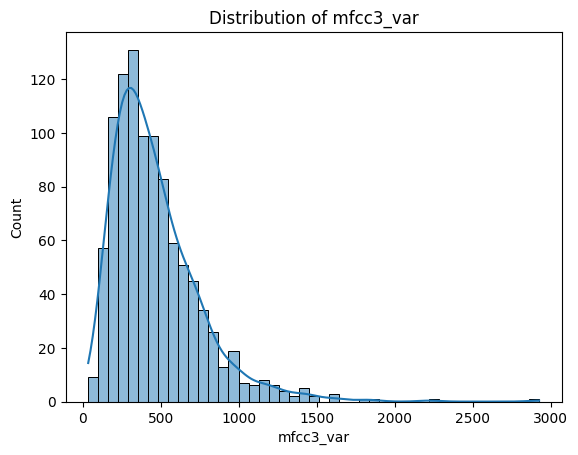

Skewness of mfcc3_var: 2.0235617744122454


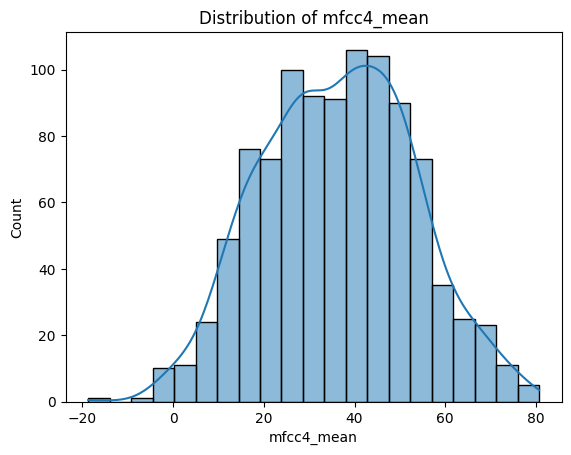

Skewness of mfcc4_mean: 0.016068440864272754


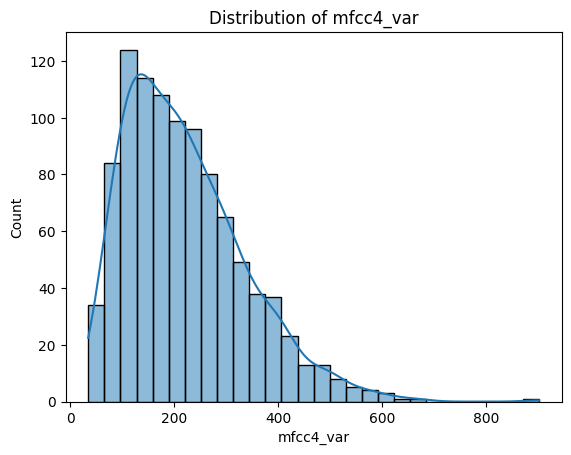

Skewness of mfcc4_var: 1.0243917196565229


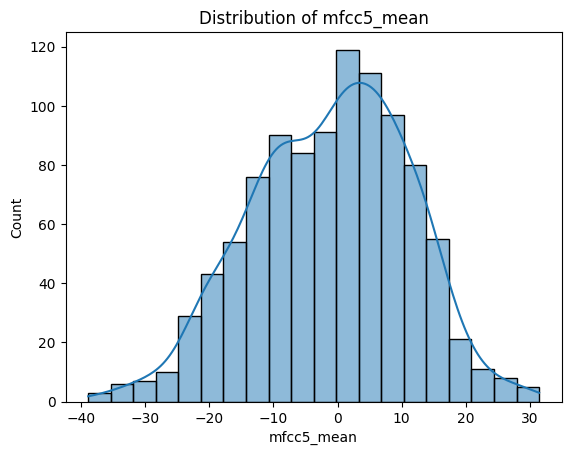

Skewness of mfcc5_mean: -0.2086945218010477


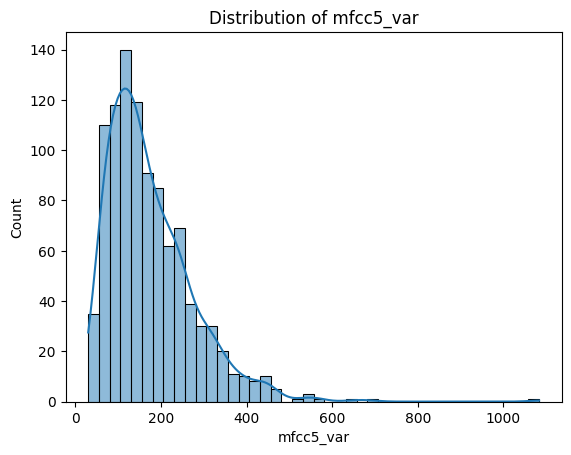

Skewness of mfcc5_var: 1.8311139295851904


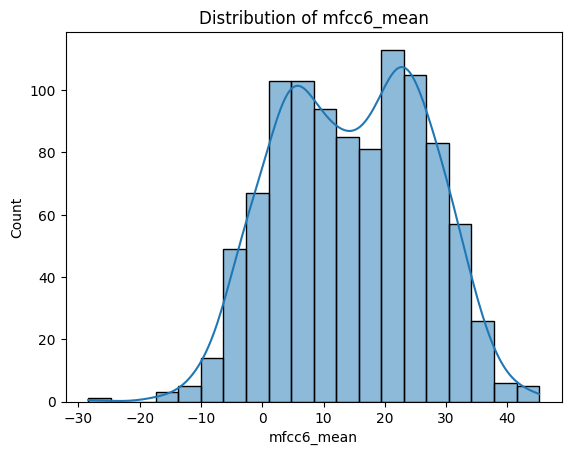

Skewness of mfcc6_mean: -0.06765989574209409


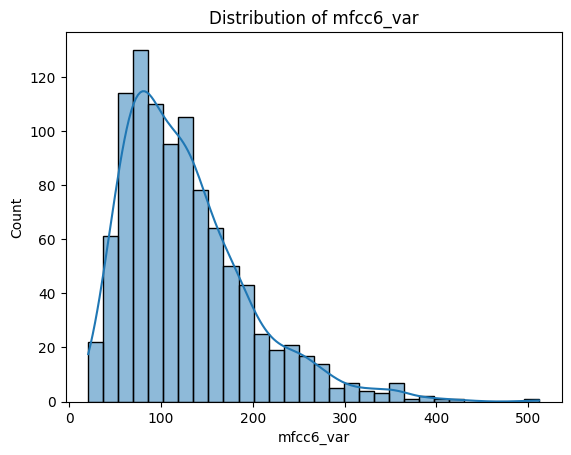

Skewness of mfcc6_var: 1.3195591106929219


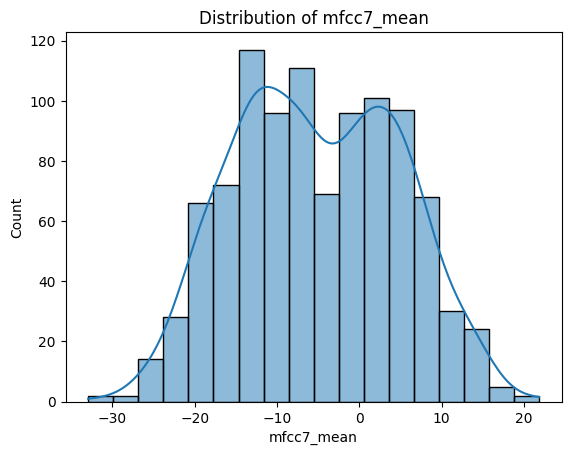

Skewness of mfcc7_mean: 0.04305829125804546


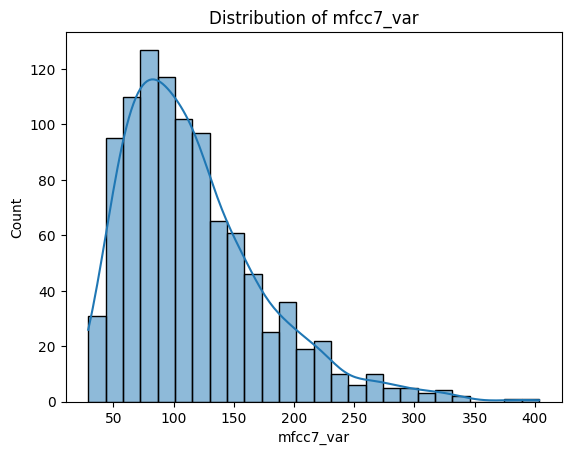

Skewness of mfcc7_var: 1.2454652038752683


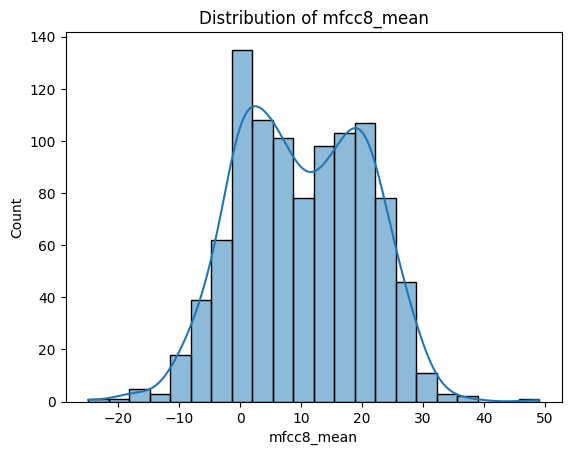

Skewness of mfcc8_mean: -0.02448839540315402


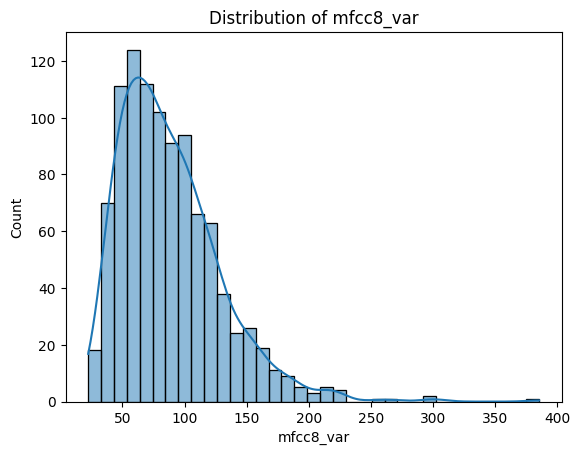

Skewness of mfcc8_var: 1.4798160243177518


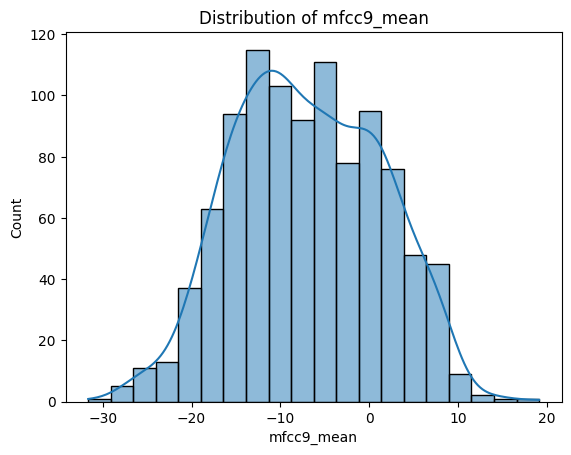

Skewness of mfcc9_mean: 0.034177070258129424


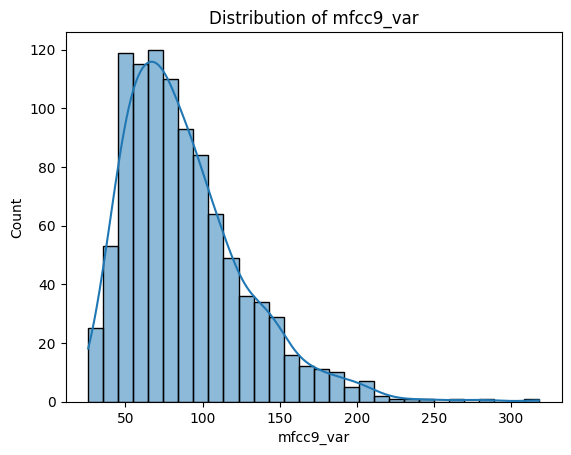

Skewness of mfcc9_var: 1.2845051275882


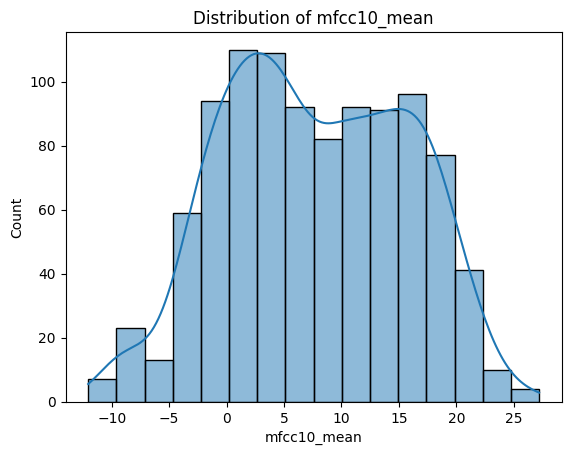

Skewness of mfcc10_mean: -0.01596599739081198


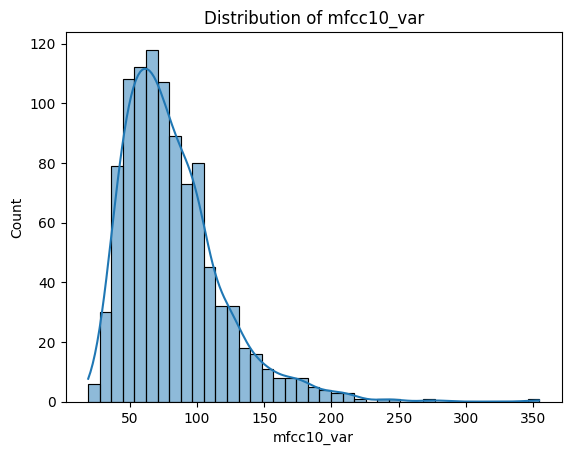

Skewness of mfcc10_var: 1.6051027589749474


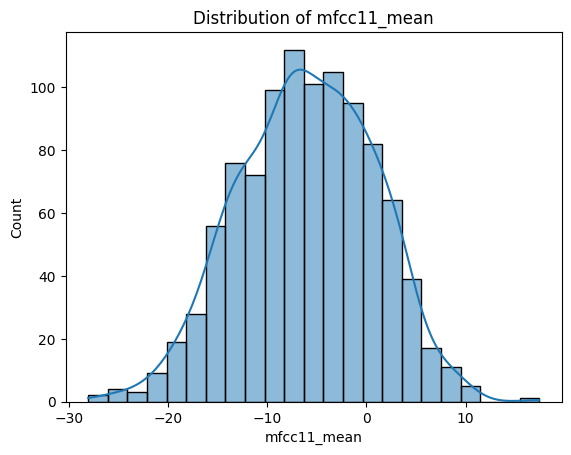

Skewness of mfcc11_mean: -0.12655525728191525


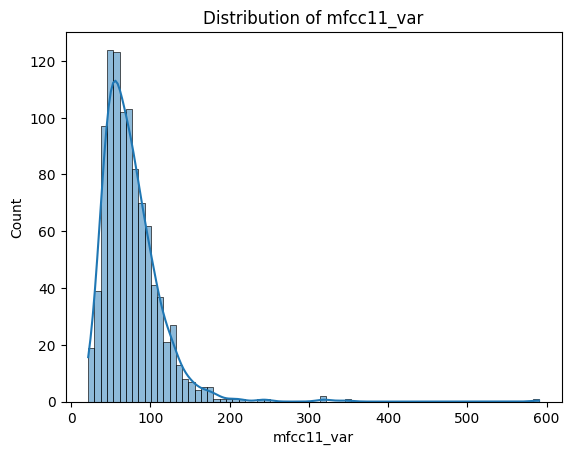

Skewness of mfcc11_var: 4.005243999073207


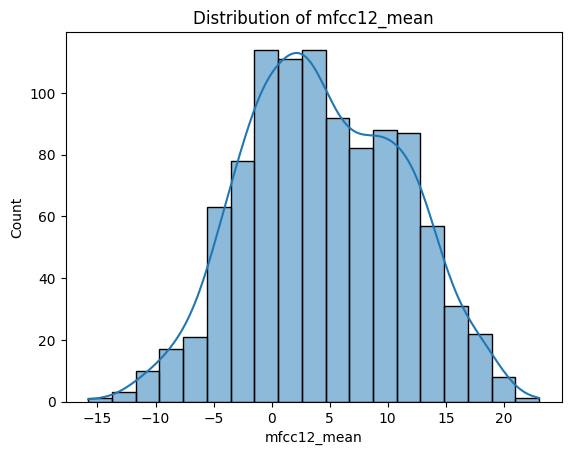

Skewness of mfcc12_mean: 0.05391593322005786


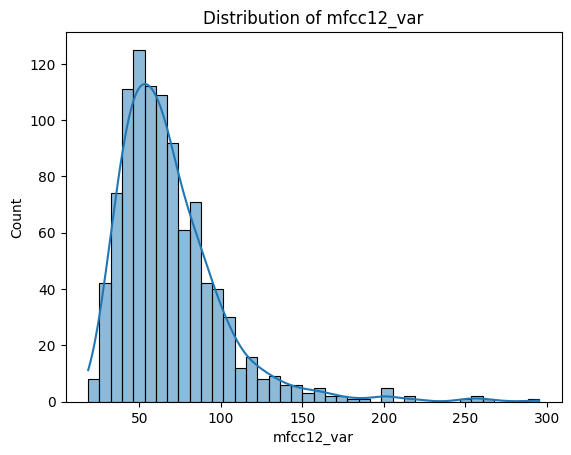

Skewness of mfcc12_var: 2.184883998670659


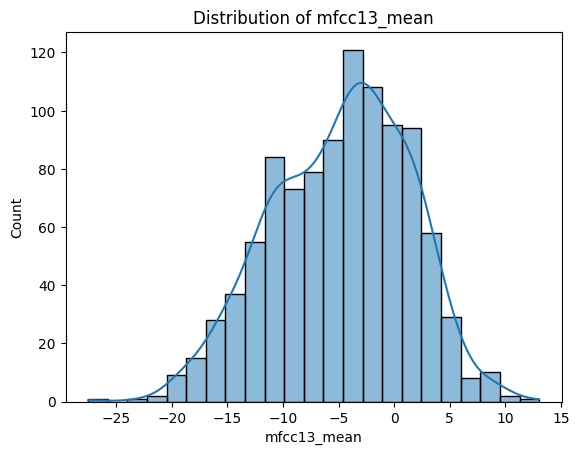

Skewness of mfcc13_mean: -0.2469998548390625


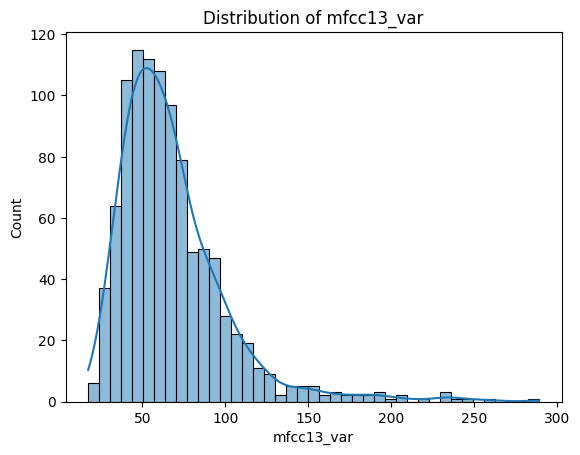

Skewness of mfcc13_var: 2.1963741851529734


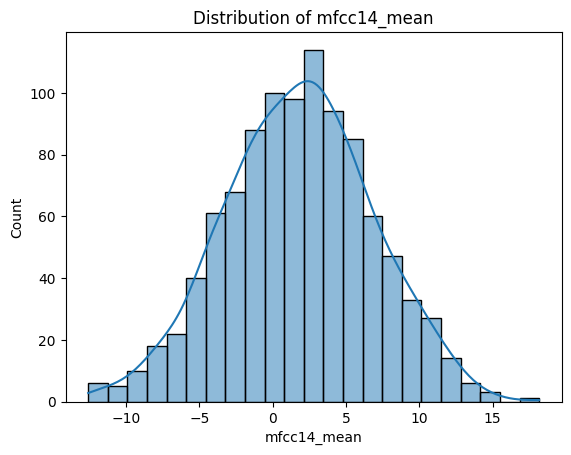

Skewness of mfcc14_mean: -0.03594044350534624


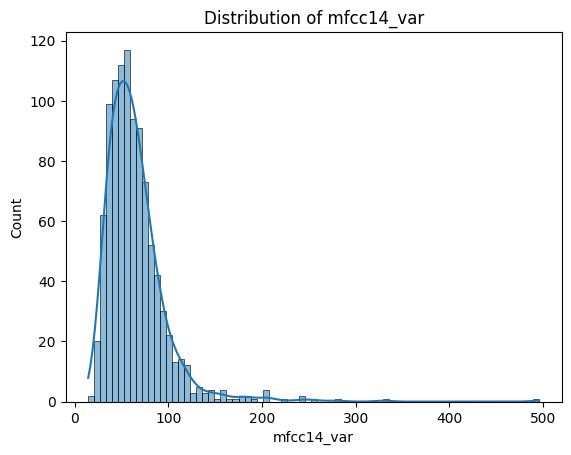

Skewness of mfcc14_var: 3.968144980657763


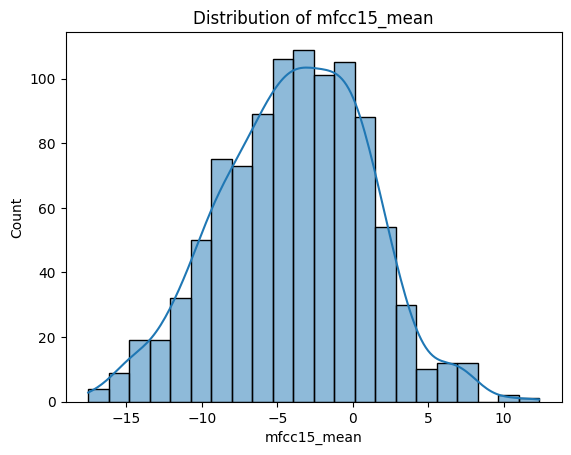

Skewness of mfcc15_mean: -0.09722125477611764


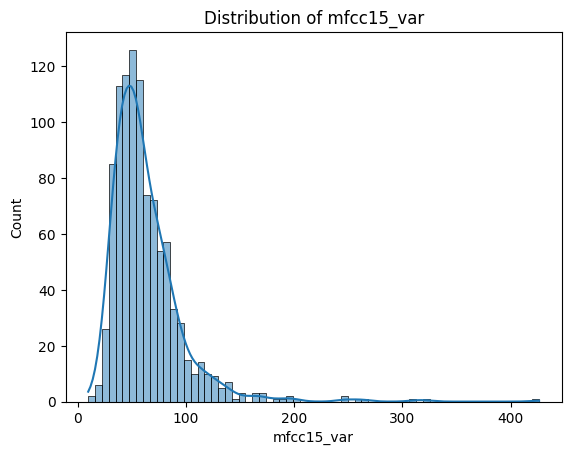

Skewness of mfcc15_var: 3.53007905634766


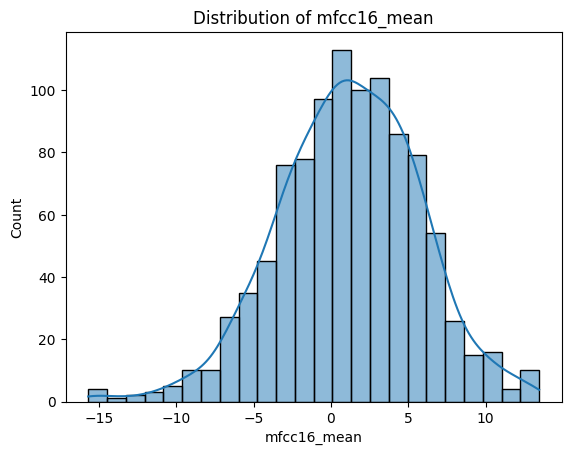

Skewness of mfcc16_mean: -0.24357203174793937


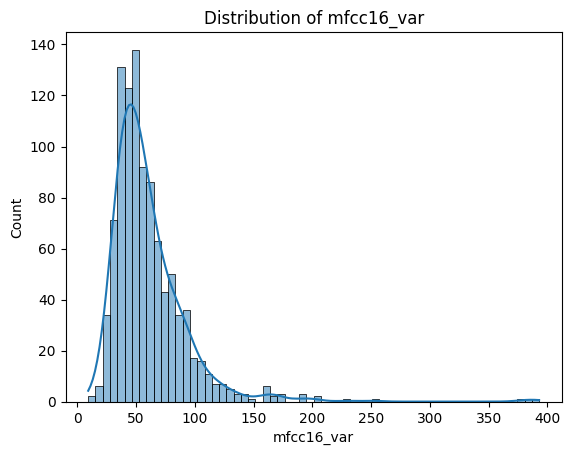

Skewness of mfcc16_var: 3.8493418361837004


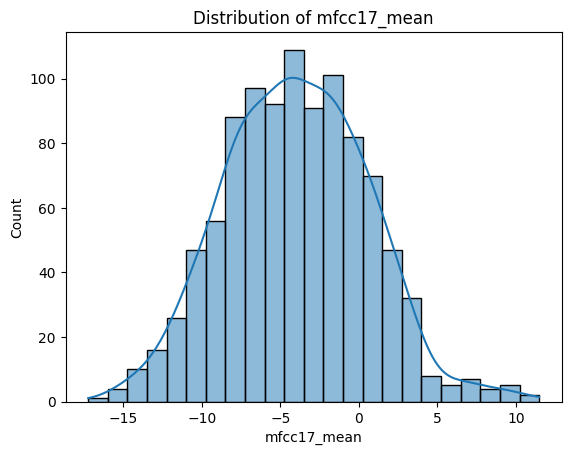

Skewness of mfcc17_mean: 0.14590838637381207


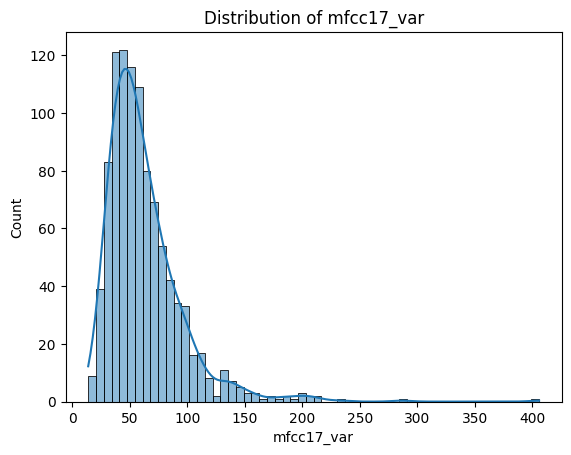

Skewness of mfcc17_var: 2.7526741366532526


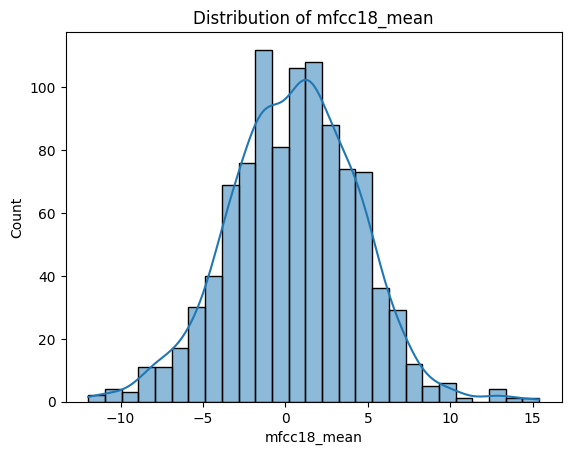

Skewness of mfcc18_mean: -0.012944497496889133


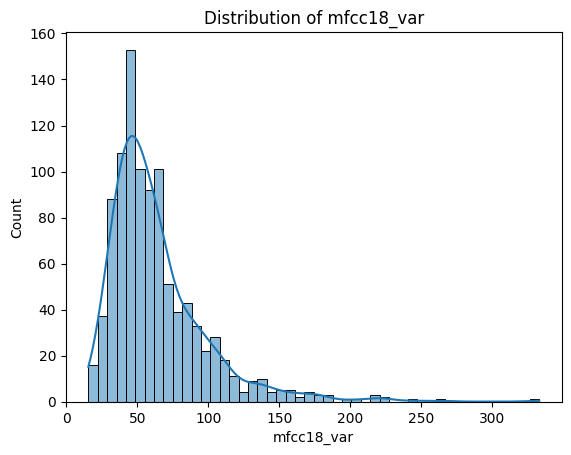

Skewness of mfcc18_var: 2.2128055947693688


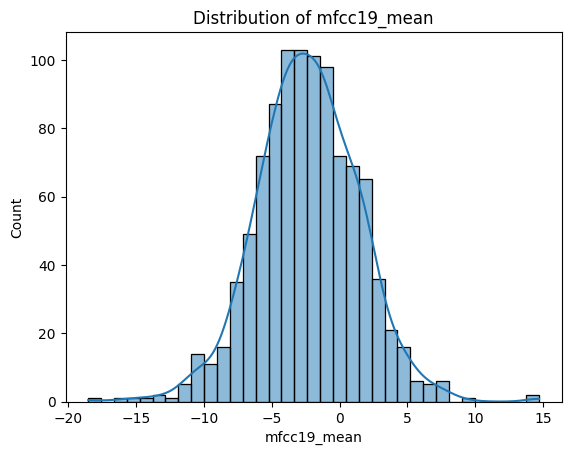

Skewness of mfcc19_mean: 0.01362820815277278


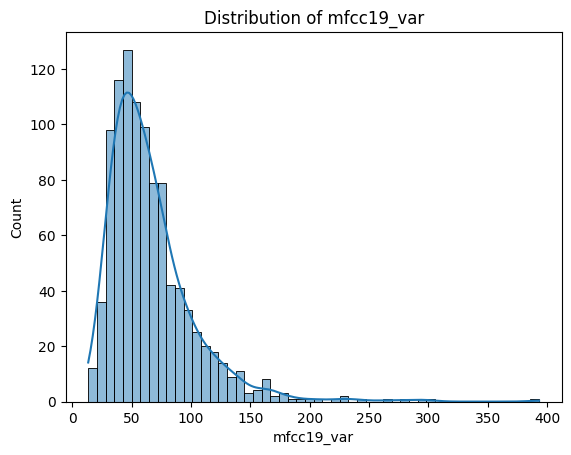

Skewness of mfcc19_var: 2.5276093382471796


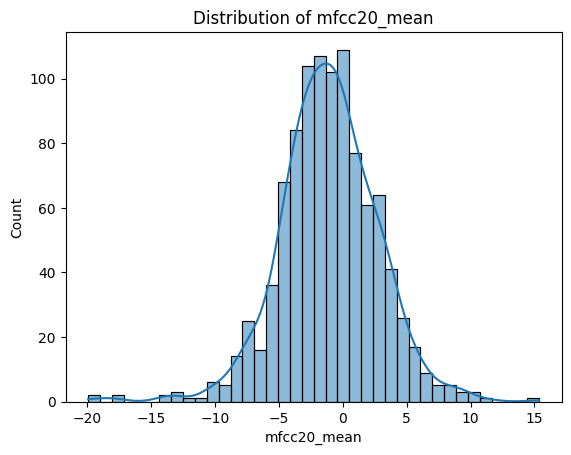

Skewness of mfcc20_mean: -0.2830076161804245


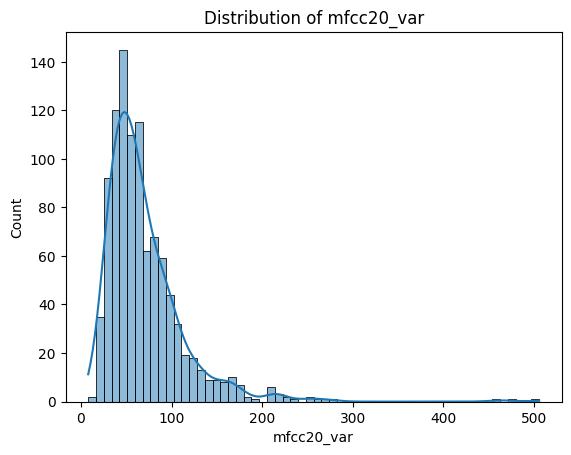

Skewness of mfcc20_var: 3.3633910525760555


In [ ]:
hist_plot(data) ## Histogram plots for the features of 30 sec audio clips

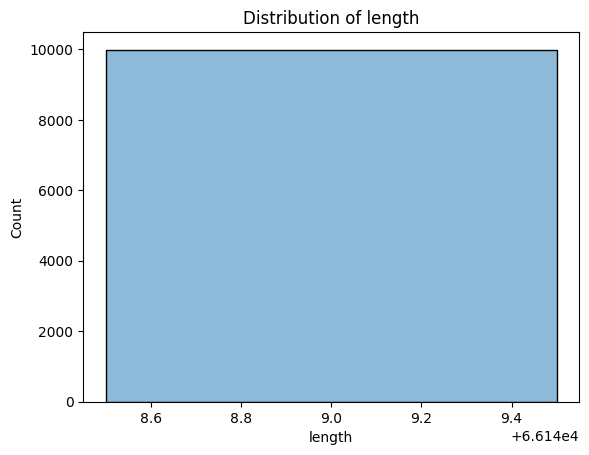

Skewness of length: 0


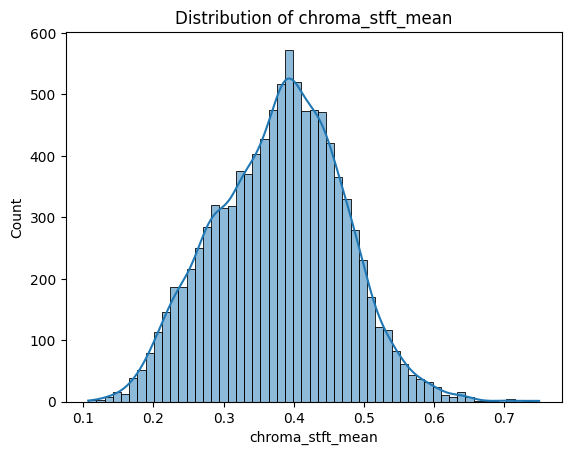

Skewness of chroma_stft_mean: -0.017924318429076342


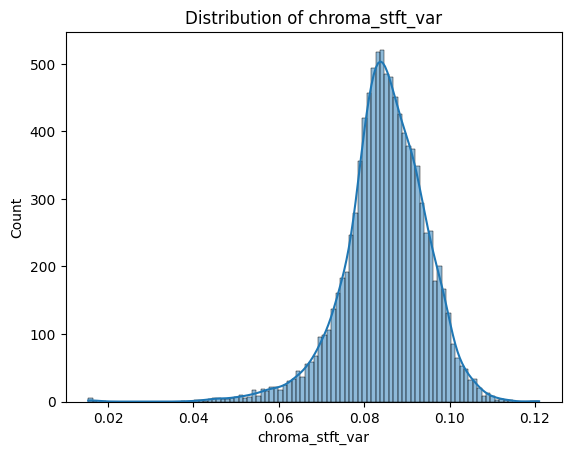

Skewness of chroma_stft_var: -0.7736799244700742


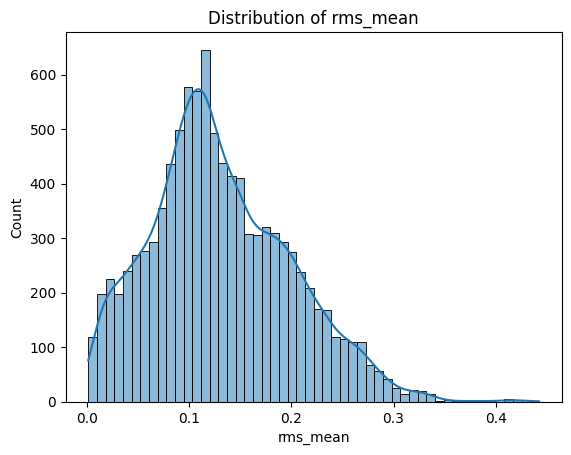

Skewness of rms_mean: 0.4991287150482313


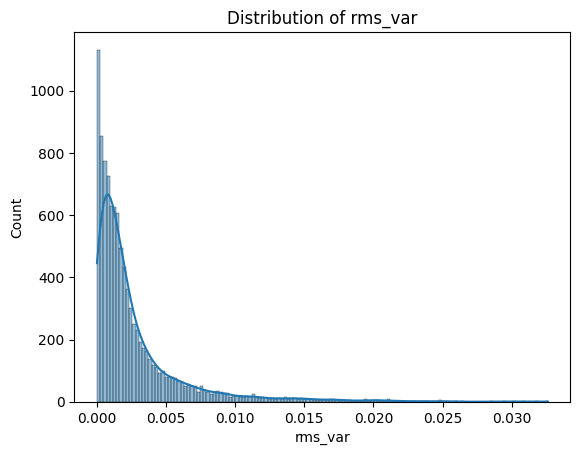

Skewness of rms_var: 3.0713396067286607


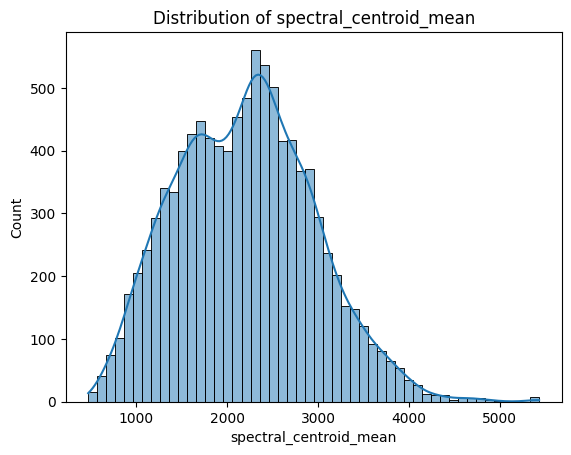

Skewness of spectral_centroid_mean: 0.27108393852653834


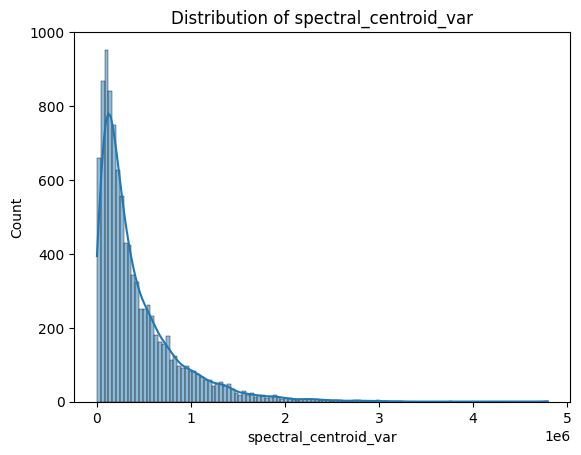

Skewness of spectral_centroid_var: 2.224998962908016


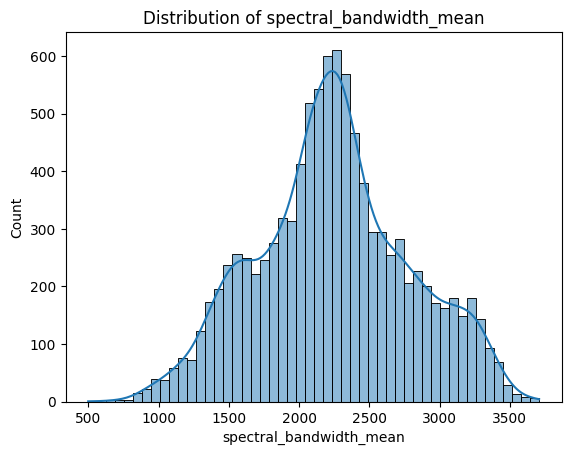

Skewness of spectral_bandwidth_mean: 0.05792310300704405


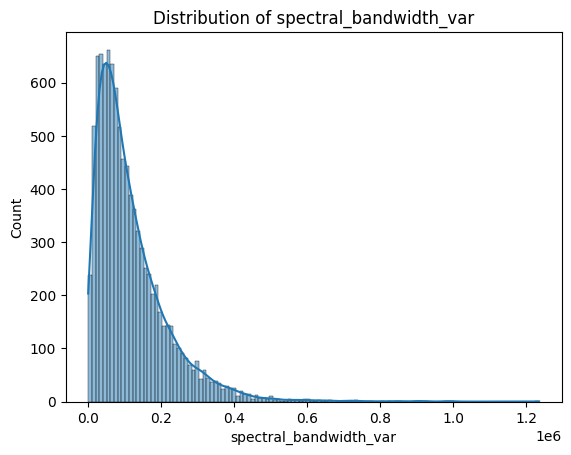

Skewness of spectral_bandwidth_var: 2.2637491935808254


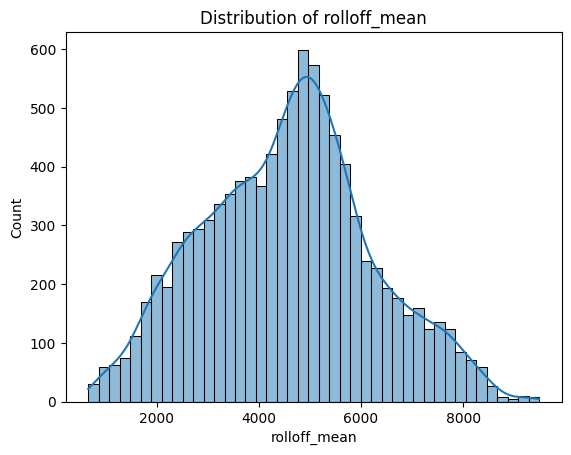

Skewness of rolloff_mean: 0.1010131380406172


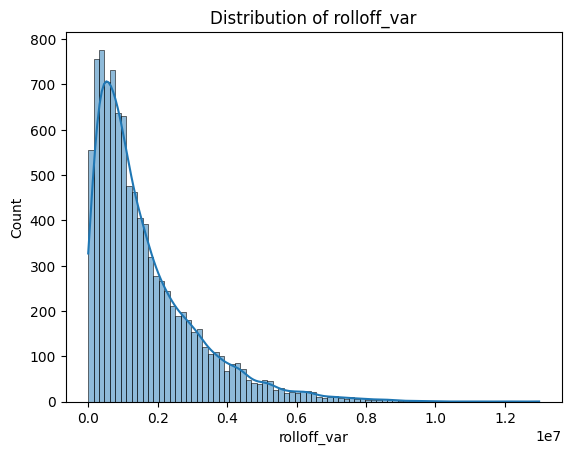

Skewness of rolloff_var: 1.7150775571758832


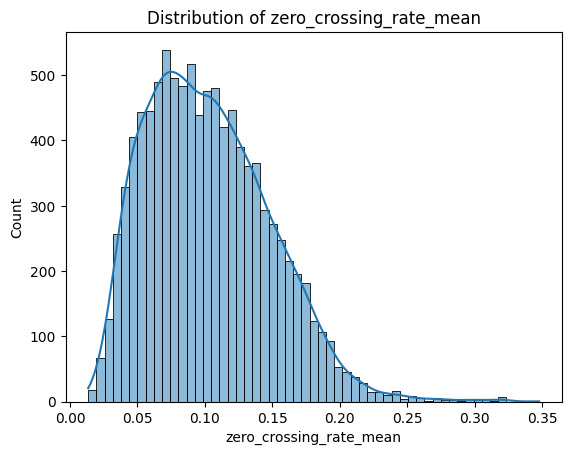

Skewness of zero_crossing_rate_mean: 0.65345727628908


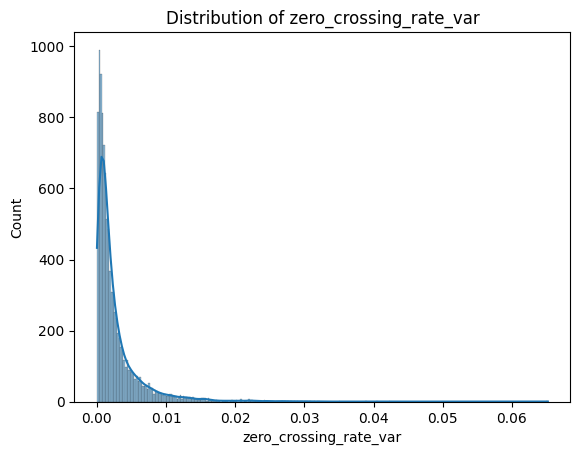

Skewness of zero_crossing_rate_var: 3.8693019816724457


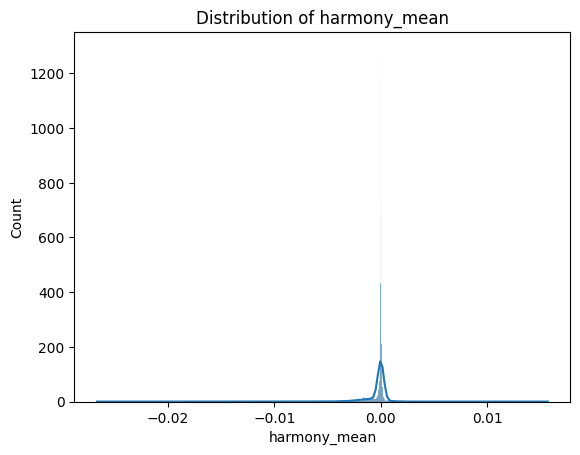

Skewness of harmony_mean: -6.184336807282665


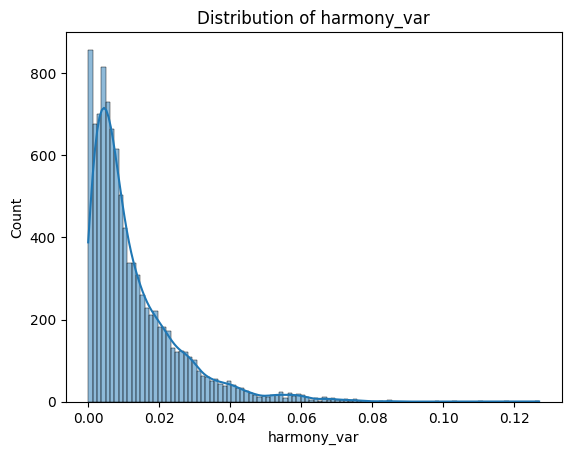

Skewness of harmony_var: 2.0342641512133213


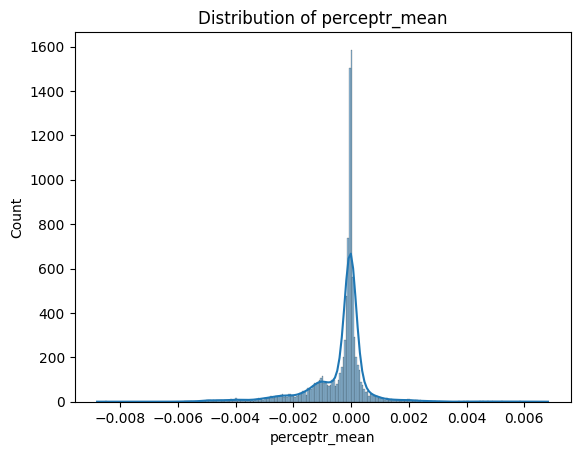

Skewness of perceptr_mean: -1.4696076751496991


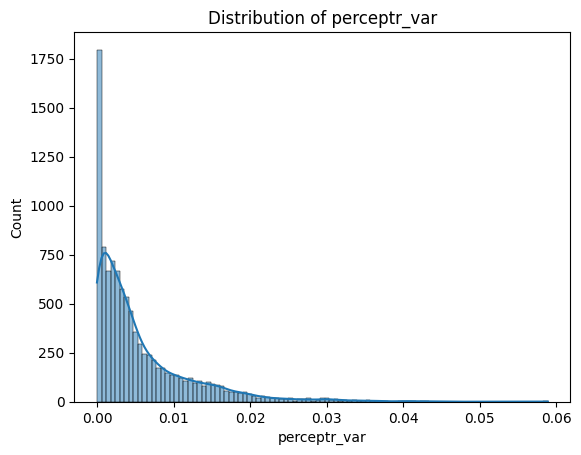

Skewness of perceptr_var: 2.3099497069708503


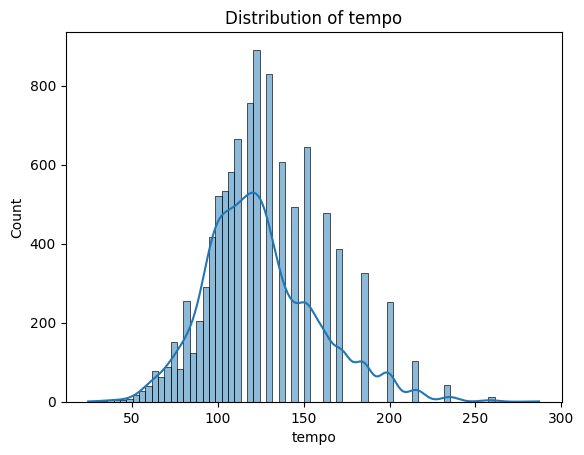

Skewness of tempo: 0.6786067467522423


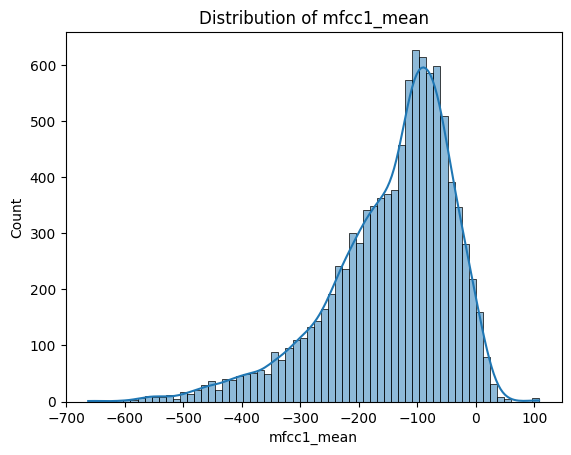

Skewness of mfcc1_mean: -1.1135904237594159


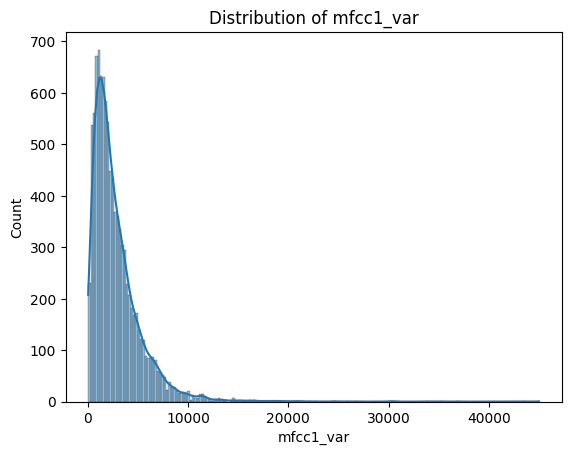

Skewness of mfcc1_var: 3.682464059984569


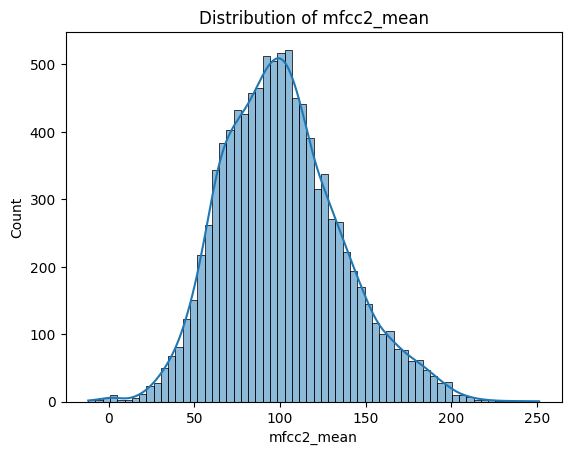

Skewness of mfcc2_mean: 0.40417203206375735


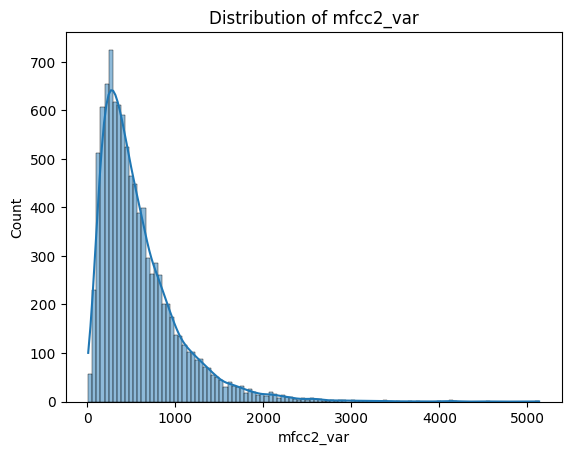

Skewness of mfcc2_var: 2.104398197359448


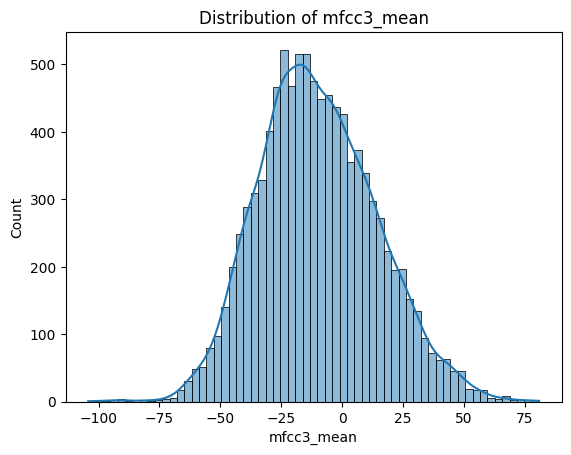

Skewness of mfcc3_mean: 0.253742633896518


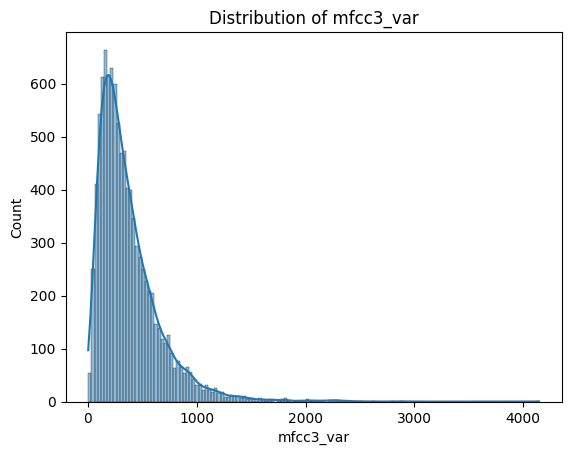

Skewness of mfcc3_var: 2.3649192535185555


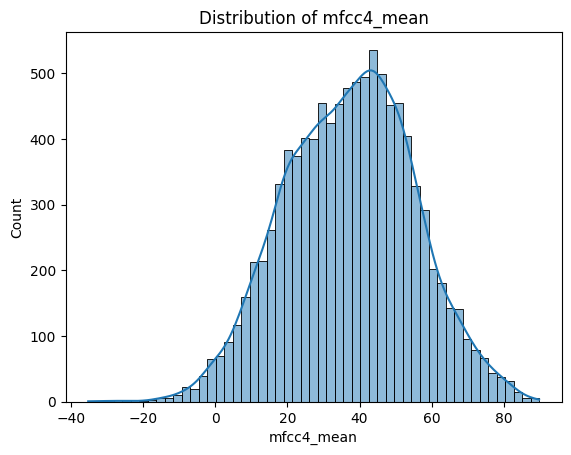

Skewness of mfcc4_mean: -0.05463292155932527


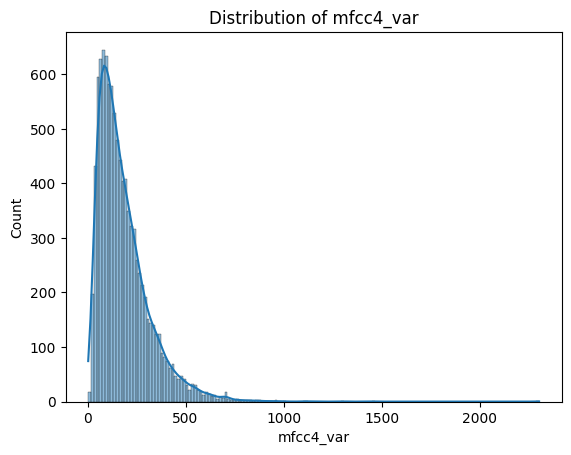

Skewness of mfcc4_var: 2.045457626709719


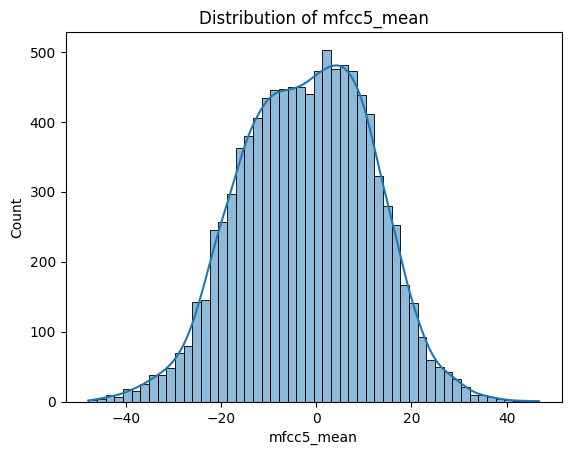

Skewness of mfcc5_mean: -0.09558340025426552


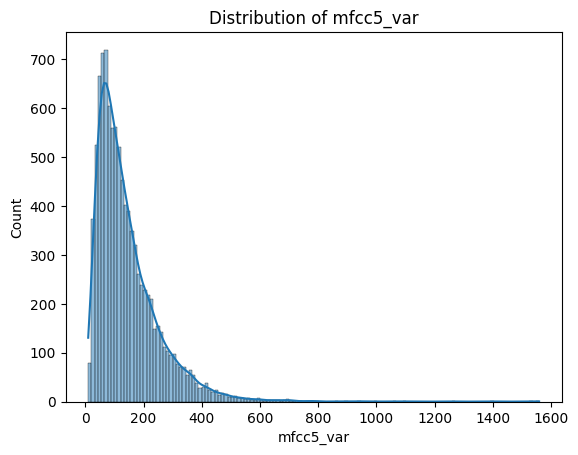

Skewness of mfcc5_var: 2.4105389778817554


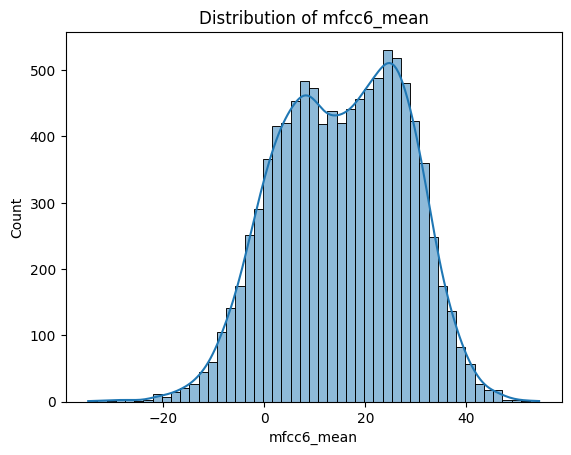

Skewness of mfcc6_mean: -0.16204770826036374


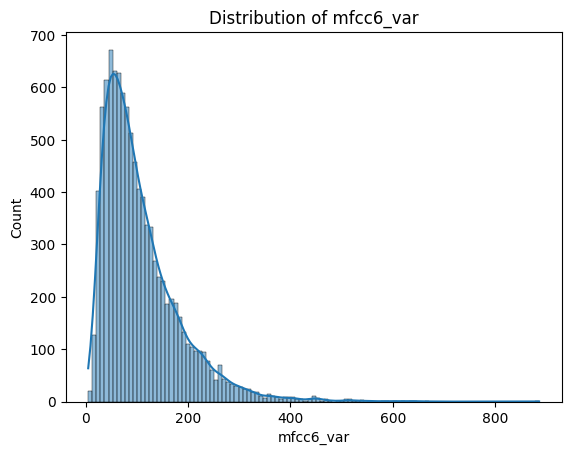

Skewness of mfcc6_var: 1.9083247987026344


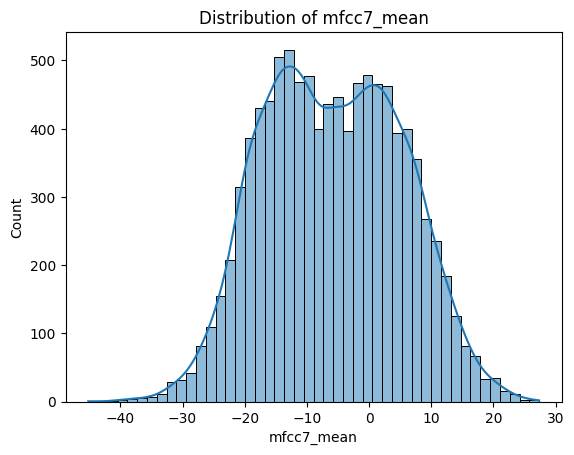

Skewness of mfcc7_mean: 0.04194303058099113


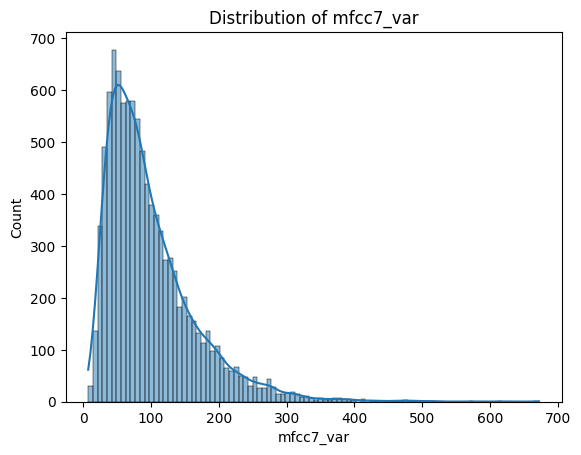

Skewness of mfcc7_var: 1.7483907060950012


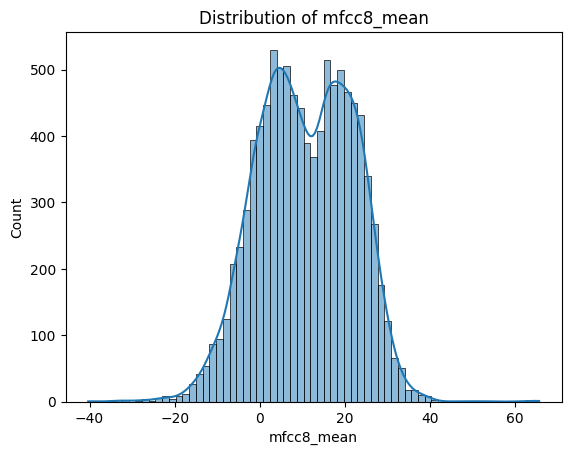

Skewness of mfcc8_mean: -0.10659804570095296


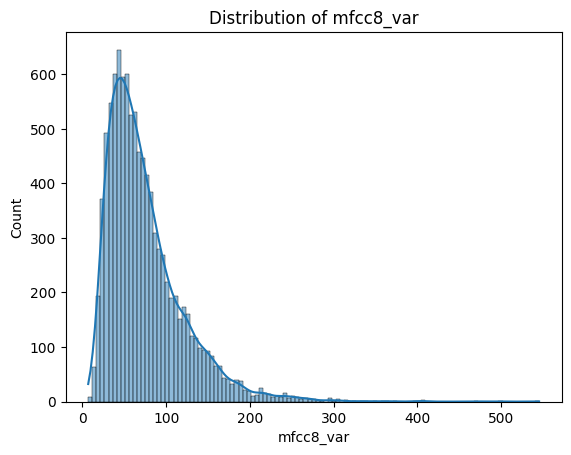

Skewness of mfcc8_var: 1.834372620562834


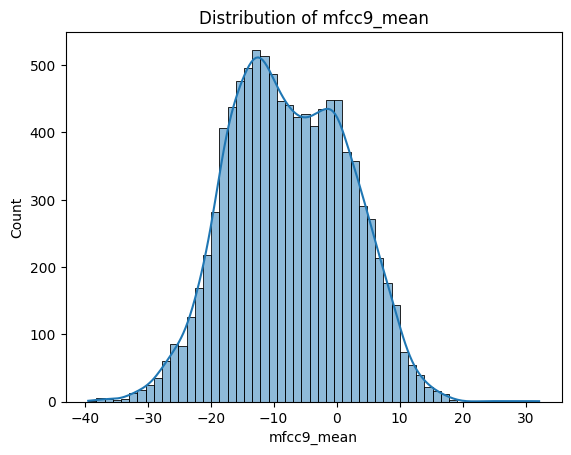

Skewness of mfcc9_mean: 0.039502747839342246


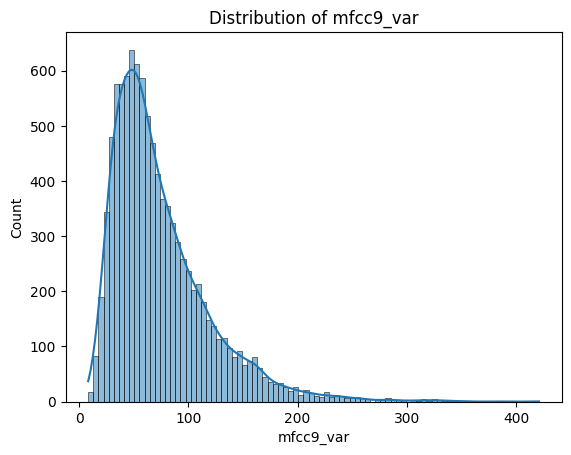

Skewness of mfcc9_var: 1.6936984966892927


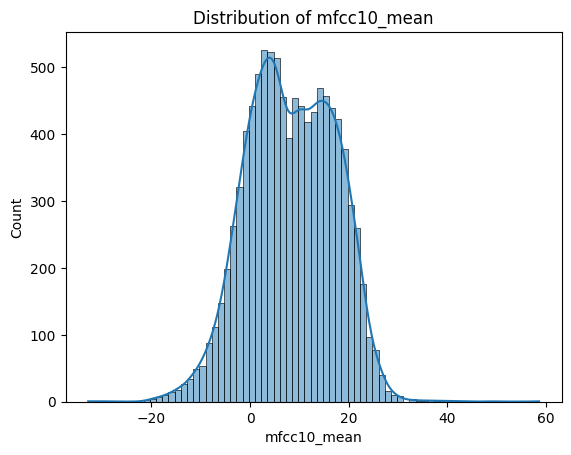

Skewness of mfcc10_mean: -0.07884391093221899


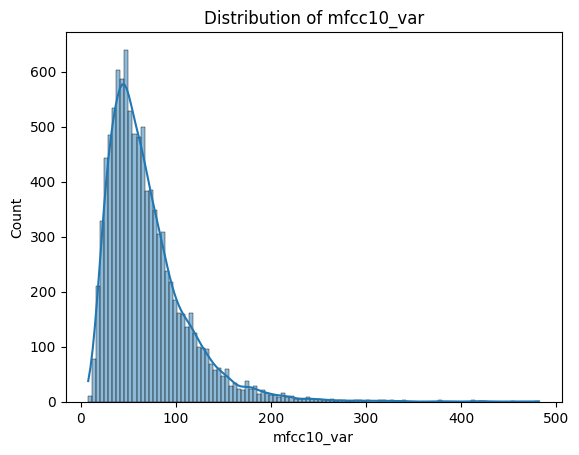

Skewness of mfcc10_var: 2.0329532751847896


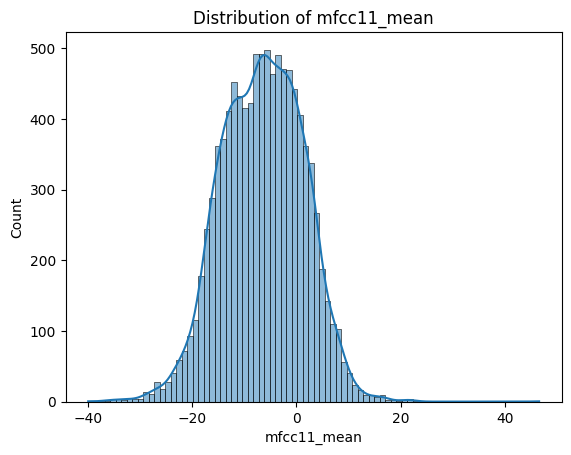

Skewness of mfcc11_mean: -0.06345350660647311


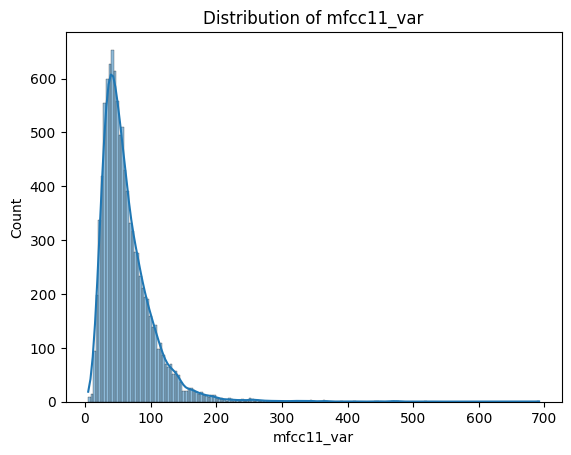

Skewness of mfcc11_var: 2.9792415877976284


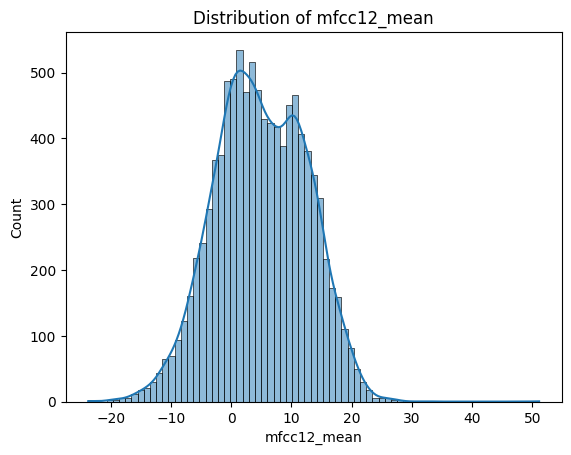

Skewness of mfcc12_mean: -0.04452926793776743


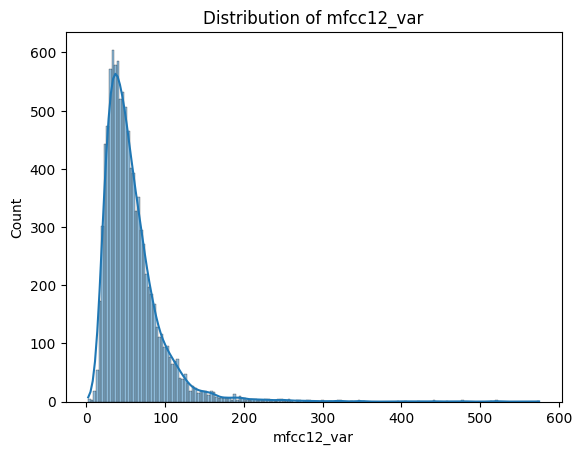

Skewness of mfcc12_var: 3.5556518950566547


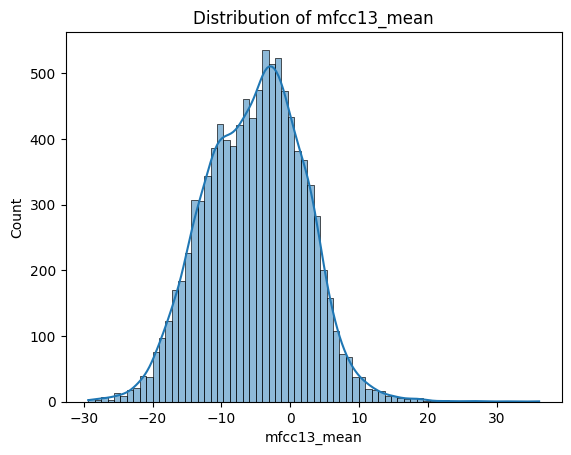

Skewness of mfcc13_mean: -0.0005098543724587267


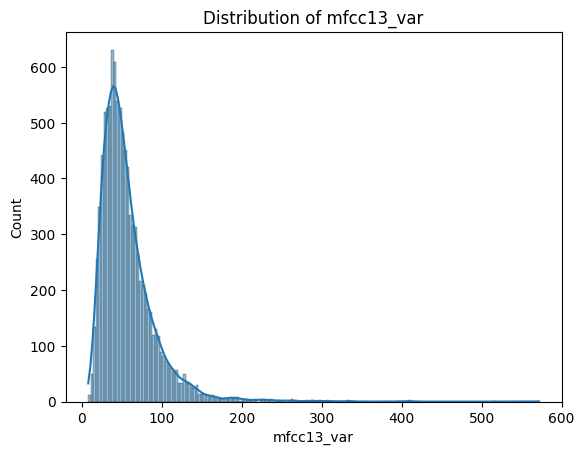

Skewness of mfcc13_var: 3.077685068839508


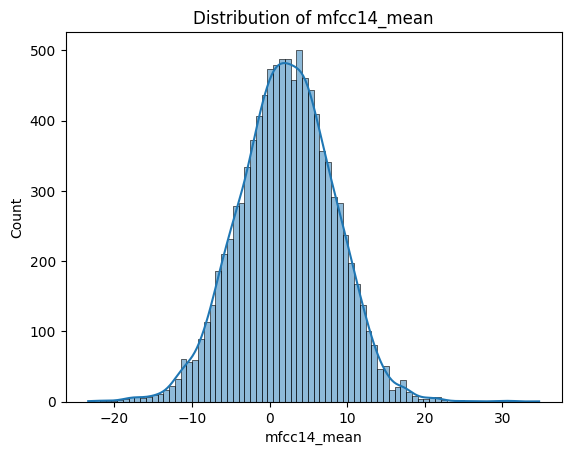

Skewness of mfcc14_mean: -0.026592190830931024


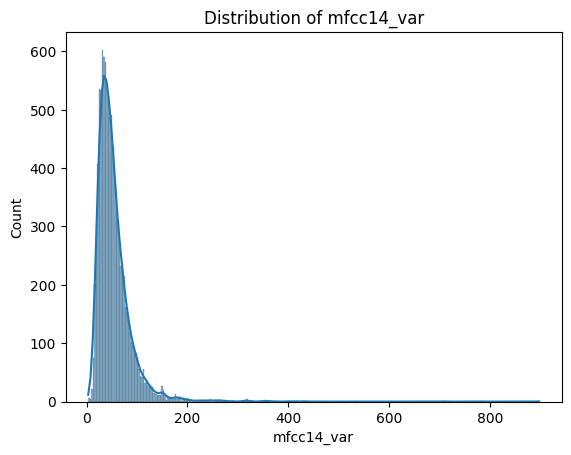

Skewness of mfcc14_var: 5.442177048009811


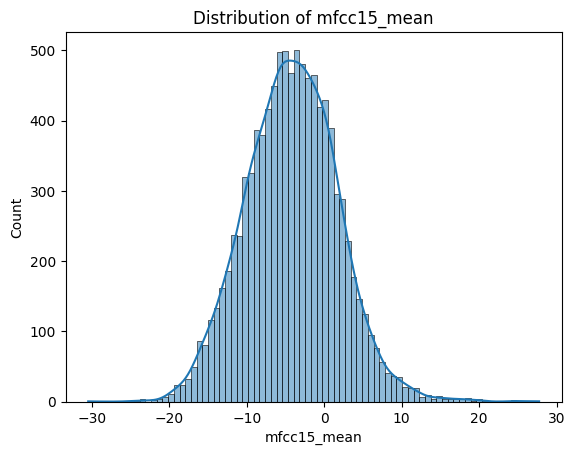

Skewness of mfcc15_mean: 0.15370813962821478


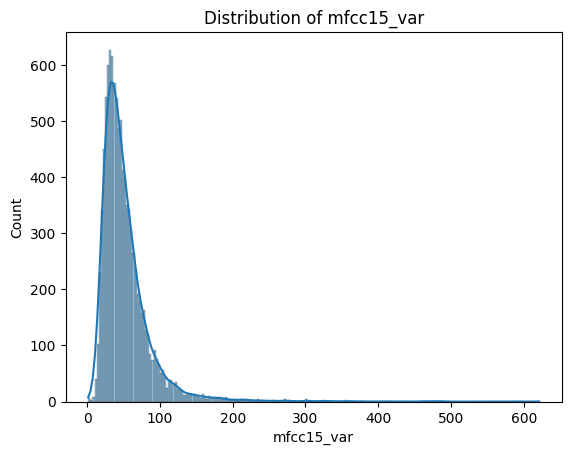

Skewness of mfcc15_var: 4.290306028452294


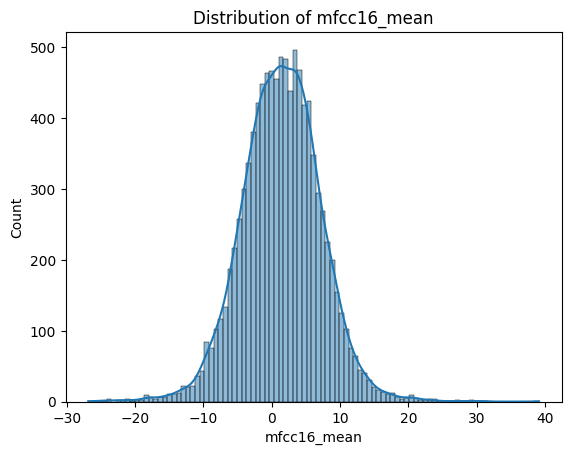

Skewness of mfcc16_mean: -0.0017476022380227096


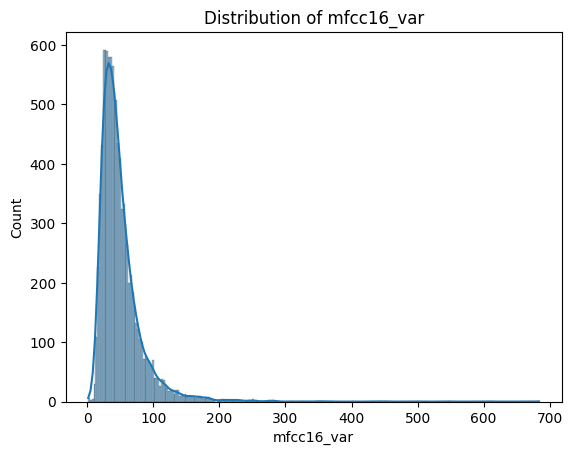

Skewness of mfcc16_var: 4.274884708700504


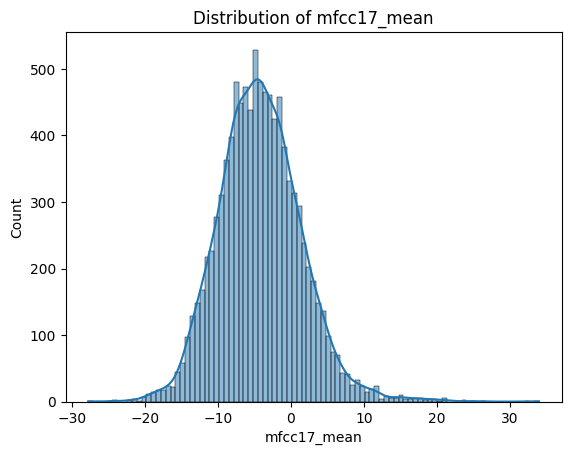

Skewness of mfcc17_mean: 0.45094123436981265


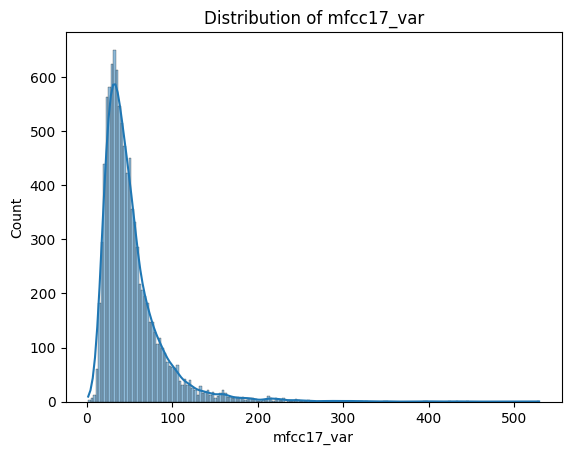

Skewness of mfcc17_var: 3.134224422176456


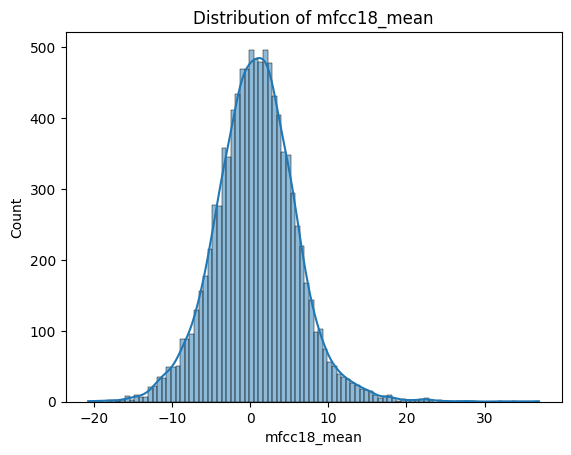

Skewness of mfcc18_mean: 0.26421800387909844


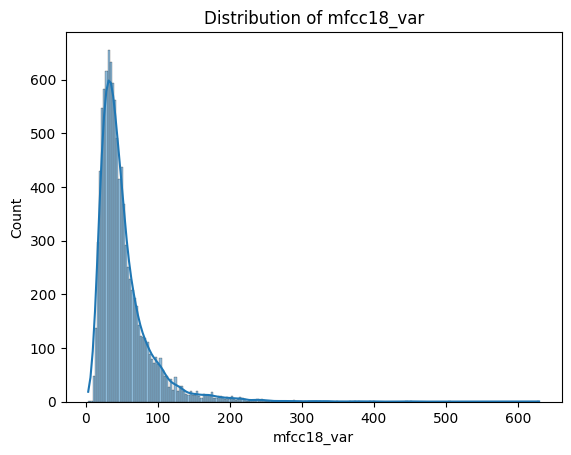

Skewness of mfcc18_var: 3.255076789126635


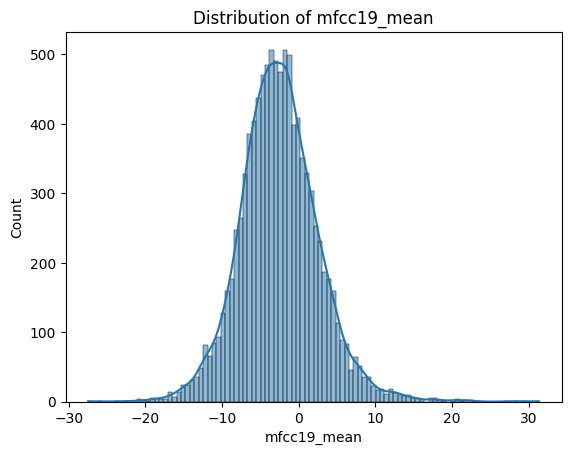

Skewness of mfcc19_mean: 0.38957792110465667


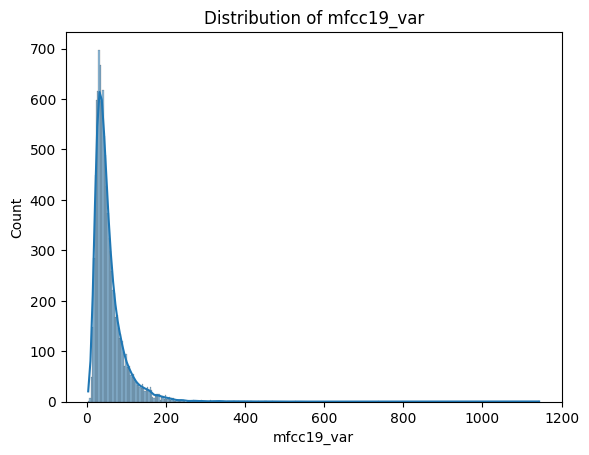

Skewness of mfcc19_var: 4.8023536239691245


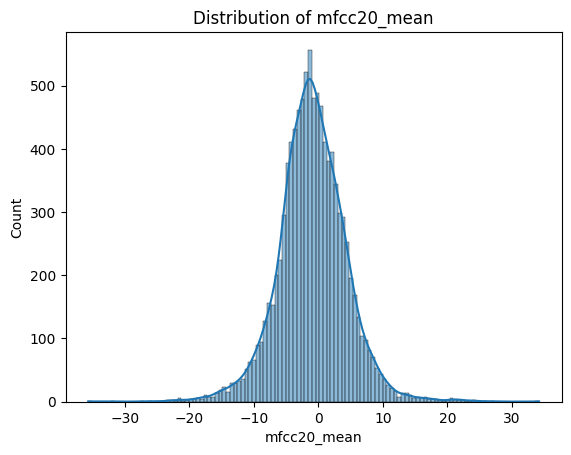

Skewness of mfcc20_mean: 0.06078351039288982


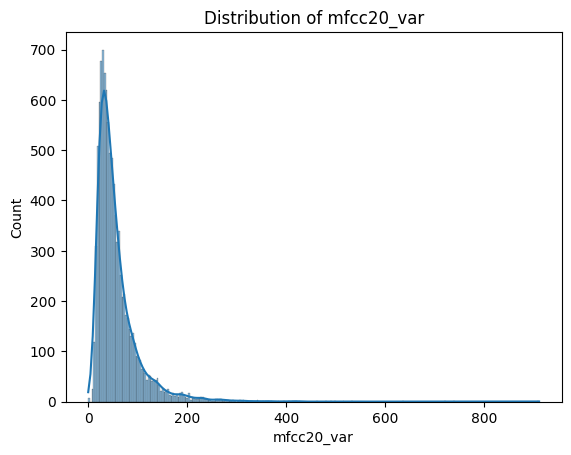

Skewness of mfcc20_var: 4.0090725779564105


In [ ]:
hist_plot(features_3_sec) # Histogram plots for the features of 3 sec audio clips

## **Functions for Transformations of Dataset**
Let's define a few functions for transformation of our skewed data. We are going to define these functions in one place and then we can use them as needed. Each of these functions take the Dataset as argument and calculates and returns back the transformed data. Note : As we can only apply transformations to numerical columns of a Dataframe. So these functions automatically removes the non-numeric columns.

In [ ]:
## Log Transformation:

def log_transform(data):
    ## Identify columns with string or object data types
    object_columns = data.select_dtypes(include=['object']).columns
    data_numeric = data.drop(object_columns, axis=1)
    ## Apply log transformation to the data
    transformed_data = np.log(data_numeric)
    return transformed_data

## Standard Scaling (Z-score normalization)

def standard_scale(data):
    object_columns = data.select_dtypes(include=['object']).columns
    data_numeric = data.drop(object_columns, axis=1)
    ## Create a StandardScaler object
    scaler = StandardScaler()

    ## Fit the scaler on the data and transform it
    transformed_data = scaler.fit_transform(data_numeric)

    return transformed_data

## Square Root Transformation:

def sqrt_transform(data):
    object_columns = data.select_dtypes(include=['object']).columns
    data_numeric = data.drop(object_columns, axis=1)
    ## Apply square root transformation to the data
    transformed_data = np.sqrt(data_numeric)
    return transformed_data

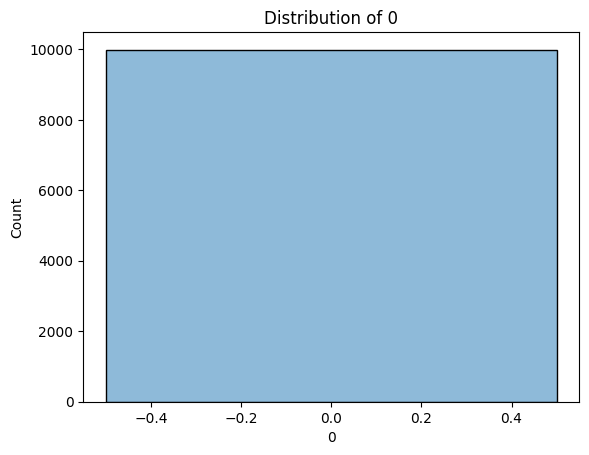

Skewness of 0: 0


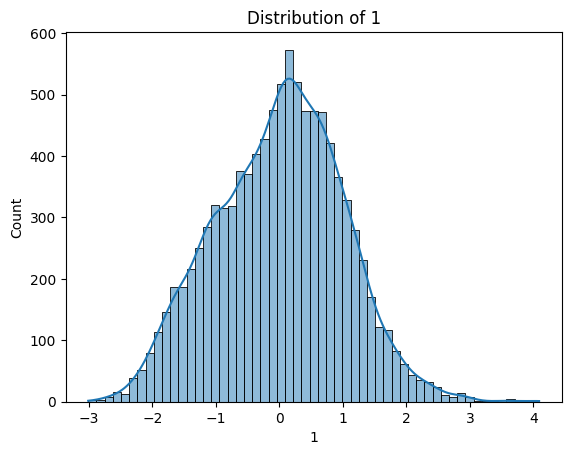

Skewness of 1: -0.017924318429075468


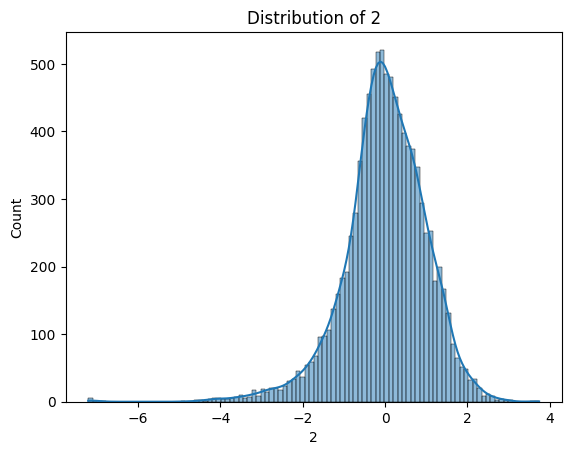

Skewness of 2: -0.7736799244700681


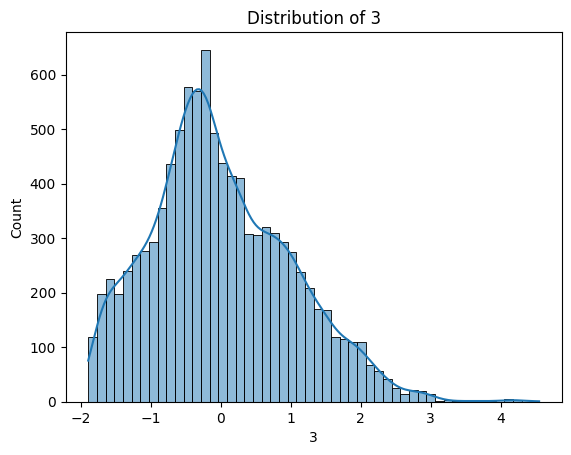

Skewness of 3: 0.4991287150482336


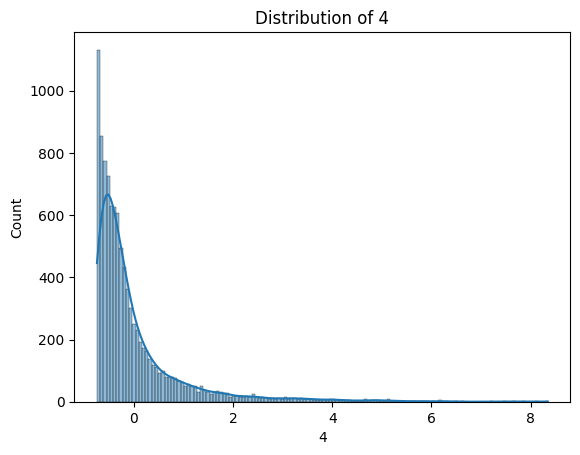

Skewness of 4: 3.071339606728659


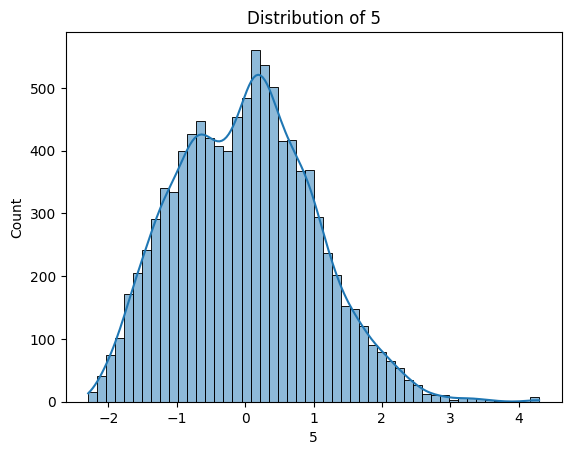

Skewness of 5: 0.271083938526539


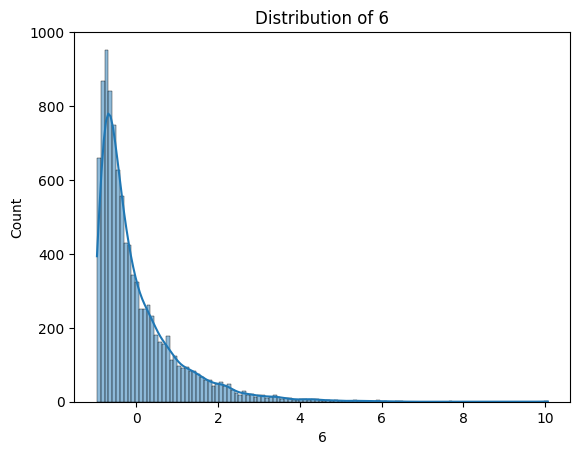

Skewness of 6: 2.224998962908016


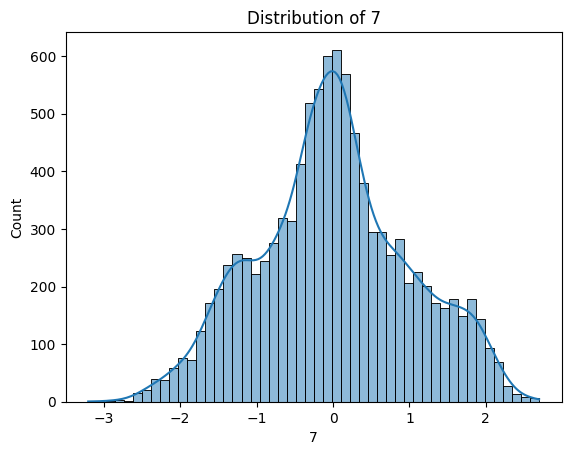

Skewness of 7: 0.05792310300704453


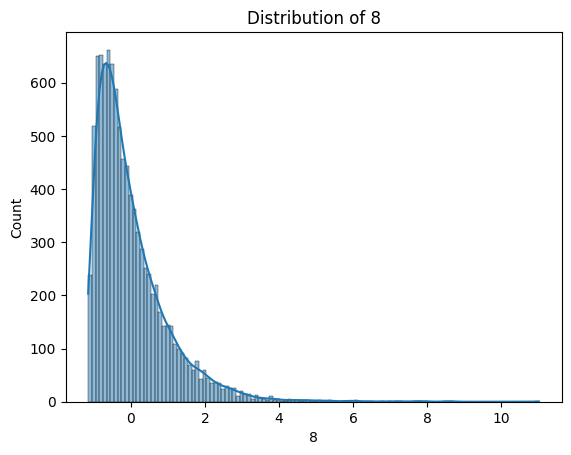

Skewness of 8: 2.263749193580824


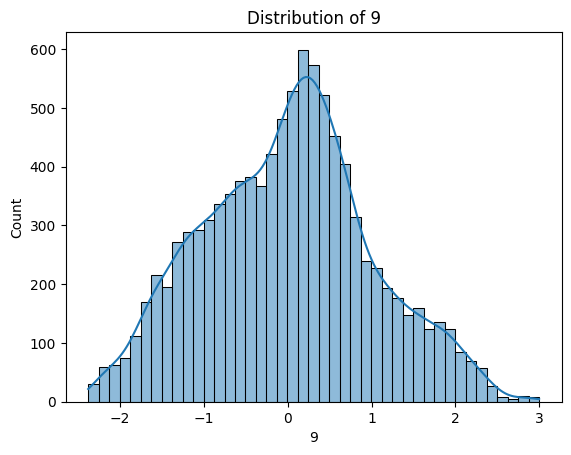

Skewness of 9: 0.10101313804061718


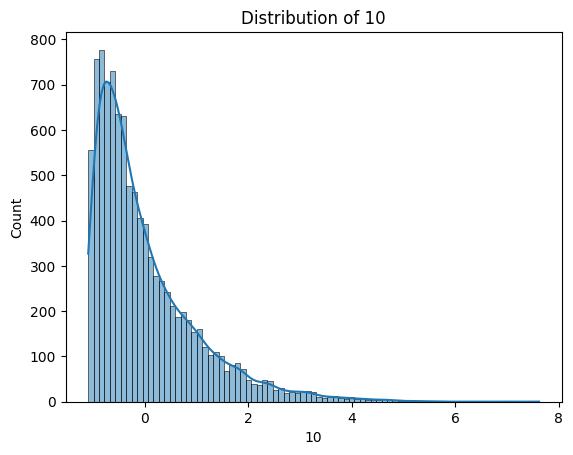

Skewness of 10: 1.7150775571758836


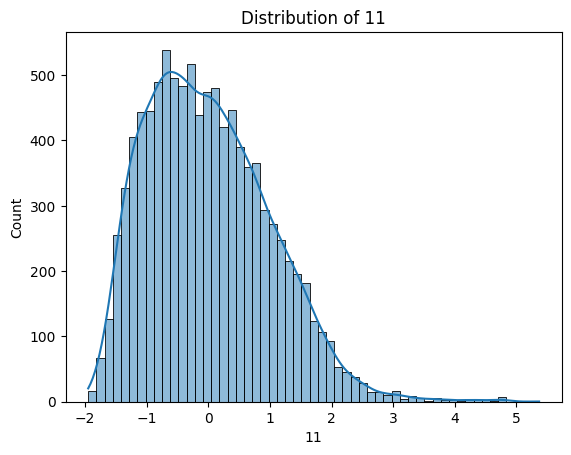

Skewness of 11: 0.6534572762890806


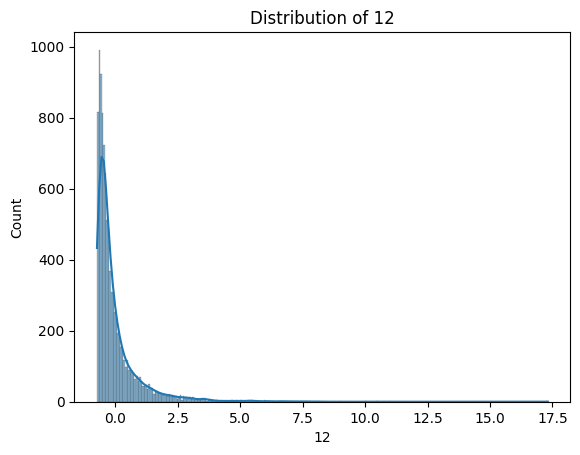

Skewness of 12: 3.8693019816724443


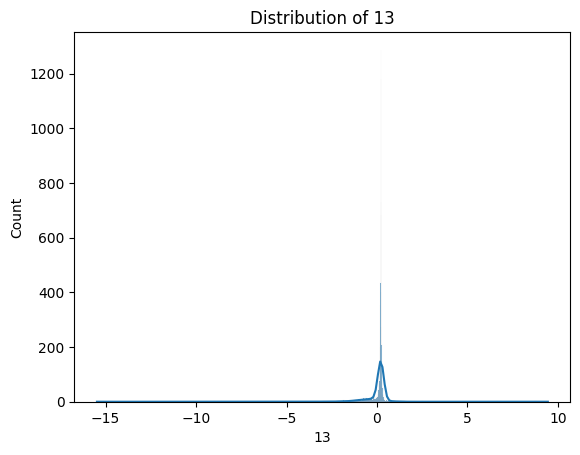

Skewness of 13: -6.184336807282665


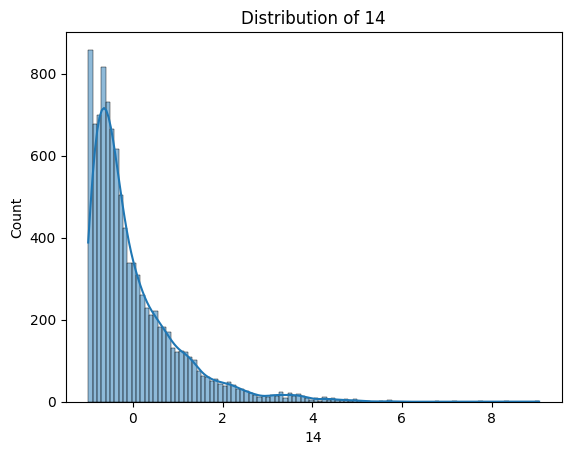

Skewness of 14: 2.0342641512133217


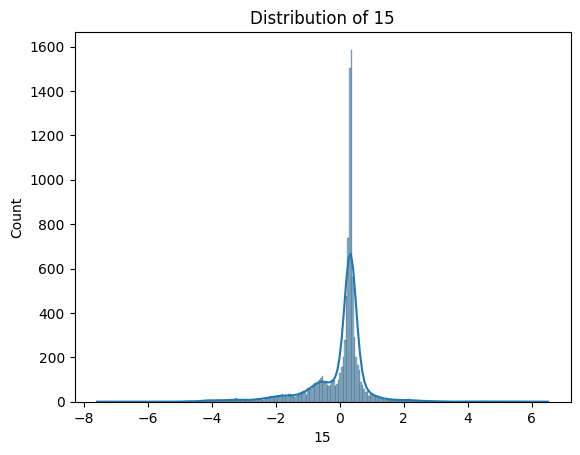

Skewness of 15: -1.4696076751496996


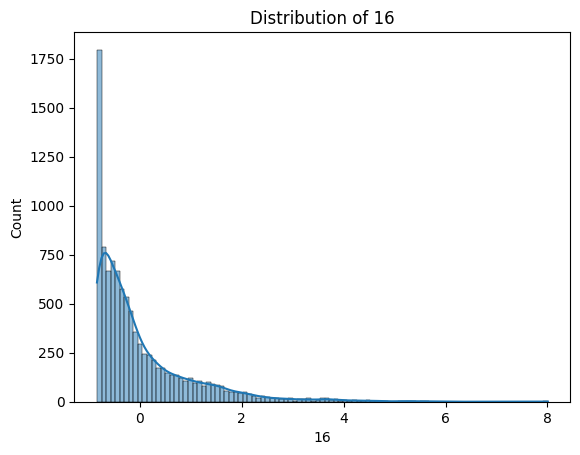

Skewness of 16: 2.3099497069708503


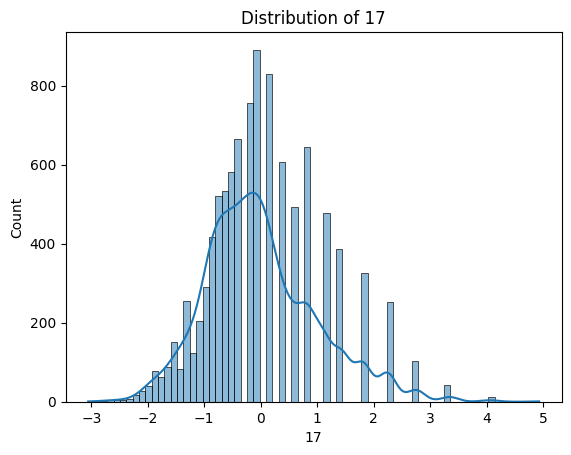

Skewness of 17: 0.6786067467522423


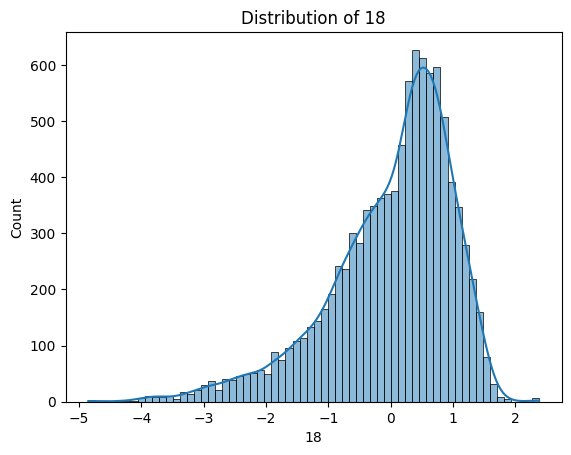

Skewness of 18: -1.1135904237594159


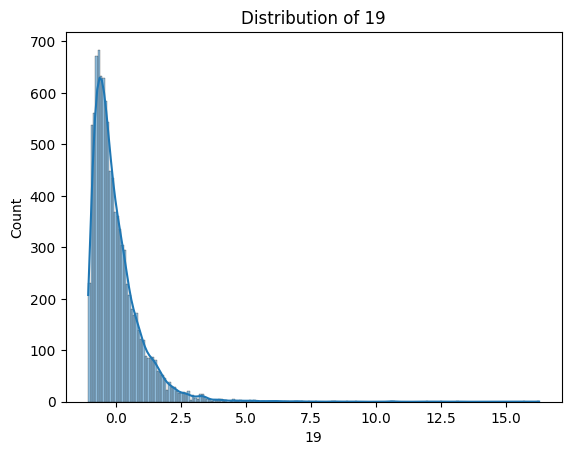

Skewness of 19: 3.682464059984569


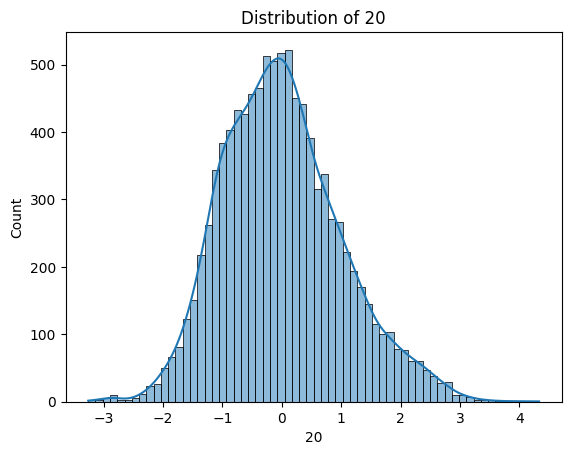

Skewness of 20: 0.40417203206375746


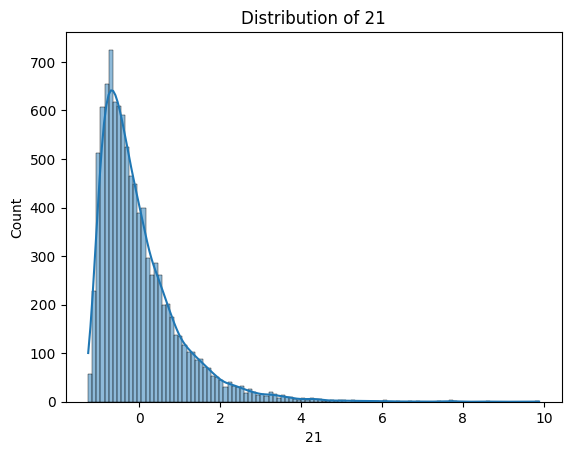

Skewness of 21: 2.104398197359448


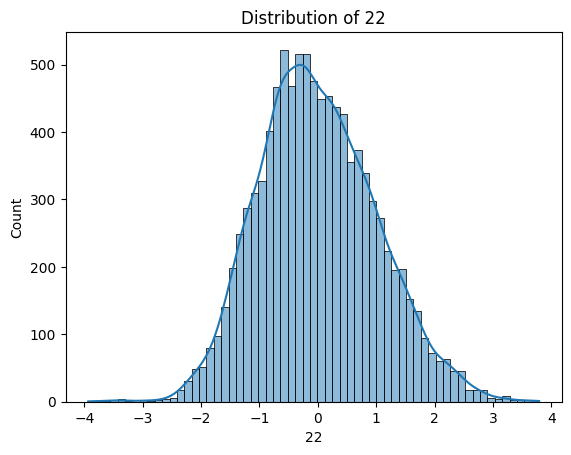

Skewness of 22: 0.25374263389651797


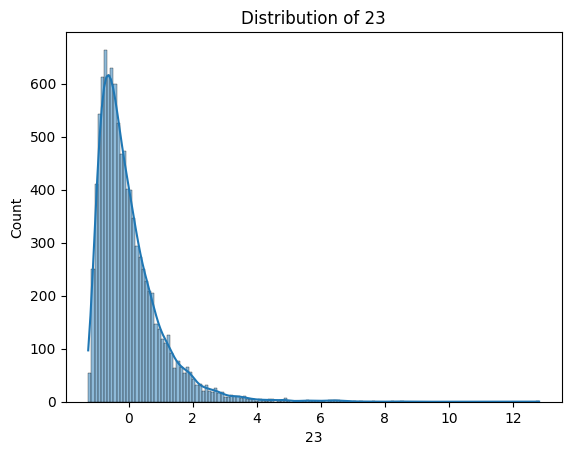

Skewness of 23: 2.364919253518555


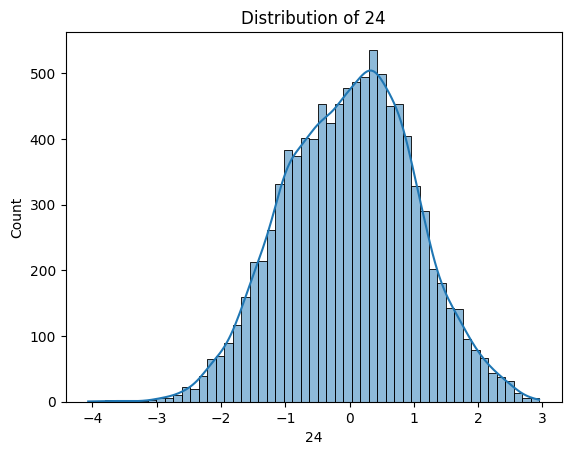

Skewness of 24: -0.054632921559325795


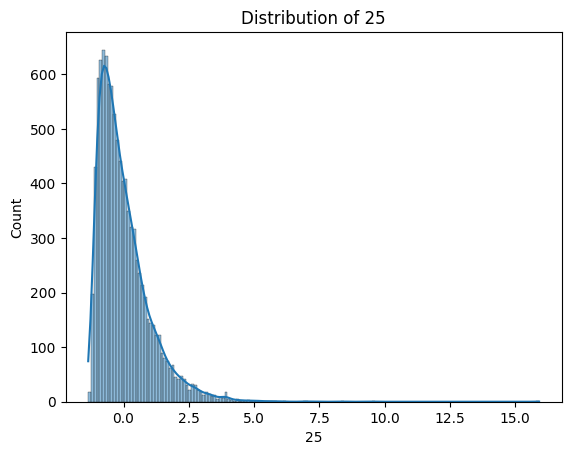

Skewness of 25: 2.0454576267097195


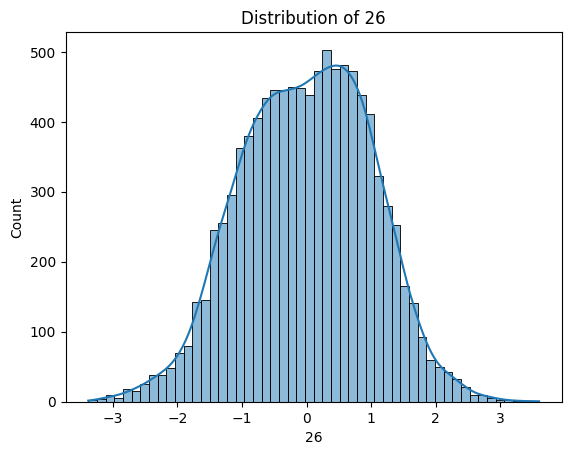

Skewness of 26: -0.09558340025426552


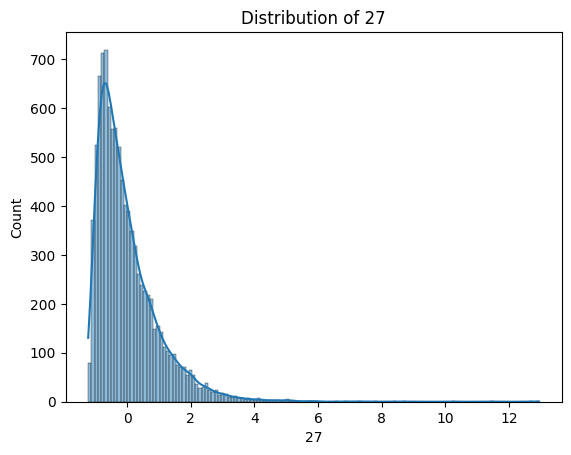

Skewness of 27: 2.4105389778817545


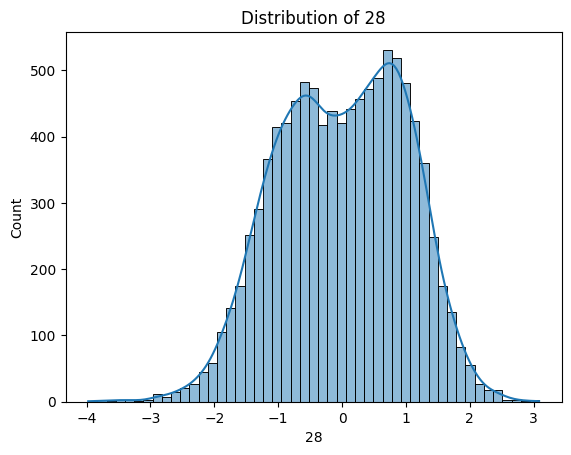

Skewness of 28: -0.1620477082603638


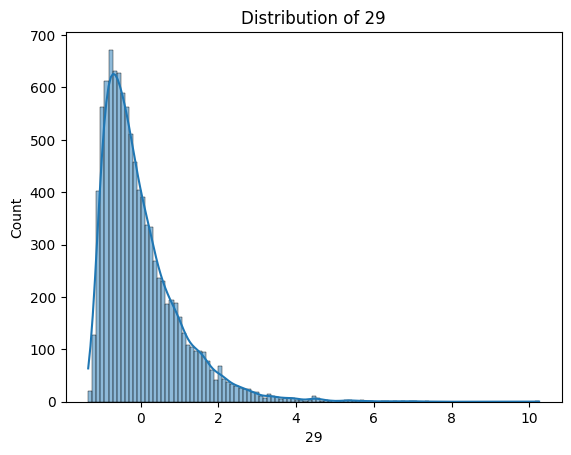

Skewness of 29: 1.9083247987026348


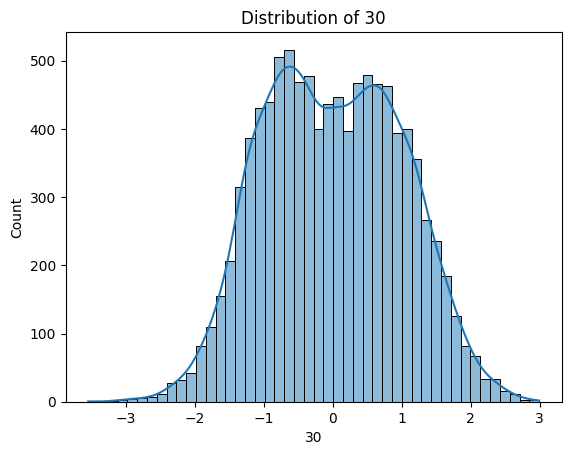

Skewness of 30: 0.04194303058099114


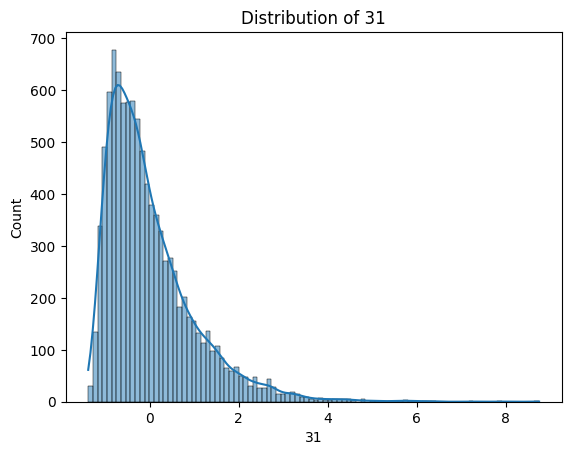

Skewness of 31: 1.7483907060950012


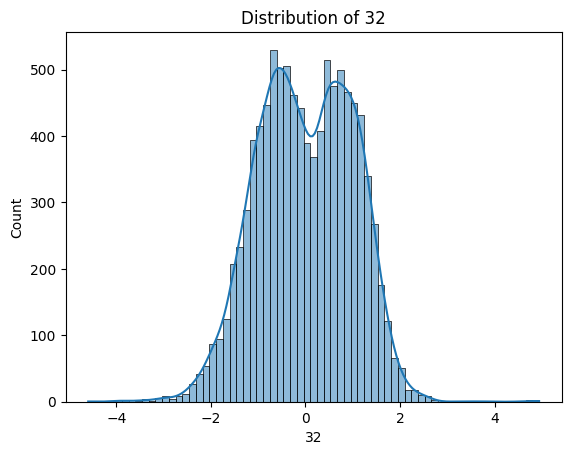

Skewness of 32: -0.10659804570095296


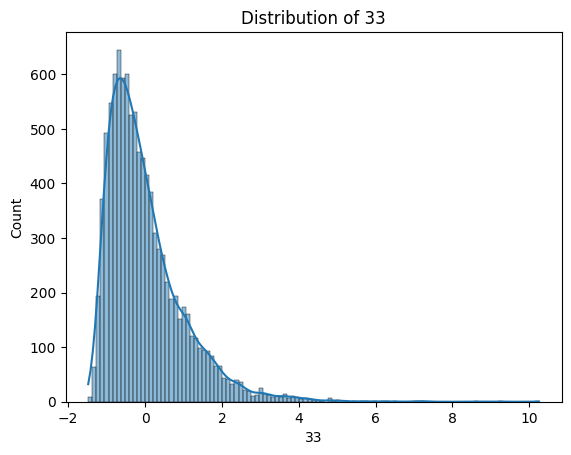

Skewness of 33: 1.8343726205628337


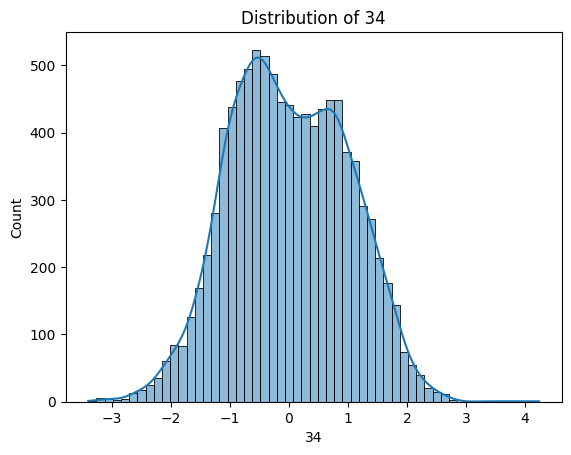

Skewness of 34: 0.03950274783934225


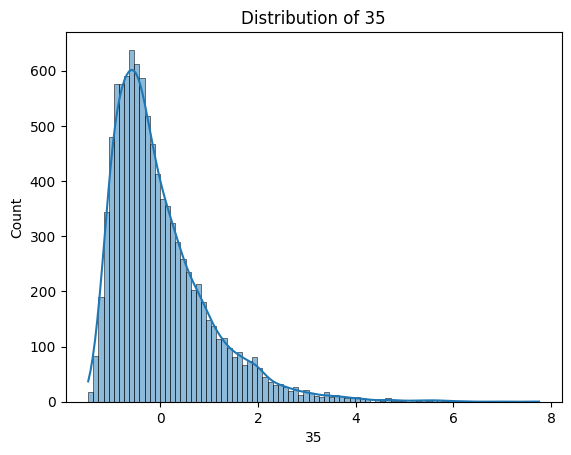

Skewness of 35: 1.6936984966892923


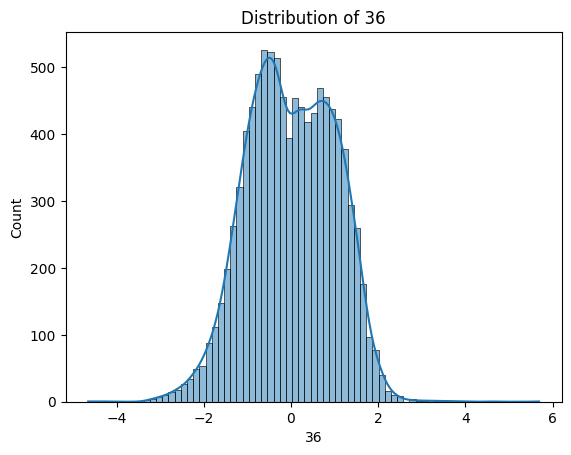

Skewness of 36: -0.07884391093221893


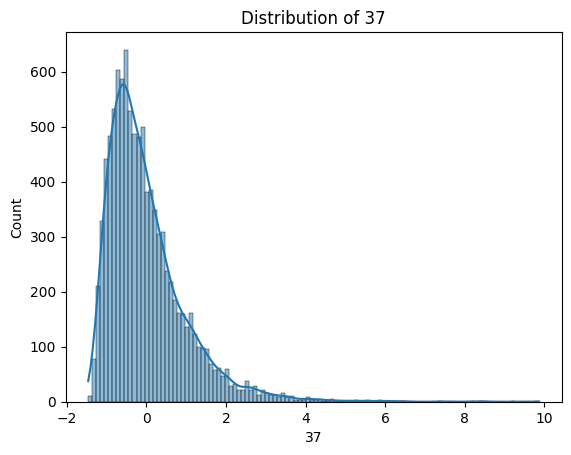

Skewness of 37: 2.0329532751847905


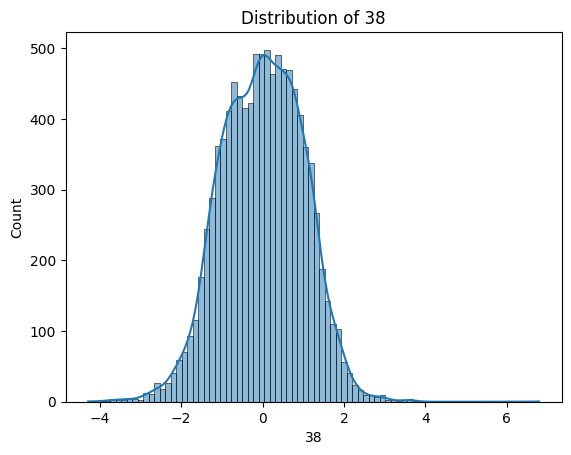

Skewness of 38: -0.06345350660647305


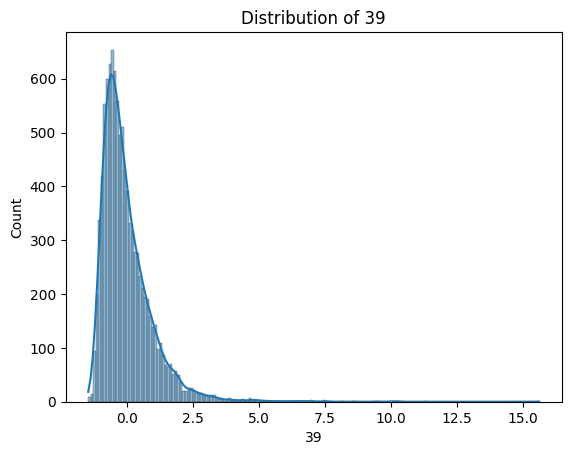

Skewness of 39: 2.9792415877976284


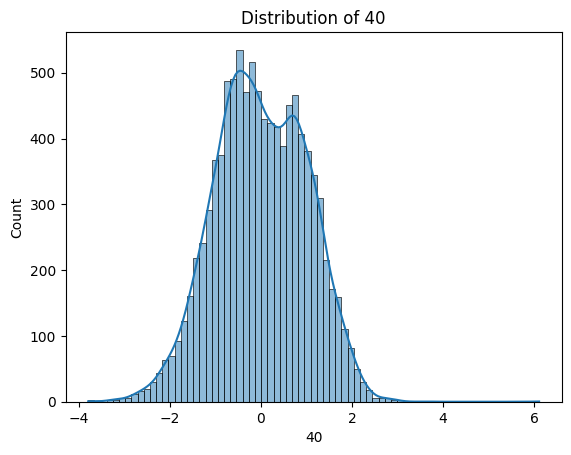

Skewness of 40: -0.04452926793776726


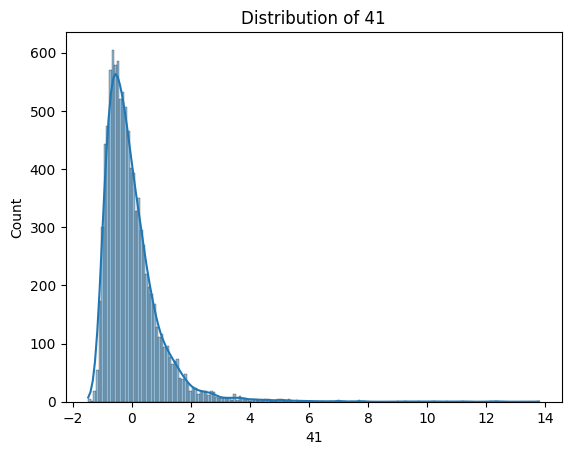

Skewness of 41: 3.555651895056656


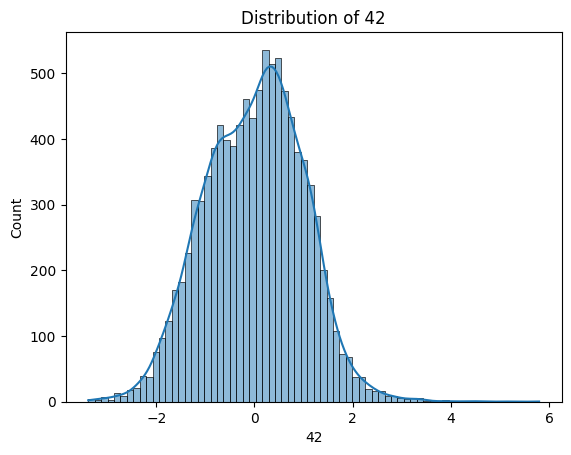

Skewness of 42: -0.0005098543724587648


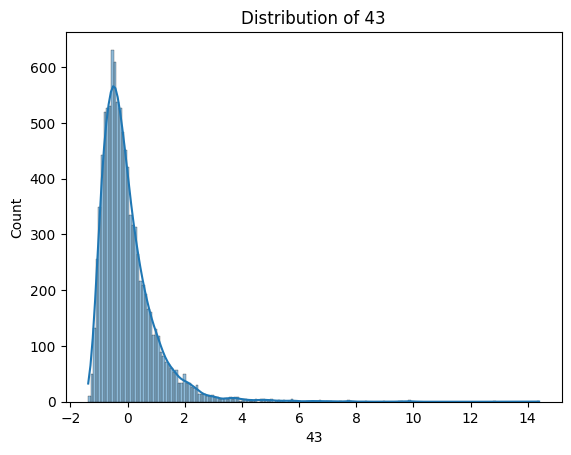

Skewness of 43: 3.077685068839508


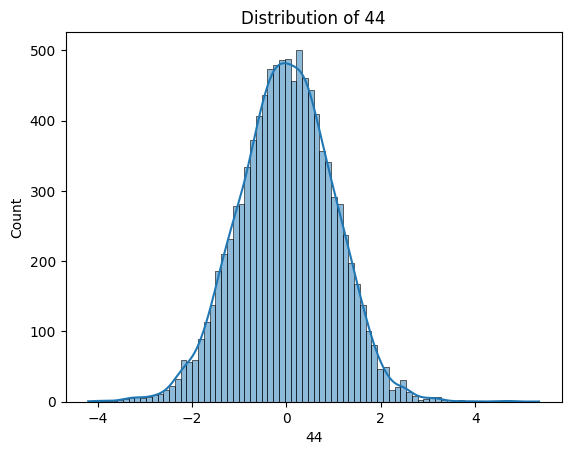

Skewness of 44: -0.026592190830931013


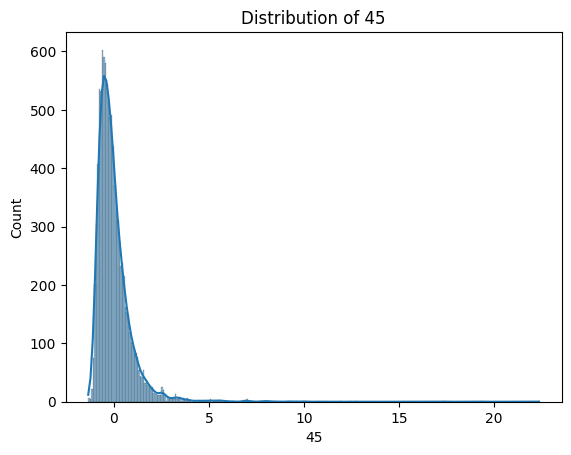

Skewness of 45: 5.442177048009811


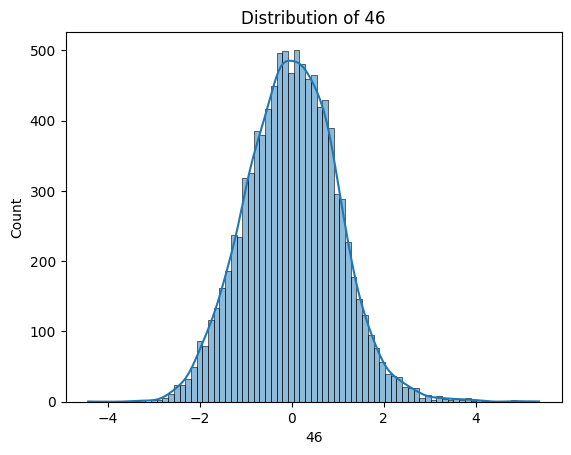

Skewness of 46: 0.1537081396282148


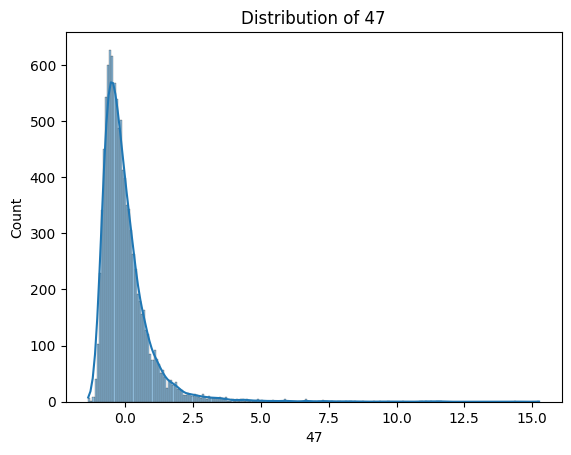

Skewness of 47: 4.290306028452294


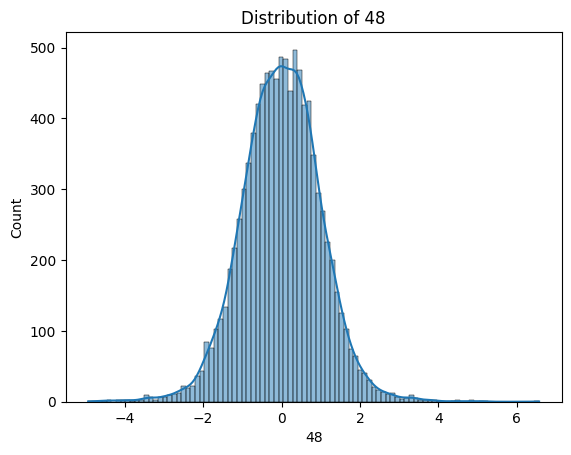

Skewness of 48: -0.0017476022380226535


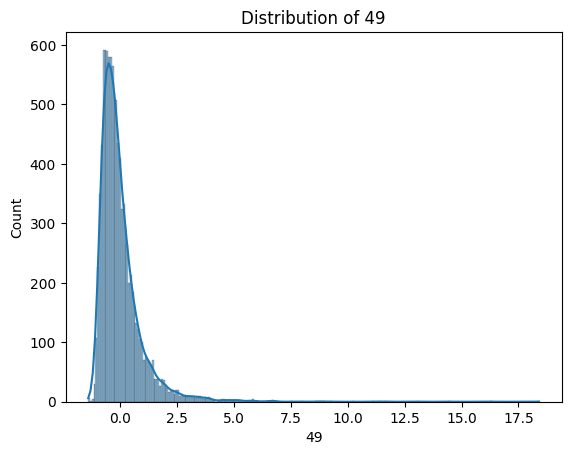

Skewness of 49: 4.2748847087005055


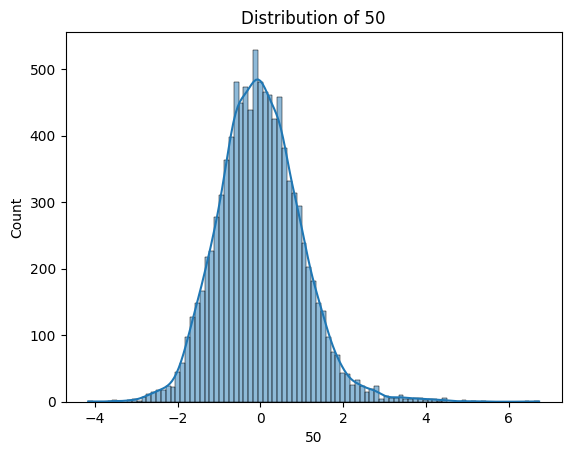

Skewness of 50: 0.4509412343698128


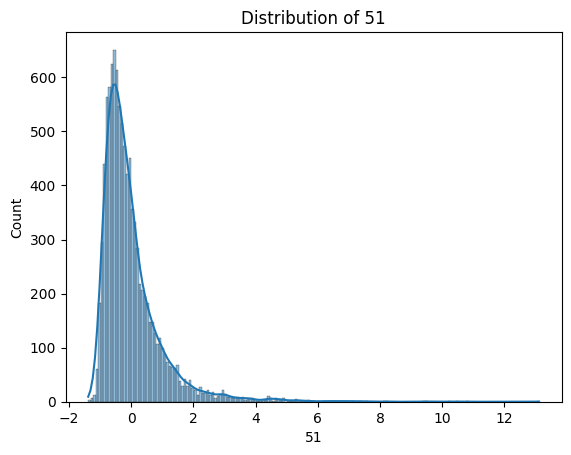

Skewness of 51: 3.134224422176456


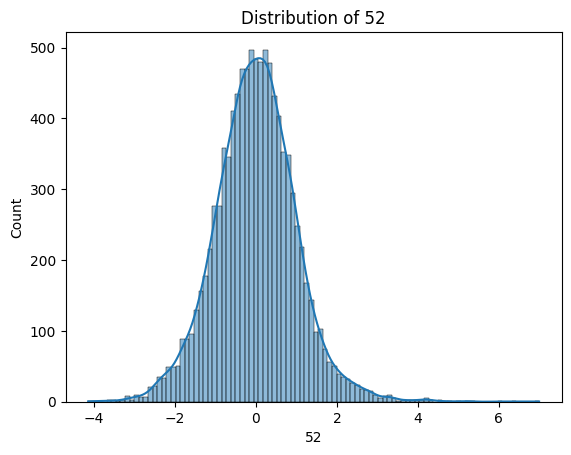

Skewness of 52: 0.26421800387909833


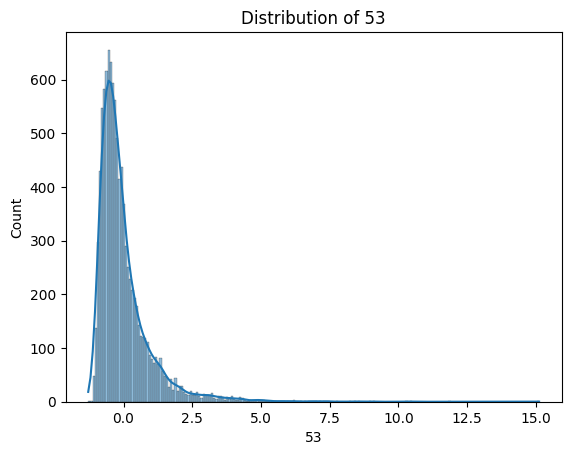

Skewness of 53: 3.255076789126635


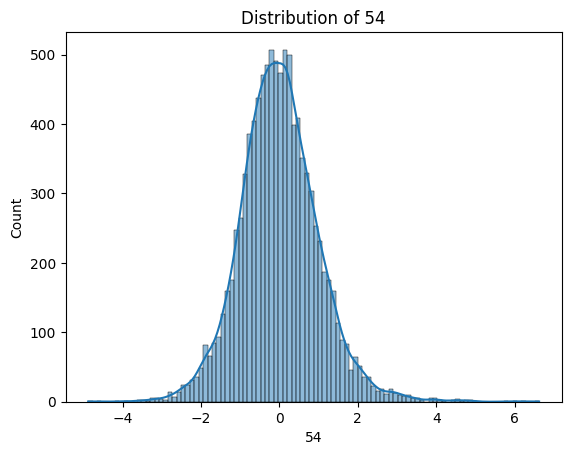

Skewness of 54: 0.38957792110465667


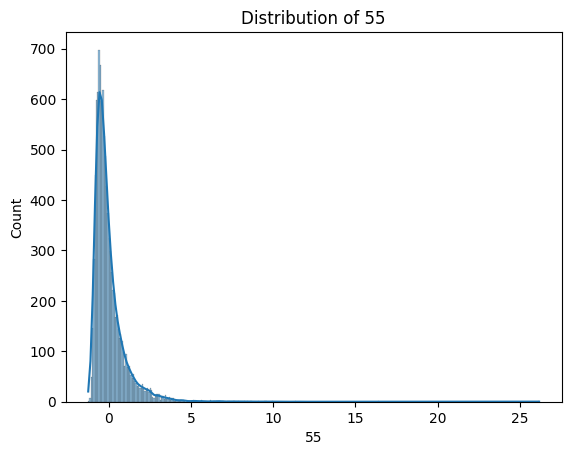

Skewness of 55: 4.802353623969124


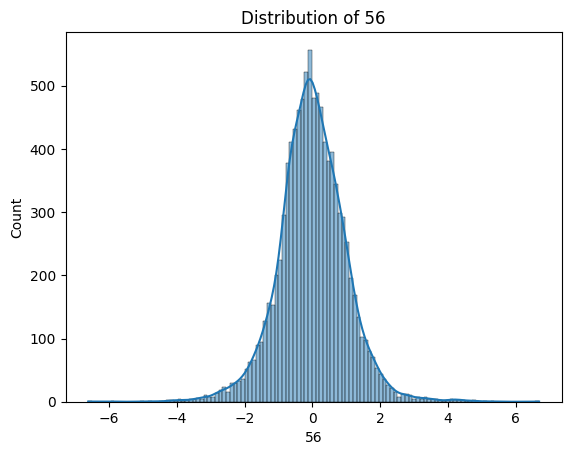

Skewness of 56: 0.06078351039288982


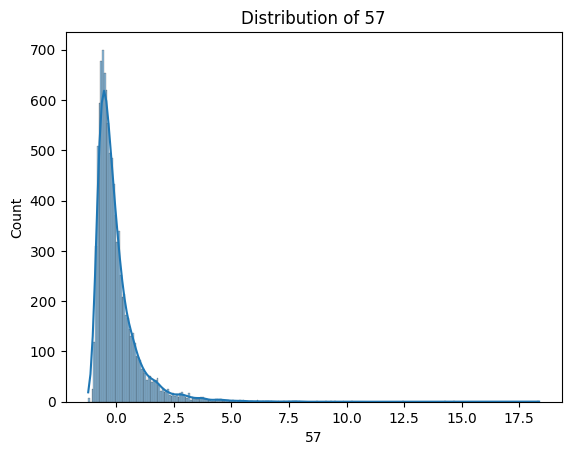

Skewness of 57: 4.0090725779564105


In [ ]:
## Perform standard scaling on the entire dataset
transformed_data = standard_scale(features_3_sec) ## In general we should be using features_3_sec data so that it will be faster to train our Network
transformed_data = pd.DataFrame(transformed_data)
hist_plot(transformed_data)

In [ ]:
transformed_data

,0,1,2,3,4,5,6,7,8,9,...,48,49,50,51,52,53,54,55,56,57
0,0.0,-0.487808,0.640520,-0.006624,0.235568,-0.566828,-0.572791,-0.493983,-0.009229,-0.518590,...,-0.750122,-0.299108,0.168647,-0.425137,-0.003423,-0.376938,-0.499464,-0.513562,0.128414,-0.291781
1,0.0,-0.403142,0.131835,-0.264944,-0.342134,-0.508798,-0.749862,-0.425382,-0.519010,-0.424118,...,0.457983,0.428544,-0.327031,-0.310040,-0.112125,-0.032083,-0.066593,1.011384,1.275780,0.056425
2,0.0,-0.361694,0.764491,0.016695,0.542195,-0.546245,-0.701852,-0.288365,-0.425734,-0.346190,...,0.585548,0.503695,0.428053,-0.648762,0.316311,-0.177372,0.109337,-0.046244,0.653907,-0.521458
3,0.0,-0.175714,0.205477,0.024885,-0.063820,-0.723482,-0.700599,-0.517344,-0.348881,-0.607665,...,-0.489524,-0.065309,0.062981,-0.649076,0.092384,-0.464121,-0.211882,-0.099501,0.865880,-0.544744
4,0.0,-0.485895,0.337521,0.181345,-0.272072,-0.756246,-0.774827,-0.538557,-0.572962,-0.667537,...,0.112417,-0.570609,0.856651,-0.167089,0.183265,-0.029476,-0.175130,-0.678995,0.276899,-0.606692
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9985,0.0,-0.336142,-0.452556,-1.179421,-0.719300,-0.931252,-0.580320,-0.961112,-0.319102,-0.944295,...,0.754254,-0.217844,-0.862336,-0.374625,-0.962530,-0.561595,-0.612047,-0.148369,0.520925,-0.395239
9986,0.0,-0.077048,-0.233533,-1.064490,-0.722003,-0.467203,-0.311806,-0.615853,-0.182979,-0.499020,...,0.109142,-0.510250,-1.440353,0.397151,-0.737537,0.050436,-1.851347,0.203889,0.256319,-0.831697
9987,0.0,-0.354330,0.429974,-1.144644,-0.550873,-1.134658,0.566244,-1.249527,0.202197,-1.293384,...,-0.427859,0.819933,0.294908,-0.829250,0.785553,-0.694378,0.835949,-0.153701,0.117655,-0.338824
9988,0.0,0.088361,-0.006301,-0.939996,-0.657073,-0.152568,-0.489218,-0.410093,-0.941435,-0.153966,...,0.466474,-0.629045,-0.205181,-0.954778,1.104536,-0.813248,0.949238,-0.724570,0.303334,-0.958937


In [ ]:
transformed_data.dtypes ## we need to convert this into numpy array before we proceed with model later.

0     float64
1     float64
2     float64
3     float64
4     float64
5     float64
6     float64
7     float64
8     float64
9     float64
10    float64
11    float64
12    float64
13    float64
14    float64
15    float64
16    float64
17    float64
18    float64
19    float64
20    float64
21    float64
22    float64
23    float64
24    float64
25    float64
26    float64
27    float64
28    float64
29    float64
30    float64
31    float64
32    float64
33    float64
34    float64
35    float64
36    float64
37    float64
38    float64
39    float64
40    float64
41    float64
42    float64
43    float64
44    float64
45    float64
46    float64
47    float64
48    float64
49    float64
50    float64
51    float64
52    float64
53    float64
54    float64
55    float64
56    float64
57    float64
dtype: object

Now after looking at our features even after we have applied the standardscalar we still have some skewed distributions. We can also apply specific transformations to specific feature distributions like log transformation to positively skewed distributions and see how much of can we optimize the data. For which we can write a simple function which checks the skewness of each of the variable and applies the suitable transformation. For example log, root transformations can be used on right-skewed distribution.

## **Splitting of Data into training and test set.**
Let's split the our features into train and test set. But before that we would need to encode our labels as machine's only understand numbers.

In [ ]:
def label_encode(data, label_column):
    ## Create a copy of the original data
    encoded_data = data.copy()



    ## Perform label encoding on the label column
    le = LabelEncoder()
    encoded_data[label_column] = le.fit_transform(encoded_data[label_column])


    return encoded_data[label_column]

In [ ]:
features_3_sec.shape

(9990, 60)

In [ ]:
transformed_data.shape

(9990, 58)

In [ ]:
X = transformed_data
y = label_encode(features_3_sec, "label")

In [ ]:
transformed_data.values.shape

(9990, 58)

In [ ]:
y

0       0
1       0
2       0
3       0
4       0
       ..
9985    9
9986    9
9987    9
9988    9
9989    9
Name: label, Length: 9990, dtype: int64

In [ ]:
X

,0,1,2,3,4,5,6,7,8,9,...,48,49,50,51,52,53,54,55,56,57
0,0.0,-0.487808,0.640520,-0.006624,0.235568,-0.566828,-0.572791,-0.493983,-0.009229,-0.518590,...,-0.750122,-0.299108,0.168647,-0.425137,-0.003423,-0.376938,-0.499464,-0.513562,0.128414,-0.291781
1,0.0,-0.403142,0.131835,-0.264944,-0.342134,-0.508798,-0.749862,-0.425382,-0.519010,-0.424118,...,0.457983,0.428544,-0.327031,-0.310040,-0.112125,-0.032083,-0.066593,1.011384,1.275780,0.056425
2,0.0,-0.361694,0.764491,0.016695,0.542195,-0.546245,-0.701852,-0.288365,-0.425734,-0.346190,...,0.585548,0.503695,0.428053,-0.648762,0.316311,-0.177372,0.109337,-0.046244,0.653907,-0.521458
3,0.0,-0.175714,0.205477,0.024885,-0.063820,-0.723482,-0.700599,-0.517344,-0.348881,-0.607665,...,-0.489524,-0.065309,0.062981,-0.649076,0.092384,-0.464121,-0.211882,-0.099501,0.865880,-0.544744
4,0.0,-0.485895,0.337521,0.181345,-0.272072,-0.756246,-0.774827,-0.538557,-0.572962,-0.667537,...,0.112417,-0.570609,0.856651,-0.167089,0.183265,-0.029476,-0.175130,-0.678995,0.276899,-0.606692
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9985,0.0,-0.336142,-0.452556,-1.179421,-0.719300,-0.931252,-0.580320,-0.961112,-0.319102,-0.944295,...,0.754254,-0.217844,-0.862336,-0.374625,-0.962530,-0.561595,-0.612047,-0.148369,0.520925,-0.395239
9986,0.0,-0.077048,-0.233533,-1.064490,-0.722003,-0.467203,-0.311806,-0.615853,-0.182979,-0.499020,...,0.109142,-0.510250,-1.440353,0.397151,-0.737537,0.050436,-1.851347,0.203889,0.256319,-0.831697
9987,0.0,-0.354330,0.429974,-1.144644,-0.550873,-1.134658,0.566244,-1.249527,0.202197,-1.293384,...,-0.427859,0.819933,0.294908,-0.829250,0.785553,-0.694378,0.835949,-0.153701,0.117655,-0.338824
9988,0.0,0.088361,-0.006301,-0.939996,-0.657073,-0.152568,-0.489218,-0.410093,-0.941435,-0.153966,...,0.466474,-0.629045,-0.205181,-0.954778,1.104536,-0.813248,0.949238,-0.724570,0.303334,-0.958937


Splitting the data into Train and Test dataset. With test_size = 0.3 which describes the % of data used for creating test dataset from X(Standardized data)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.3, random_state=42)

In [ ]:
X_train.shape

(6993, 58)

In [ ]:
y_train.shape

(6993,)

In [ ]:
X_test.shape

(2997, 58)

In [ ]:
y_test.shape

(2997,)

In [ ]:
X.shape

(9990, 58)

## **Let's build some models**
Let's start with a simple neural network made up of some dense layers with activation function Relu and softmax as it's a multi-class classifictaion.

In [ ]:
model = keras.Sequential([
   ## input layer
   keras.layers.Flatten(input_shape =(X.shape[1],)) ,

   ## 1st hidden layer
   keras.layers.Dense(512, activation = "relu"),

   ## 2nd hidden layer
   keras.layers.Dense(256, activation = "relu"),

   ## 3rd hidden layer
   keras.layers.Dense(64, activation = "relu"),

   ## 4th hidden layer
   keras.layers.Dense(10, activation = "softmax")
])

NameError: ignored

In [ ]:
X_train.shape

(6993, 58)

## **Compile Network with Optimizers**



In [ ]:
optimizer = keras.optimizers.Adam(learning_rate = 0.0001)
model.compile(optimizer = optimizer,
              loss = "sparse_categorical_crossentropy",
              metrics=["accuracy"])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 58)                0         
                                                                 
 dense (Dense)               (None, 512)               30208     
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dense_2 (Dense)             (None, 64)                16448     
                                                                 
 dense_3 (Dense)             (None, 16)                1040      
                                                                 
Total params: 179,024
Trainable params: 179,024
Non-trainable params: 0
_________________________________________________________________


## **Training Network**

In [ ]:
## train Network
## Validation Split decides what % to keep for validation of our model from the training data.

history = model.fit( X_train,  y_train,
          validation_split=0.2,
          batch_size = 32 ,
          epochs = 100 )


Epoch 1/100
175/175 [==============================] - 2s 5ms/step - loss: 1.9062 - accuracy: 0.4029 - val_loss: 1.3912 - val_accuracy: 0.5254
Epoch 2/100
175/175 [==============================] - 1s 4ms/step - loss: 1.1790 - accuracy: 0.6065 - val_loss: 1.1082 - val_accuracy: 0.6126
Epoch 3/100
175/175 [==============================] - 1s 4ms/step - loss: 0.9751 - accuracy: 0.6721 - val_loss: 0.9657 - val_accuracy: 0.6776
Epoch 4/100
175/175 [==============================] - 1s 3ms/step - loss: 0.8512 - accuracy: 0.7201 - val_loss: 0.8818 - val_accuracy: 0.7048
Epoch 5/100
175/175 [==============================] - 1s 4ms/step - loss: 0.7634 - accuracy: 0.7551 - val_loss: 0.8233 - val_accuracy: 0.7312
Epoch 6/100
175/175 [==============================] - 1s 3ms/step - loss: 0.6944 - accuracy: 0.7787 - val_loss: 0.7670 - val_accuracy: 0.7412
Epoch 7/100
175/175 [==============================] - 1s 3ms/step - loss: 0.6391 - accuracy: 0.7985 - val_loss: 0.7324 - val_accuracy: 0.7598

We can see our model is providing very good accuracy in training data that means there is a high probability that our model is overfitting. Hence , we have to stop it from overfitting.

## **Restricting Overfitting**

First we are going to plot the Accuracy and Error for our Training and Validation set (which is 20% of the X_train) with respect to the number of Epochs that the model has trained for.

In [ ]:
history

In [ ]:
type(history)

keras.callbacks.History

This is a callback object in Keras. Callbacks provide a way to execute code and interact with the training model process automatically.

In [ ]:
## plot accuracy and error over the epochs

def plot_history(history):

  fig,axs = plt.subplots(2)

  ## create accuracy subplot
  axs[0].plot(history.history['accuracy'], label = 'train accuracy')
  axs[0].plot(history.history['val_accuracy'], label = 'Valdiation accuracy')
  axs[0].set_ylabel("Accuracy")
  axs[0].legend(loc="lower right")
  axs[0].set_title("Accuracy eval")

  ## create error subplot
  axs[1].plot(history.history['loss'], label = 'train error')
  axs[1].plot(history.history['val_loss'], label = 'Valdiation error')
  axs[1].set_ylabel("Error")
  axs[1].set_xlabel("Epoch")
  axs[1].legend(loc="upper right")
  axs[1].set_title("Error eval")

  plt.show()


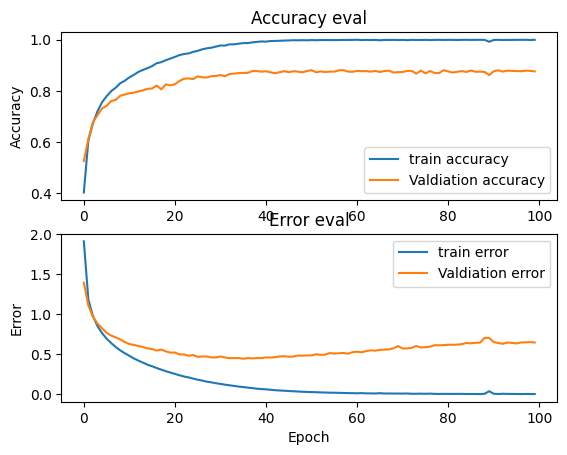

In [ ]:
plot_history(history)

As we can see that our model is actually performing very poorly as it's overfitting and after a certain number of epochs our Accuracy get's saturated and error is increasing for the validation set. So, we have to stop overfititng.
There are a lot of methods to try.
This notebook will go over a few namely :
  1. Dropout
  2. Early Stopping
  3. Regularization

Let's build another model but this time with Dropout to deal with overfitting. Which is simply put while training our model will drop out in random a % of neurons after going through each of it's dense layers or hidden layers.
Another thing we could try is using Regularization of L1 or L2.

In [ ]:
model_overfit = keras.Sequential([
   ## input layer
   keras.layers.Flatten(input_shape =(X.shape[1],)) ,

   ## 1st hidden layer
   keras.layers.Dense(512, activation = "relu", kernel_regularizer = keras.regularizers.L2(0.001)),
   keras.layers.Dropout(0.3),

   ## 2nd hidden layer
   keras.layers.Dense(256, activation = "relu", kernel_regularizer = keras.regularizers.L2(0.001)),
   keras.layers.Dropout(0.3),

   ## 3rd hidden layer
   keras.layers.Dense(64, activation = "relu", kernel_regularizer = keras.regularizers.L2(0.001)),
   keras.layers.Dropout(0.3),

   ## 4th hidden layer
   keras.layers.Dense(10, activation = "softmax")
])


NameError: ignored

In [ ]:
## Compliling our Network
optimizer = keras.optimizers.Adam(learning_rate = 0.0001)
model_overfit.compile(optimizer = optimizer,
              loss = "sparse_categorical_crossentropy",
              metrics=["accuracy"])

model_overfit.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 58)                0         
                                                                 
 dense_4 (Dense)             (None, 512)               30208     
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_5 (Dense)             (None, 256)               131328    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_6 (Dense)             (None, 64)                16448     
                                                                 
 dropout_2 (Dropout)         (None, 64)               

In [ ]:
## Let's Train this model again on X_train and y_train

history_overfit = model_overfit.fit( X_train,  y_train,
          validation_split=0.2,
          batch_size = 32 ,
          epochs = 100 )

Epoch 1/100
175/175 [==============================] - 2s 5ms/step - loss: 2.8319 - accuracy: 0.2687 - val_loss: 2.3140 - val_accuracy: 0.4274
Epoch 2/100
175/175 [==============================] - 1s 4ms/step - loss: 2.3047 - accuracy: 0.4004 - val_loss: 1.9793 - val_accuracy: 0.5118
Epoch 3/100
175/175 [==============================] - 1s 4ms/step - loss: 2.0887 - accuracy: 0.4575 - val_loss: 1.8114 - val_accuracy: 0.5504
Epoch 4/100
175/175 [==============================] - 1s 4ms/step - loss: 1.9547 - accuracy: 0.4950 - val_loss: 1.7010 - val_accuracy: 0.5983
Epoch 5/100
175/175 [==============================] - 1s 4ms/step - loss: 1.8514 - accuracy: 0.5316 - val_loss: 1.6192 - val_accuracy: 0.6319
Epoch 6/100
175/175 [==============================] - 1s 4ms/step - loss: 1.7699 - accuracy: 0.5619 - val_loss: 1.5488 - val_accuracy: 0.6540
Epoch 7/100
175/175 [==============================] - 1s 4ms/step - loss: 1.7059 - accuracy: 0.5799 - val_loss: 1.4970 - val_accuracy: 0.6669

Let's plot the graph of Accuracy and Error Vs Epochs for Training and Validation Set again.

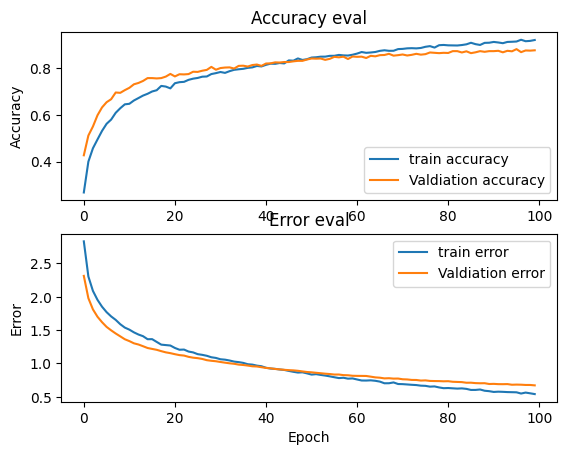

In [ ]:
plot_history(history_overfit)

As we can see our model is performing way better than before. Both Accuray and Error are following the same trend. We can observe that our Validation Accuracy is falling behind the train accuracy so we can perhaps use some early stopping criterias like simply decreacsing the number of epochs by looking at the above graph. 60 epochs might be a good enough for this case.

## **Feature Extraction**
There's no one way to select the set of features for model training. And with regards to memory limit and as I wanted to make a CNN model on the features, I chose the features that gave spectrogram images.

In [ ]:
def extract_mfcc3(dataset_path, json_path, n_mfcc=13, n_fft=2048, hop_length=512, num_segments=5, batch_size=10):
    """
    dataset_path : The GTZAN folder
    json_path : path of the final JSON file
    n_mfcc : number of Mel frequency cepstral coefficients
    n_fft : number of samples for Fast Fourier Transform
    hop_length : hop length for MFCC calculation
    num_segments : number of segments per audio
    batch_size : number of audio files to process in each batch
    """

    # Create/overwrite the JSON file (initialize it as empty)
    with open(json_path, 'w') as json_file:
        pass

    num_samples_per_segment = int(SAMPLES_PER_TRACK / num_segments)
    expected_num_mfcc_vec_per_segment = math.ceil(num_samples_per_segment / hop_length)

    # Loop through all the genres
    for i, (dirpath, dirnames, filenames) in tqdm(enumerate(os.walk(dataset_path))):

        # Ensure that we're not at root level
        if dirpath is not dataset_path:

            # Saving the semantic label from the folder names
            dirpath_components = dirpath.split("/")
            semantic_label = dirpath_components[-1]
            print("\nProcessing {}".format(semantic_label))

            # Process files for a specific genre
            audio_files = [os.path.join(dirpath, f) for f in filenames]

            # Calculate the total number of batches required
            num_batches = math.ceil(len(audio_files) / batch_size)

            # Batch-wise processing
            for batch_idx in range(num_batches):
                # Clear the data dictionary for the new batch
                data = {
                    "mapping": [], ## Genres , like the Jazz , Hip-hop etc
                    "mfcc": [],
                    "mfcc_delta": [],
                    "mfcc_delta_delta": [],
                    "labels": [], ## The numeric representation of the genres like 0,2 upto 9.
                    "mel_spectrogram": [],
                    "contrast": [],
                    "chroma": []
                }

                start_idx = batch_idx * batch_size
                end_idx = min(start_idx + batch_size, len(audio_files))
                batch_files = audio_files[start_idx:end_idx]

                for file_path in batch_files:
                    signal, sr = librosa.load(file_path, sr=SAMPLE_RATE)

                    # Process segments extracting MFCC and storing into the dict
                    for s in range(num_segments):
                        start_sample = num_samples_per_segment * s
                        finish_sample = start_sample + num_samples_per_segment

                        ## Feature extraction


                        mfcc = librosa.feature.mfcc(y=signal[start_sample:finish_sample],
                                                    sr=sr,
                                                    n_mfcc=n_mfcc,
                                                    n_fft=n_fft,
                                                    hop_length=hop_length)
                        mfcc = mfcc.T

                        # First derivative of MFCC
                        mfcc_delta = librosa.feature.delta(mfcc)

                        # Second derivative of MFCC
                        delta2_mfcc = librosa.feature.delta(mfcc, order=2)

                        # Mel Spectrogram
                        mel_spectrogram = librosa.feature.melspectrogram(y=signal[start_sample:finish_sample],
                                                                        sr=sr,
                                                                        n_fft=n_fft,
                                                                        hop_length=hop_length)
                        mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)

                        # Spectral Contrast
                        contrast = librosa.feature.spectral_contrast(y=signal[start_sample:finish_sample],
                                                                      sr=sr,
                                                                      n_fft=n_fft,
                                                                      hop_length=hop_length)

                        # Chroma feature
                        chroma = librosa.feature.chroma_stft(y=signal[start_sample:finish_sample],
                                                             n_fft=n_fft,
                                                              sr=sr,hop_length=hop_length)

                        # Store MFCC for segment if it has the expected length
                        if len(mfcc) == expected_num_mfcc_vec_per_segment:
                            data["mfcc"].append(mfcc.tolist())
                            data["mfcc_delta"].append(mfcc_delta.tolist())
                            data["mfcc_delta_delta"].append(delta2_mfcc.tolist())
                            data["labels"].append(i - 1)
                            data["mel_spectrogram"].append(mel_spectrogram.tolist())
                            data["contrast"].append(contrast.tolist())
                            data["chroma"].append(chroma.tolist())
                            data["mapping"].append(semantic_label)
                            print(f"{file_path}, segment {s}")

                # Save this batch of data to the JSON file
                with open(json_path, 'a') as json_file:
                    json.dump(data, json_file)
                    json_file.write('\n')

In [ ]:
for key, value in extracted_features_CNN.items():
    if isinstance(value, list):  # Check if the value is a list
        print(f"{key}: {len(value)} entries")
    else:
        print(f"{key}: {value}")

mapping: 10 entries
mfcc: 4998 entries
mfcc_delta: 4998 entries
mfcc_delta_delta: 4998 entries
labels: 4998 entries
mel_spectrogram: 4998 entries
contrast: 4998 entries
chroma: 4998 entries


In [ ]:
extracted_features_CNN= extract_mfcc3(DATASET_PATH, JSON_PATH) ## Calling the function to save all our extracted features

0it [00:00, ?it/s]


Processing metal
/content/drive/MyDrive/GTZAN_Dataset/genres_original/metal/metal.00002.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/metal/metal.00002.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/metal/metal.00002.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/metal/metal.00002.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/metal/metal.00002.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/genres_original/metal/metal.00000.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/metal/metal.00000.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/metal/metal.00000.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/metal/metal.00000.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/metal/metal.00000.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/genres_original/metal/metal.00001.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset

2it [02:22, 71.46s/it]


Processing classical
/content/drive/MyDrive/GTZAN_Dataset/genres_original/classical/classical.00001.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/classical/classical.00001.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/classical/classical.00001.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/classical/classical.00001.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/classical/classical.00001.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/genres_original/classical/classical.00002.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/classical/classical.00002.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/classical/classical.00002.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/classical/classical.00002.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/classical/classical.00002.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/g

3it [04:42, 99.79s/it]


Processing pop
/content/drive/MyDrive/GTZAN_Dataset/genres_original/pop/pop.00006.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/pop/pop.00006.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/pop/pop.00006.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/pop/pop.00006.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/pop/pop.00006.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/genres_original/pop/pop.00004.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/pop/pop.00004.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/pop/pop.00004.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/pop/pop.00004.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/pop/pop.00004.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/genres_original/pop/pop.00005.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/pop/pop.00005.wav, segment 1


4it [06:55, 112.18s/it]


Processing country
/content/drive/MyDrive/GTZAN_Dataset/genres_original/country/country.00000.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/country/country.00000.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/country/country.00000.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/country/country.00000.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/country/country.00000.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/genres_original/country/country.00001.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/country/country.00001.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/country/country.00001.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/country/country.00001.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/country/country.00001.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/genres_original/country/country.00005.wav, 

5it [09:06, 118.92s/it]


Processing disco
/content/drive/MyDrive/GTZAN_Dataset/genres_original/disco/disco.00002.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/disco/disco.00002.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/disco/disco.00002.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/disco/disco.00002.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/disco/disco.00002.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/genres_original/disco/disco.00003.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/disco/disco.00003.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/disco/disco.00003.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/disco/disco.00003.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/disco/disco.00003.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/genres_original/disco/disco.00000.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset

6it [11:23, 124.94s/it]


Processing reggae
/content/drive/MyDrive/GTZAN_Dataset/genres_original/reggae/reggae.00003.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/reggae/reggae.00003.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/reggae/reggae.00003.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/reggae/reggae.00003.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/reggae/reggae.00003.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/genres_original/reggae/reggae.00001.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/reggae/reggae.00001.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/reggae/reggae.00001.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/reggae/reggae.00001.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/reggae/reggae.00001.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/genres_original/reggae/reggae.00000.wav, segment 0
/content/driv

7it [13:37, 127.55s/it]


Processing blues
/content/drive/MyDrive/GTZAN_Dataset/genres_original/blues/blues.00007.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/blues/blues.00007.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/blues/blues.00007.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/blues/blues.00007.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/blues/blues.00007.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/genres_original/blues/blues.00006.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/blues/blues.00006.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/blues/blues.00006.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/blues/blues.00006.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/blues/blues.00006.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/genres_original/blues/blues.00001.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset

8it [15:47, 128.51s/it]


Processing jazz
/content/drive/MyDrive/GTZAN_Dataset/genres_original/jazz/jazz.00002.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/jazz/jazz.00002.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/jazz/jazz.00002.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/jazz/jazz.00002.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/jazz/jazz.00002.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/genres_original/jazz/jazz.00005.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/jazz/jazz.00005.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/jazz/jazz.00005.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/jazz/jazz.00005.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/jazz/jazz.00005.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/genres_original/jazz/jazz.00003.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/jazz/j

9it [17:58, 129.27s/it]


Processing rock
/content/drive/MyDrive/GTZAN_Dataset/genres_original/rock/rock.00006.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/rock/rock.00006.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/rock/rock.00006.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/rock/rock.00006.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/rock/rock.00006.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/genres_original/rock/rock.00007.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/rock/rock.00007.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/rock/rock.00007.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/rock/rock.00007.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/rock/rock.00007.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/genres_original/rock/rock.00003.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/rock/r

10it [20:20, 133.20s/it]


Processing hiphop
/content/drive/MyDrive/GTZAN_Dataset/genres_original/hiphop/hiphop.00000.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/hiphop/hiphop.00000.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/hiphop/hiphop.00000.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/hiphop/hiphop.00000.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/hiphop/hiphop.00000.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/genres_original/hiphop/hiphop.00011.wav, segment 0
/content/drive/MyDrive/GTZAN_Dataset/genres_original/hiphop/hiphop.00011.wav, segment 1
/content/drive/MyDrive/GTZAN_Dataset/genres_original/hiphop/hiphop.00011.wav, segment 2
/content/drive/MyDrive/GTZAN_Dataset/genres_original/hiphop/hiphop.00011.wav, segment 3
/content/drive/MyDrive/GTZAN_Dataset/genres_original/hiphop/hiphop.00011.wav, segment 4
/content/drive/MyDrive/GTZAN_Dataset/genres_original/hiphop/hiphop.00001.wav, segment 0
/content/driv

11it [22:39, 123.59s/it]


As we have saved each of the features in batches and each of the batches are seperated by a new line. So, to make the complete dataset again for further use we are going to write a new function where we read the JSON file and store each of the features in lists and later convert into numpy.array.

In [ ]:
def load_data(data_path, num_samples= None):
  """ Loads training dataset from json file.

  : param data_path(str): Path to json file containing data
  : return X (np.array): Inputs
  : return y (np.array): Targets
  """
  ## Initialize lists for data

  X_mfcc = []
  X_mel_spectrogram = []
  X_contrast = []
  X_chroma = []
  y = []
  mappings = []

  ## Open and read the JSON file line by line using a simple for loop

  with open(data_path, 'r') as fp:
    for line in fp:

      ## As we have used append mode('a') to write and batching so the entire file is not a json object rather each line is. We can't use .load here, we need to read line by line of string
      data = json.loads(line) ## .loads() deserializes each line(JSON string) into Python dictionary.

      ## Append data to the lists

      X_mfcc.extend(data["mfcc"])
      X_mel_spectrogram.extend(data["mel_spectrogram"])
      X_contrast.extend(data["contrast"])
      X_chroma.extend(data["chroma"])
      y.extend(data["labels"]) # Get labels from the dictionary
      mappings.extend(data["mapping"])

      # Break the loop if we've reached the desired number of samples
      if num_samples and len(y) >= num_samples:
        break
  # Truncate lists if we have loaded more than num_samples
  if num_samples:
      X_mfcc = X_mfcc[:num_samples]
      X_mel_spectrogram = X_mel_spectrogram[:num_samples]
      X_contrast = X_contrast[:num_samples]
      X_chroma = X_chroma[:num_samples]
      y = y[:num_samples]

  print(np.array(X_mfcc).shape)
  print(np.array(X_mel_spectrogram).shape)
  print(np.array(X_contrast).shape)
  print(np.array(X_chroma).shape)

  X_mel_spectrogram = np.transpose(np.array(X_mel_spectrogram), (0, 2, 1))
  X_contrast = np.transpose(np.array(X_contrast), (0, 2, 1))
  X_chroma = np.transpose(np.array(X_chroma), (0, 2, 1))

  print(np.array(X_mfcc).shape)
  print(np.array(X_mel_spectrogram).shape)
  print(np.array(X_contrast).shape)
  print(np.array(X_chroma).shape)

  ## Convert lists to numpy arrays
  ## Stack all the features horizontally or side by side for each time frame
  ## This step will concatenate the feature arrays along the last dimension
  X = np.concatenate([
        np.array(X_mfcc),
        np.array(X_mel_spectrogram),
        np.array(X_contrast),
        np.array(X_chroma)
    ], axis=-1)

  y = np.array(y)

  return X, y, mappings



In [ ]:
def load_data1(data_path, samples_per_genre=200):
    X_mfcc = []
    X_mel_spectrogram = []
    X_contrast = []
    X_chroma = []
    y = []

    genre_sample_count = {genre: 0 for genre in genre_dict.keys()}

    with open(data_path, 'r') as fp:
        for line in fp:
            data = json.loads(line)

            for label in data["labels"]:
                genre = index_to_genre_mapping[label]

                if genre_sample_count[genre] < samples_per_genre:
                    X_mfcc.extend(data["mfcc"])
                    X_mel_spectrogram.extend(data["mel_spectrogram"])
                    X_contrast.extend(data["contrast"])
                    X_chroma.extend(data["chroma"])
                    y.extend(data["labels"])
                    genre_sample_count[genre] += 1

    X_mel_spectrogram = np.transpose(np.array(X_mel_spectrogram), (0, 2, 1))
    X_contrast = np.transpose(np.array(X_contrast), (0, 2, 1))
    X_chroma = np.transpose(np.array(X_chroma), (0, 2, 1))

    X = np.concatenate([
        np.array(X_mfcc),
        np.array(X_mel_spectrogram),
        np.array(X_contrast),
        np.array(X_chroma)
    ], axis=-1)

    y = np.array(y)

    return X, y

## **Sequential Model:**
Let's use our new features to train our sequential model that deals with overfitting.

In [ ]:
def prepare_dataset(data_path, test_size , validation_size):

  """
  Prepare the dataset for training.

  extracted_features: The dictionary containing features and labels.
  test_size: Proportion of the dataset to include in the test split.
  validation_size: Proportion of the training dataset to include in the validation split.
  """
  ## Load the data

  X, y, _ = load_data(data_path, num_samples = 2000)

  ## Create train/test split
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, random_state= 42)

  ## Create train / validation split
  X_train , X_validation , y_train , y_validation = train_test_split(X_train, y_train, test_size = validation_size)



  return X_train, X_validation , X_test , y_train , y_validation , y_test


In [ ]:
X_train , X_validation, X_test , y_train , y_validation , y_test = prepare_dataset(JSON_PATH, 0.25 , 0.2)

(2000, 259, 13)
(2000, 128, 259)
(2000, 7, 259)
(2000, 12, 259)
(2000, 259, 13)
(2000, 259, 128)
(2000, 259, 7)
(2000, 259, 12)


In [ ]:
X_train.shape

(1200, 259, 160)

In [ ]:
model_overfit = keras.Sequential([
    # input layer
    keras.layers.Flatten(input_shape=(X_train.shape[1],X_train.shape[2])),
    # 1st hidden layer
    keras.layers.Dense(512, activation="relu", kernel_regularizer=keras.regularizers.L2(0.001)),
    keras.layers.Dropout(0.3),
    # 2nd hidden layer
    keras.layers.Dense(256, activation="relu", kernel_regularizer=keras.regularizers.L2(0.001)),
    keras.layers.Dropout(0.3),
    # 3rd hidden layer
    keras.layers.Dense(64, activation="relu", kernel_regularizer=keras.regularizers.L2(0.001)),
    keras.layers.Dropout(0.3),
    # 4th hidden layer
    keras.layers.Dense(10, activation="softmax")
])

In [ ]:
model = keras.Sequential([
   ## input layer
   keras.layers.Flatten(input_shape =(X_train.shape[1],X_train.shape[2])) ,

   ## 1st hidden layer
   keras.layers.Dense(512, activation = "relu"),

   ## 2nd hidden layer
   keras.layers.Dense(256, activation = "relu"),

   ## 3rd hidden layer
   keras.layers.Dense(64, activation = "relu"),

   ## 4th hidden layer
   keras.layers.Dense(10, activation = "softmax")
])

In [ ]:
## Compliling our Network
optimizer = keras.optimizers.Adam(learning_rate = 0.0001)
model.compile(optimizer = optimizer,
              loss = "sparse_categorical_crossentropy",
              metrics=["accuracy"])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 41440)             0         
                                                                 
 dense_4 (Dense)             (None, 512)               21217792  
                                                                 
 dense_5 (Dense)             (None, 256)               131328    
                                                                 
 dense_6 (Dense)             (None, 64)                16448     
                                                                 
 dense_7 (Dense)             (None, 10)                650       
                                                                 
Total params: 21,366,218
Trainable params: 21,366,218
Non-trainable params: 0
_________________________________________________________________


In [ ]:
## Let's Train this model again on X_train and y_train

history = model.fit(X_train, y_train,
                            epochs=30,
                            batch_size=32,
                            validation_data=(X_validation, y_validation))

Epoch 1/30
38/38 [==============================] - 33s 856ms/step - loss: 4.6763 - accuracy: 0.8650 - val_loss: 3.6363 - val_accuracy: 0.8867
Epoch 2/30
38/38 [==============================] - 23s 611ms/step - loss: 0.5542 - accuracy: 0.9542 - val_loss: 1.6569 - val_accuracy: 0.9100
Epoch 3/30
38/38 [==============================] - 21s 549ms/step - loss: 0.2055 - accuracy: 0.9808 - val_loss: 1.1225 - val_accuracy: 0.9200
Epoch 4/30
38/38 [==============================] - 20s 539ms/step - loss: 0.9576 - accuracy: 0.9258 - val_loss: 1.6753 - val_accuracy: 0.9100
Epoch 5/30
38/38 [==============================] - 20s 539ms/step - loss: 0.3520 - accuracy: 0.9625 - val_loss: 2.4262 - val_accuracy: 0.8900
Epoch 6/30
38/38 [==============================] - 20s 538ms/step - loss: 0.3830 - accuracy: 0.9642 - val_loss: 1.5183 - val_accuracy: 0.9233
Epoch 7/30
38/38 [==============================] - 21s 552ms/step - loss: 0.1503 - accuracy: 0.9767 - val_loss: 1.1432 - val_accuracy: 0.9300

In [ ]:
## evaluate the CNN on the test set
test_error, test_accuracy = model.evaluate(X_test, y_test, verbose = 1)
print(f"Accuracy on test set is: {test_accuracy}")

16/16 [==============================] - 2s 93ms/step - loss: 1.7870 - accuracy: 0.9260
Accuracy on test set is: 0.9259999990463257


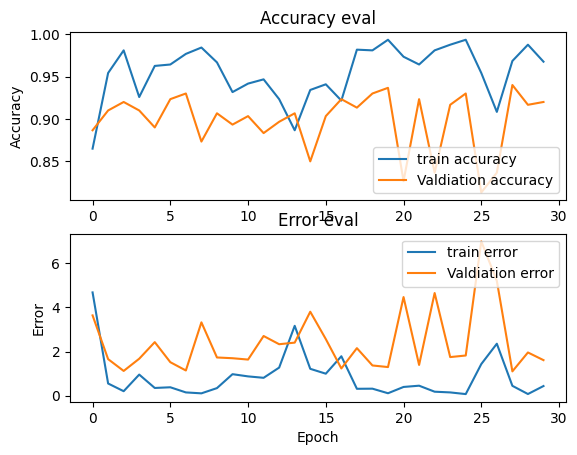

In [ ]:
plot_history(history) ## Plotting the accuracy vs loss on train and validation set

In [ ]:
X_train , X_validation, X_test , y_train , y_validation , y_test = prepare_dataset(JSON_PATH, 0.25 , 0.2)
## Compliling our Network
optimizer = keras.optimizers.Adam(learning_rate = 0.0001)
model_overfit.compile(optimizer = optimizer,
              loss = "sparse_categorical_crossentropy",
              metrics=["accuracy"])

model_overfit.summary()

(2000, 259, 13)
(2000, 128, 259)
(2000, 7, 259)
(2000, 12, 259)
(2000, 259, 13)
(2000, 259, 128)
(2000, 259, 7)
(2000, 259, 12)
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 41440)             0         
                                                                 
 dense_4 (Dense)             (None, 512)               21217792  
                                                                 
 dropout_3 (Dropout)         (None, 512)               0         
                                                                 
 dense_5 (Dense)             (None, 256)               131328    
                                                                 
 dropout_4 (Dropout)         (None, 256)               0         
                                                                 
 dense_6 (Dense)             (None, 64)                164

In [ ]:
## Let's Train this model again on X_train and y_train

history_overfit = model_overfit.fit(X_train, y_train,
                            epochs=100,
                            batch_size=32,
                            validation_data=(X_validation, y_validation))

Epoch 1/100
38/38 [==============================] - 23s 552ms/step - loss: 110.0500 - accuracy: 0.2333 - val_loss: 8.0781 - val_accuracy: 0.6933
Epoch 2/100
38/38 [==============================] - 20s 530ms/step - loss: 10.8551 - accuracy: 0.3050 - val_loss: 3.5633 - val_accuracy: 0.2333
Epoch 3/100
38/38 [==============================] - 20s 527ms/step - loss: 4.7061 - accuracy: 0.2267 - val_loss: 3.5233 - val_accuracy: 0.2600
Epoch 4/100
38/38 [==============================] - 25s 671ms/step - loss: 4.8061 - accuracy: 0.2367 - val_loss: 3.5074 - val_accuracy: 0.2433
Epoch 5/100
38/38 [==============================] - 26s 658ms/step - loss: 3.4950 - accuracy: 0.2267 - val_loss: 3.4814 - val_accuracy: 0.2400
Epoch 6/100
38/38 [==============================] - 23s 610ms/step - loss: 3.7837 - accuracy: 0.2592 - val_loss: 3.4579 - val_accuracy: 0.2367
Epoch 7/100
38/38 [==============================] - 22s 575ms/step - loss: 3.6864 - accuracy: 0.2525 - val_loss: 3.4356 - val_accura

In [ ]:
plot_history(history_overfit) ## Plotting the accuracy & loss per epoch on train and validation set

NameError: ignored

Here we can see that using the base sequential model is better as it performs better than the overfit model(model_overfit)

## **CNN model:**

As we have seen from the features extraction part of the audio clips that a lot of features are actually spectrogram like and so maybe we should also try using CNN-Convolutional Neural Network. These networks are specially used for extracting image features.

In [ ]:
def prepare_dataset_CNN(data_path, test_size , validation_size):

  """
  Prepare the dataset for training.

  extracted_features_CNN: The dictionary containing features and labels.
  test_size: Proportion of the dataset to include in the test split.
  validation_size: Proportion of the training dataset to include in the validation split.
  """
  ## Load the data

  X, y, _ = load_data(data_path, num_samples = 2000)

  ## Create train/test split
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, random_state= 42)

  ## Create train / validation split
  X_train , X_validation , y_train , y_validation = train_test_split(X_train, y_train, test_size = validation_size)

  ## making 2d to 3d array as CNN needs 3d inputs

  X_train = X_train[..., np.newaxis]
  X_validation = X_validation[..., np.newaxis]
  X_test = X_test[..., np.newaxis]

  return X_train, X_validation , X_test , y_train , y_validation , y_test


## **Let's Build the Model**

In [ ]:
def build_model(input_shape):

  ## create model
  model = keras.Sequential()

  ## 1st conv layer
  model.add(keras.layers.Conv2D(32, (3,3), activation = 'relu', input_shape = input_shape))
  model.add(keras.layers.MaxPool2D((3,3), strides =(2,2), padding ='same'))
  model.add(keras.layers.BatchNormalization())

  ## 2nd conv layer
  model.add(keras.layers.Conv2D(32, (3,3), activation = 'relu', input_shape = input_shape))
  model.add(keras.layers.MaxPool2D((3,3), strides =(2,2), padding ='same'))
  model.add(keras.layers.BatchNormalization())

  ## 3rd conv layer
  model.add(keras.layers.Conv2D(32, (2,2), activation = 'relu', input_shape = input_shape))
  model.add(keras.layers.MaxPool2D((2,2), strides =(2,2), padding ='same'))
  model.add(keras.layers.BatchNormalization())

  ## flatten the output and feed it into dense layer

  model.add(keras.layers.Flatten())
  model.add(keras.layers.Dense(64, activation = 'relu'))
  model.add(keras.layers.Dropout(0.3))


  ## output layer
  model.add(keras.layers.Dense(10, activation = 'softmax'))

  return model


In [ ]:
X_train , X_validation, X_test , y_train , y_validation , y_test = prepare_dataset_CNN(JSON_PATH, 0.25 , 0.2)

## build the CNN net
input_shape = (X_train.shape[1], X_train.shape[2], X_train.shape[3])
model_CNN = build_model(input_shape)

## compile the network
optimizer = keras.optimizers.Adam(learning_rate = 0.0001)
model_CNN.compile(optimizer = optimizer,
              loss = 'sparse_categorical_crossentropy',
              metrics = ['accuracy'])

## train the CNN
history = model_CNN.fit(X_train, y_train, validation_data = (X_validation , y_validation), batch_size= 32, epochs= 30)

## evaluate the CNN on the test set
test_error, test_accuracy = model_CNN.evaluate(X_test, y_test, verbose = 1)
print(f"Accuracy on test set is: {test_accuracy}")


(2000, 259, 13)
(2000, 128, 259)
(2000, 7, 259)
(2000, 12, 259)
(2000, 259, 13)
(2000, 259, 128)
(2000, 259, 7)
(2000, 259, 12)
Epoch 1/30
38/38 [==============================] - 105s 3s/step - loss: 0.8970 - accuracy: 0.6933 - val_loss: 1.8892 - val_accuracy: 0.2833
Epoch 2/30
38/38 [==============================] - 108s 3s/step - loss: 0.3348 - accuracy: 0.8858 - val_loss: 1.2914 - val_accuracy: 0.4067
Epoch 3/30
38/38 [==============================] - 107s 3s/step - loss: 0.2132 - accuracy: 0.9333 - val_loss: 0.6358 - val_accuracy: 0.7800
Epoch 4/30
38/38 [==============================] - 108s 3s/step - loss: 0.1534 - accuracy: 0.9517 - val_loss: 0.3716 - val_accuracy: 0.8800
Epoch 5/30
38/38 [==============================] - 112s 3s/step - loss: 0.1037 - accuracy: 0.9692 - val_loss: 0.3030 - val_accuracy: 0.9000
Epoch 6/30
38/38 [==============================] - 105s 3s/step - loss: 0.1192 - accuracy: 0.9667 - val_loss: 0.2422 - val_accuracy: 0.9133
Epoch 7/30
38/38 [========

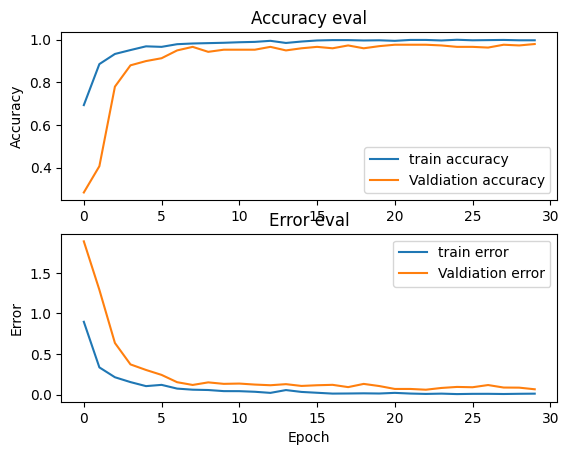

In [ ]:
plot_history(history) ## Plotting the accuracy & loss per epoch on train and validation set

In [ ]:
X_train.shape

(1200, 259, 160, 1)

## **Prediction**

In [ ]:
def predict(model, X, y):

  X = X[np.newaxis, ...] ## 3d to 4d array

  prediction = model_CNN.predict(X) ## X should be a 4d array
  predicted_index = np.argmax(prediction, axis = 1)
  print(f"Expected index: {y}, Predicted Index:{predicted_index}")
  return predicted_index

In [ ]:
## Make predictions on test sample
X = X_test[100]
y = y_test[100]

predict(model_CNN, X, y)

1/1 [==============================] - 0s 356ms/step
Expected index: 1, Predicted Index:[1]


array([1])

## **LSTM: Long Short Term Memory Network**
Let's Build an LSTM which is better than a simple RNN and which can store more context or remember more pattern from a longer sequence of data. Which is good as audio data such as music in our case has a important patterns for genre detection.

In [ ]:
def build_model_LSTM(input_shape, l2_lambda=0.001, dropout_rate=0.5):

  """
  Build an LSTM model with L2 regularization and dropout.

  :param input_shape: Tuple, shape of the input data.
  :param l2_lambda: Float, regularization strength for L2 regularization.
  :param dropout_rate: Float, dropout rate for Dropout layers.
  :return: Compiled Keras model.

  """
  ## create model
  model = keras.Sequential()

  # 1st LSTM layer with L2 regularization and dropout
  model.add(keras.layers.LSTM(64, input_shape=input_shape, return_sequences=True, kernel_regularizer=l2(l2_lambda)))
  model.add(keras.layers.Dropout(dropout_rate))

  # 2nd LSTM layer with L2 regularization
  model.add(keras.layers.LSTM(64, kernel_regularizer=l2(l2_lambda)))

  # Dense layer with L2 regularization and dropout
  model.add(keras.layers.Dense(64, activation='relu', kernel_regularizer=l2(l2_lambda)))
  model.add(keras.layers.Dropout(dropout_rate))

  ## output layer
  model.add(keras.layers.Dense(10, activation = 'softmax'))

  return model


In [ ]:
X_train , X_validation, X_test , y_train , y_validation , y_test = prepare_dataset(JSON_PATH, 0.25 , 0.2)

## build the LSTM net
input_shape = (X_train.shape[1], X_train.shape[2])
model_LSTM = build_model_LSTM(input_shape)

## compile the network
optimizer = keras.optimizers.Adam(learning_rate = 0.0001)
model_LSTM.compile(optimizer = optimizer,
              loss = 'sparse_categorical_crossentropy',
              metrics = ['accuracy'])

## train the LSTM
history_LSTM = model_LSTM.fit(X_train, y_train, validation_data = (X_validation , y_validation), batch_size= 32, epochs= 30)

## evaluate the LSTM on the test set
test_error, test_accuracy = model_LSTM.evaluate(X_test, y_test, verbose = 1)
print(f"Accuracy on test set is: {test_accuracy}")

(2000, 259, 13)
(2000, 128, 259)
(2000, 7, 259)
(2000, 12, 259)
(2000, 259, 13)
(2000, 259, 128)
(2000, 259, 7)
(2000, 259, 12)
Epoch 1/30
38/38 [==============================] - 21s 433ms/step - loss: 2.5120 - accuracy: 0.2192 - val_loss: 2.2719 - val_accuracy: 0.3467
Epoch 2/30
38/38 [==============================] - 15s 402ms/step - loss: 2.2150 - accuracy: 0.3317 - val_loss: 2.0333 - val_accuracy: 0.3800
Epoch 3/30
38/38 [==============================] - 15s 405ms/step - loss: 2.0122 - accuracy: 0.3675 - val_loss: 1.7989 - val_accuracy: 0.4367
Epoch 4/30
38/38 [==============================] - 15s 404ms/step - loss: 1.7910 - accuracy: 0.4725 - val_loss: 1.5152 - val_accuracy: 0.6433
Epoch 5/30
38/38 [==============================] - 16s 416ms/step - loss: 1.5770 - accuracy: 0.5592 - val_loss: 1.2628 - val_accuracy: 0.6933
Epoch 6/30
38/38 [==============================] - 14s 362ms/step - loss: 1.3331 - accuracy: 0.6750 - val_loss: 1.0561 - val_accuracy: 0.7833
Epoch 7/30
38/

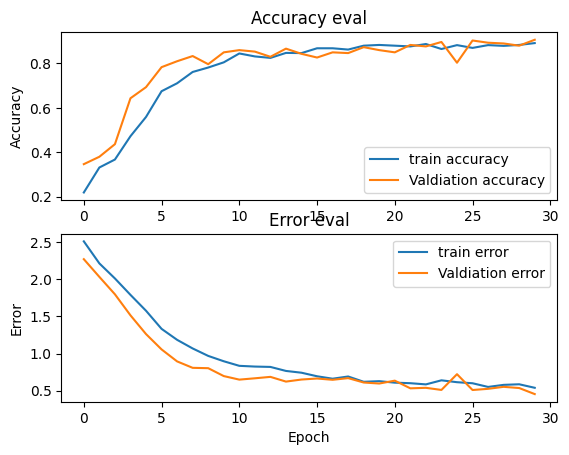

In [ ]:
plot_history(history_LSTM)

### **Creating  a Dictionary for Model Predictions**
Creating a Dictionary which reads our previously created JSON file with all the features and then gives back the mappings for each genres. This is being done cause our model will give the index prediction which are our labels(Targets or Outputs) and that's numeric. So, we need to convert it back to human readable form, genre mapping.

In [ ]:
def create_index_to_genre_mapping(json_path):
    unique_genres = {}
    with open(json_path, 'r') as file:
        for line in file:
            data = json.loads(line)
            for genre in data['mapping']:
                if genre not in unique_genres:
                    unique_genres[genre] = len(unique_genres)
    return unique_genres
index_to_genre_mapping = create_index_to_genre_mapping(JSON_PATH)

In [ ]:
index_to_genre_mapping

{'metal': 0,
 'classical': 1,
 'pop': 2,
 'country': 3,
 'disco': 4,
 'reggae': 5,
 'blues': 6,
 'jazz': 7,
 'rock': 8,
 'hiphop': 9}

Inverting the dictionary to use in prediction

In [ ]:
genre_to_index_mapping = {v: k for k, v in index_to_genre_mapping.items()}

In [ ]:
genre_to_index_mapping

{0: 'metal',
 1: 'classical',
 2: 'pop',
 3: 'country',
 4: 'disco',
 5: 'reggae',
 6: 'blues',
 7: 'jazz',
 8: 'rock',
 9: 'hiphop'}

## **Predicting Songs using the LSTM model**
Let's do some predictions and use our dictionary to convert the labels(Outputs) into Genre Mapping.

In [ ]:
def predict(model, X, y, genre_to_index_mapping):
    # Reshape X for a single sample
    X = X[np.newaxis, ...]  # Adds an extra dimension for batch size

    # Make a prediction
    prediction = model.predict(X)
    predicted_index = np.argmax(prediction, axis=1)

    # Translate the predicted index to a genre
    predicted_genre = genre_to_index_mapping[predicted_index[0]]
    expected_genre = genre_to_index_mapping[y]

    print(f"Expected genre: {expected_genre} (Index: {y}), Predicted Genre: {predicted_genre} (Index: {predicted_index[0]})")
    return predicted_index

In [ ]:
# Use the function for a test sample
X = X_test[200]
y = y_test[200]

predict(model_LSTM, X, y, genre_to_index_mapping)

1/1 [==============================] - 0s 87ms/step
Expected genre: country (Index: 3), Predicted Genre: country (Index: 3)


array([3])

## **Model Comparision:**
So, after training and evaluating all the models against validation and test set. We can compare our test accuracy score and see that our LSTM model performs better than all else. Even maybe slightly better than our CNN model but as LSTM can remember patterns from a longer sequence so we will use that as our final model.
We will go ahead and save our model for deployment. We will use this model to make a Bento Service later using BentoMl to deploy it.

## **Saving the model**
Let's save the model for further use locally. We do not need to use a callback function to save all the model checkpoints rather we can save the whole model with all of it's weights and then download it locally for further work.

In [ ]:
model_LSTM.save("model_LSTM.keras")

In [ ]:
!pip freeze > requirements.txt

**Installing Dependencies**

In [ ]:
!pip install -r https://raw.githubusercontent.com/bentoml/BentoML/main/examples/quickstart/requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.8/50.8 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.6/200.6 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.3/135.3 kB 13.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.0/75.0 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.5/57.5 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.9/103.9 kB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.0/70.0 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.7/59.7 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 15.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.9/76.9 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import bentoml

bentoml.sklearn.save_model("LSTM_genre", history_LSTM)

**Accessing Saved Model via bentoml models CLI command:**

In [ ]:
!bentoml models get LSTM_genre:latest

Converting 'LSTM_genre' to lowercase: 'lstm_genre'.
Error: [models] `get` failed: no Models with name 'lstm_genre' exist in BentoML store <osfs '/root/bentoml/models'>


In [ ]:
!bentoml models list

 Tag  Module  Size  Creation Time 


**Verifying if a saved model can be loaded correctly:**

In [ ]:
loaded_model = bentoml.sklearn.load_model("LSTM_genre:latest")

In [ ]:
X = X_test[100]
y = y_test[100]

predict(loaded_model, X, y)

## **Pipeline to extract audio features from a single audio file**
We are going to create a pipeline which accepts a single audio file from the user and extracts is features by dividing them into 30 sec segments and then using our model tp predict the outcome of each 30 sec clip and voting the final prediction. Our model has been trained with 30 sec clips of audios with a given Sample Rate. So, we will do some pre-processing of the audio file so that we feed the model the audio data in it's expected format.

**Load the Song:**
First, we need a function to load the uploaded song and ensure it's at the required sample rate.

In [ ]:
def load_song(song_path, sr= 22050):
  signal, _ = librosa.load(song_path, sr = sr)
  return signal

**Segment Extraction:**
From the loaded song, extract multiple 30-second segments.

In [ ]:
def extract_segments(signal,  sr, segment_duration = 30, num_segments = 5):

  ## Calculate the number of samples in the segment duration
  segment_samples = int(segment_duration * sr)

  ## Calculate the step size between segments
  step = int((len(signal) - segment_samples)/(num_segments - 1))

  ## Extract segements
  segments = [signal[i:i+segment_samples] for i in range(0, len(signal) - segment_samples + 1 , step)]

  return segments[ : num_segments]

**Feature Extraction:**
Extracting the same features on which our models have been trained but from one 30 sec segment. This function returns the extracted data into the format which our model expects.

In [ ]:
def extract_features(segment, sr, n_mfcc=13, n_fft=2048, hop_length=512):

    # MFCC
    mfcc = librosa.feature.mfcc(y=segment, sr=sr, n_mfcc=n_mfcc, n_fft=n_fft, hop_length=hop_length)
    mfcc = mfcc.T

    # First derivative of MFCC
    mfcc_delta = librosa.feature.delta(mfcc)

    # Second derivative of MFCC
    delta2_mfcc = librosa.feature.delta(mfcc, order=2)

    # Mel Spectrogram
    mel_spectrogram = librosa.feature.melspectrogram(y=segment, sr=sr, n_fft=n_fft, hop_length=hop_length)
    mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)

    # Spectral Contrast
    contrast = librosa.feature.spectral_contrast(y=segment, sr=sr, n_fft=n_fft, hop_length=hop_length)

    # Chroma feature
    chroma = librosa.feature.chroma_stft(y=segment, n_fft=n_fft, sr=sr, hop_length=hop_length)

    # Concatenate features into one numpy array
    features = np.concatenate([
        mfcc,
        mfcc_delta,
        delta2_mfcc,
        mel_spectrogram,
        contrast,
        chroma
    ], axis=-1)

    return features

**Predict on Segments:**
Predict the genre for each 30-second segment:

In [ ]:
def predict_segments(model, segments, sr):
  predictions = []
  for segment in segments :
    features = extract_features(segment , sr)
    features = np.expand_dims(features, axis = 0)
    prediction = model.predict(features)
    predicted_label = np.argmax(prediction , axis = 1 )[0]
    predictions.append(predicted_label)
  return predictions

**Voting:**
Use the mode (most common value) from the segment predictions to decide the final genre:

In [ ]:
from scipy import stats

def vote(predictions):
    mode = stats.mode(predictions)
    return mode.mode[0]

**Main Prediction Function:** This function will combine all the above functions and give us a final prediction.

In [ ]:
def predict_song(model, song_path , sr= 22050 , segment_duration = 30, num_segments= 5):

  ## Load the song
  signal = load_song(song_path , sr)

  ## Extract segments
  segments = extract_segments(signal , sr , segment_duration, num_segments)

  ## Get predictions for each segment
  predictions = predict_segments(model, segments, sr)

  ## Vote to get the final prediction
  final_prediction = vote(predictions)

  return final_prediction